#### Ski Resort Project University of Zürich 2020
## The test notebook for case2_Atzmaening 840-1200m
## setup 1: 9000 experiments 200 scenarios & 45 Policies

This notebook is used for the visualization of the "ema_workbench Ski_Resort" project. The outputs of ema_workbench experiments which have been saved after executing the python codes (XLR_Framework.py) are loaded and various visualization techniques are used and maps are produced.

### *Reading the libraries*

Main libraries are imported here, although there a few libraries that are imported later.

In [1]:
import os
import os.path
import random
from operator import add
from datetime import datetime, date, timedelta

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

import shutil
import ema_workbench
import time

from scipy.integrate import simps
from numpy import trapz
from decimal import Decimal, ROUND_DOWN, ROUND_UP

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\em_framework\optimization.py:48: ImportWarning: platypus based optimization not available
  warnings.warn("platypus based optimization not available", ImportWarning)


### *Seting up the display extent*

In [2]:
pd.set_option('display.max_columns',69)
pd.set_option('display.max_rows',119)

## XLRM Framework

## Step 5: Model deployment

### Loading the outputs

In this section using the load_results class of ema_workbench we load the saved results of python experiments (.tar.gz)

In [3]:
from ema_workbench import load_results, ema_logging
from ema_workbench.analysis.pairs_plotting import (pairs_lines, pairs_scatter,
                                                   pairs_density)
ema_logging.log_to_stderr(level=ema_logging.DEFAULT_LEVEL)

# load the data
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case1_sattel-hochstuckli\setup1'
root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case2_Atzmaening\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case3_hoch-ybrig\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1339\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1822\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2000\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2500\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case5_champex\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b1564\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2141\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2584\setup1'

rootOut = os.path.join(root, 'Results_3')
fh = os.path.join(rootOut, '9000_runs.tar.gz')
experiments, outcomes = load_results(fh)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\prim.py:31: ImportWarning: altair based interactive inspection not available
  "inspection not available"), ImportWarning)
[MainProcess/INFO] results loaded succesfully from C:\Saeid\Prj100\SA_2\snowModelUZH\case2_Atzmaening\setup1\Results_3\9000_runs.tar.gz


Check and see if data has been loaded properly or not?

12 parameters:

X2fM, X3iPot, X5temp, X6tempArt, Xfactor1, xClimateModel, xRCP, x1SnowThershold, xGoodDays, scenario, policy, model

In [4]:
print(experiments.shape)
print(list(experiments.keys()))
print(list(outcomes.keys()))

(9000, 12)
['X2fM', 'X3iPot', 'X5temp', 'X6tempArt', 'Xfactor1', 'xClimateModel', 'xRCP', 'x1SnowThershold', 'xGoodDays', 'scenario', 'policy', 'model']
['S_Ave_GoodDay', 'GCM_RCM', 'S_GoodDay', 'S_Ave_ArtSnow', 'S_Ave_Financial', 'S_Ave_Likelihood', 'tipping_points']


#### S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm) 
#### GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)
#### Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)
#### S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)
#### S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort
#### S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points
#### tipping_points: Number of tipping points (1981-2100)

## Step 6: Visualization of the EMA_Workbench Results

 the analysis package of ema_workbench contains a wide range of techniques for visualization and analysis of the results from series of computational experiments. 

### Visualization with ema-workbench - part1

### Pairwise Scatter Plot

[MainProcess/DEBUG] generating pairwise scatter plot


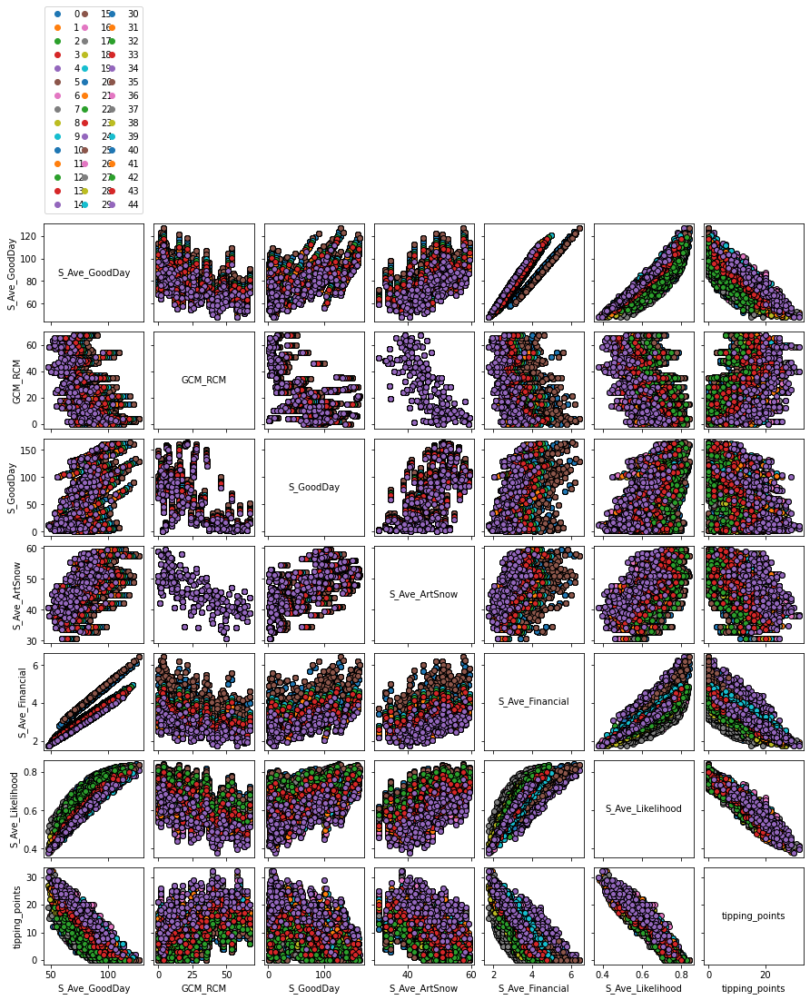

In [5]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, outcomes, group_by='policy',
                                         legend=True)
fig.set_size_inches(15, 15)

fig.savefig(os.path.join(rootOut, 'SA_All_outputs.svg'), format='svg', dpi=600)
#fig.savefig(os.path.join(rootOut, 'SA_All_outputs.tiff'), format='tiff', dpi=600)


plt.show()

In [9]:
outcomes2 = outcomes
outcomes2 = outcomes2.pop('GCM_RCM')

KeyError: 'GCM_RCM'

In [10]:
print(outcomes2)

{'S_Ave_GoodDay': array([93.44535656, 86.05202134, 61.92431073, ..., 83.9541339 ,
       55.76000904, 67.6486548 ]), 'S_GoodDay': array([[107.54666667, 102.29281481, 158.8702963 , ...,  20.13755556,
         28.38859259,  35.74018519],
       [ 86.94340741, 137.12103704, 137.77792593, ...,  12.0882963 ,
         95.19088889,  55.6302963 ],
       [ 65.78525926,  91.738     , 164.50077778, ...,   0.7727037 ,
         19.23118519,   5.52503704],
       ...,
       [ 60.27226667,  69.54503333, 165.51013333, ...,  60.14756667,
         84.18053333,  23.00043333],
       [ 42.6342    , 101.18343333, 109.01283333, ...,  26.42673333,
         66.88716667,  99.9792    ],
       [140.9342    , 104.5245    , 116.81373333, ...,  10.2414    ,
         12.65236667,  14.6075    ]]), 'S_Ave_ArtSnow': array([41.17618644, 44.37338983, 44.32449153, ..., 54.57432203,
       39.62152542, 44.47923729]), 'S_Ave_Financial': array([3.69822034, 3.39432203, 2.43152542, ..., 3.10915254, 2.00457627,
       2.4748

In [11]:
new_dict = {key:val for key, val in outcomes2.items() if key != 'GCM_RCM'} 

In [12]:
print(list(new_dict.keys()))

['S_Ave_GoodDay', 'S_GoodDay', 'S_Ave_ArtSnow', 'S_Ave_Financial', 'S_Ave_Likelihood', 'tipping_points']


[MainProcess/DEBUG] generating pairwise scatter plot
No handles with labels found to put in legend.


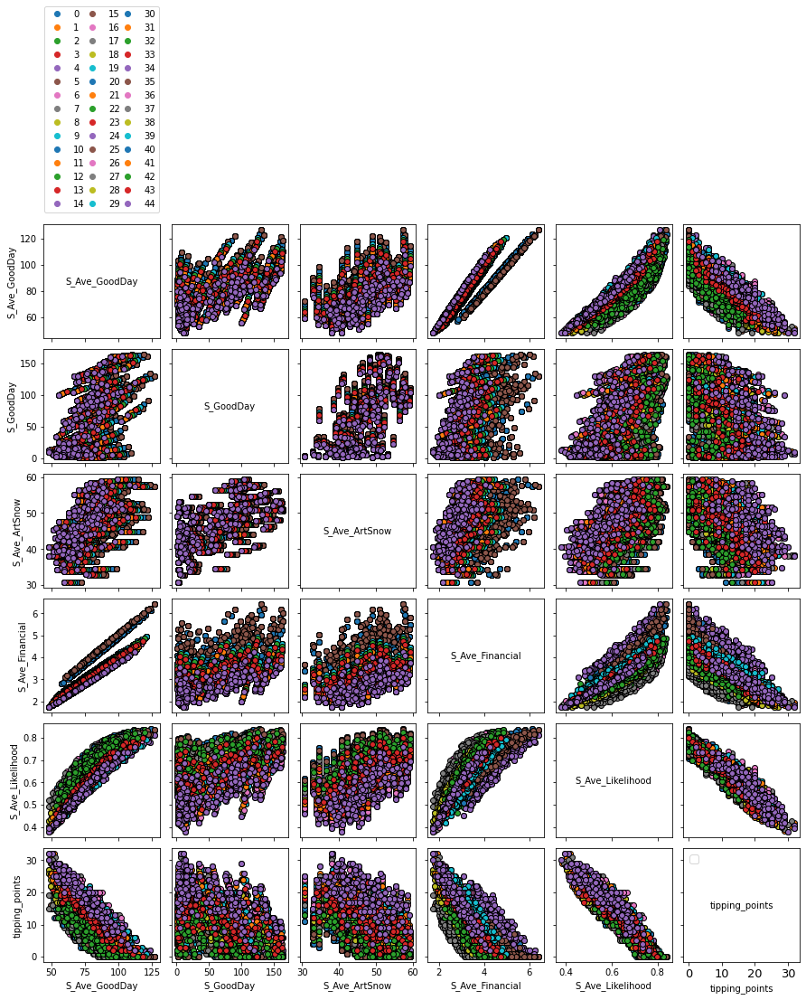

In [13]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, new_dict, group_by='policy',
                                         legend=True)

plt.yticks(fontsize=13)
plt.xticks(fontsize=13)
plt.legend(fontsize=13)

fig.set_size_inches(15, 15)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2.svg'), format='svg', dpi=300)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2.tiff'), format='tiff', dpi=300)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2_2.tiff'), format='tiff', dpi=150)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2_2.jpg'), format='jpg', dpi=150)



plt.show()

### Moving the outputs to the folder of results
### Assign the address of outputs folders

In [14]:
import tarfile

shutil.move(os.path.join(root, 'Outputs_py'), os.path.join(rootOut, 'Outputs_py'))
shutil.move(os.path.join(root, 'outSeason'), os.path.join(rootOut, 'outSeason')) 
shutil.move(os.path.join(root, 'outSeason_Likelihood_survival'), os.path.join(rootOut, 'outSeason_Likelihood_survival')) 
shutil.move(os.path.join(root, 'outSeasonArt'), os.path.join(rootOut, 'outSeasonArt')) 
shutil.move(os.path.join(root, 'outSeasonFinancial'), os.path.join(rootOut, 'outSeasonFinancial')) 

rootVisualization = rootOut
with tarfile.open(os.path.join(rootVisualization, '9000_runs.tar.gz'),"r") as zip_ref:
    zip_ref.extractall(os.path.join(rootVisualization, '9000_runs'))

# We have five types of outputs
outDaily = os.path.join(rootVisualization, 'Outputs_py')
outSeasonTippingPoint = os.path.join(rootVisualization, 'outSeason')
outSeason_Likelihood_survival = os.path.join(rootVisualization, 'outSeason_Likelihood_survival')
outSeasonArtificialSnowPossibility = os.path.join(rootVisualization, 'outSeasonArt')
outSeasonFinancial = os.path.join(rootVisualization, 'outSeasonFinancial')
out_ema = os.path.join(rootVisualization, '9000_runs')

In [15]:
df4_ema_experiment = pd.read_csv(os.path.join(out_ema, 'experiments.csv'))
df4_ema_y = pd.read_csv(os.path.join(out_ema, 'S_Ave_GoodDay.csv'), header=None)
df4_ema_y.columns = ["Yout"]
df4_ema_y1 = pd.read_csv(os.path.join(out_ema, 'GCM_RCM.csv'), header=None)
df4_ema_y1.columns = ["Yout1"]
df4_ema_y3 = pd.read_csv(os.path.join(out_ema, 'S_GoodDay.csv'), header=None)
df4_ema_y3.columns = ["Yout3" + "_" + str(i) for i in range(118)]
df4_ema_y4 = pd.read_csv(os.path.join(out_ema, 'S_Ave_ArtSnow.csv'), header=None)
df4_ema_y4.columns = ["Yout4"]
df4_ema_y5 = pd.read_csv(os.path.join(out_ema, 'S_Ave_Financial.csv'), header=None)
df4_ema_y5.columns = ["Yout5"]
df4_ema_y6 = pd.read_csv(os.path.join(out_ema, 'S_Ave_Likelihood.csv'), header=None)
df4_ema_y6.columns = ["Yout6"]
df4_ema_y7 = pd.read_csv(os.path.join(out_ema, 'tipping_points.csv'), header=None)
df4_ema_y7.columns = ["Yout7"]

#### Make a database from the outputs of ema framework by concatinating the every output and experiments table

In [17]:
df_final_ema = pd.concat((df4_ema_experiment, df4_ema_y, df4_ema_y1, df4_ema_y3, df4_ema_y4, df4_ema_y5, df4_ema_y6, df4_ema_y7 ), axis = 1)
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
0,1.191161,902.965567,5.814916,-1.665461,1.219984,0.483592,3.0,270.0,60.0,0,0,UZHModel,93.445357,51,107.546667,102.292815,158.870296,103.085444,146.764037,141.802333,140.164444,161.497259,151.354333,142.589519,109.720185,143.364963,136.491556,133.661630,159.908000,171.515778,123.533778,76.905852,41.656185,72.274185,...,65.089519,110.375111,36.394926,35.019148,21.234889,74.919407,131.875037,31.898148,46.483815,109.410296,44.436815,121.092185,116.558519,20.194000,33.876481,38.107222,9.243963,11.692333,21.799148,44.478852,50.622370,41.118037,12.225741,27.076926,13.170111,98.849222,31.571852,20.137556,28.388593,35.740185,41.176186,3.698220,0.742535,7.0
1,1.279832,1090.643646,5.876523,-1.907386,2.341139,0.174160,2.0,270.0,60.0,1,0,UZHModel,86.052021,15,86.943407,137.121037,137.777926,123.560296,122.345889,150.362481,142.617444,117.216556,118.825333,71.162407,128.546296,146.028741,121.779000,95.342074,130.789704,118.622296,107.811963,41.638926,64.647222,89.610889,...,69.493630,44.571296,36.839444,108.824667,88.817593,16.833630,61.204333,85.803481,82.735741,30.741370,98.667148,73.126111,87.578815,96.008926,65.707481,33.709926,11.569963,38.792556,38.564185,91.885370,145.210407,108.817259,63.485667,112.860000,18.829741,116.935407,82.296296,12.088296,95.190889,55.630296,44.373390,3.394322,0.762868,1.0
2,1.585717,1066.577812,5.314054,-1.289036,2.288920,0.024030,3.0,270.0,60.0,2,0,UZHModel,61.924311,37,65.785259,91.738000,164.500778,123.181407,104.285667,83.156000,38.992444,135.558852,67.643926,110.300481,55.610889,144.022444,92.085556,122.714037,82.688815,86.795556,91.457111,109.769074,40.104037,75.740519,...,40.291037,116.568481,19.480148,49.286667,10.540444,35.841963,21.424741,91.996889,10.186296,9.291333,10.405815,46.719519,16.959889,5.876444,9.558593,11.522741,29.478222,30.183111,12.783481,62.208741,23.478667,8.312296,5.862074,76.921185,5.800926,48.701185,4.380926,0.772704,19.231185,5.525037,44.324492,2.431525,0.611793,11.0
3,1.392948,1078.387572,4.779334,-1.342517,1.816506,0.744004,2.0,270.0,60.0,3,0,UZHModel,67.299064,30,77.492741,123.360556,156.714556,104.728222,86.330000,128.731630,90.390370,94.088333,82.896593,56.333000,123.764000,139.770074,98.069704,107.025556,45.160074,139.154222,39.702778,109.129852,102.047074,105.160815,...,16.705296,22.816519,92.310926,78.490000,9.551185,68.050148,73.535519,47.439037,48.061222,74.890481,21.492444,25.447926,36.285296,94.946259,52.851259,42.161370,17.724259,18.535444,48.303741,65.272333,28.512889,69.788852,47.760519,98.131222,20.359593,45.075370,72.673889,96.752889,13.111296,24.814407,49.142966,2.651695,0.659322,7.0
4,1.508217,1012.886028,5.631448,-1.961889,0.610938,0.280354,1.0,270.0,60.0,4,0,UZHModel,106.506942,3,91.098556,75.815481,164.888889,78.333778,149.488926,85.141630,156.848037,95.352519,158.623815,156.781926,93.666259,140.003519,143.639111,129.785778,158.415815,162.829333,126.749407,115.606259,49.129444,99.133074,...,92.263778,40.082296,81.385111,67.617444,19.220481,129.492370,119.376111,124.035852,129.912074,101.053259,104.104259,104.329741,117.907111,129.463259,124.504111,148.579000,79.878593,57.185222,111.712852,25.846630,157.669630,40.338481,166.984889,109.306926,149.581815,156.062296,107.944037,58.389741,138.726963,64.032481,44.916949,4.227966,0.797712,0.0


In [21]:
df_final_ema.to_csv(os.path.join(rootVisualization, 'df_final_ema.csv'), index = False)

In [22]:
# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values
y7 = df_final_ema['Yout7'].values

In [23]:
outFolder = rootVisualization
outSeasonFolder = os.path.join(outFolder, 'outSeason')
outSeasonFinancial = os.path.join(outFolder, 'outSeasonFinancial')
outSeasonArt = os.path.join(outFolder, 'outSeasonArt')
outSeason_Likelihood_survival = os.path.join(outFolder, 'outSeason_Likelihood_survival')

In [24]:
#### 2020/07/22 ####
all_Files = []
for filename in os.walk(outSeasonFolder):
    all_Files = filename[2]
    
totalFiles_loc = []
for i in range(len(all_Files)):
    totalFiles_loc.append(os.path.join(outSeasonFolder, all_Files[i]))
    
### 2020/08/23
all_Files_fin = []
for filename in os.walk(outSeasonFinancial):
    all_Files_fin = filename[2]
    
totalFiles_loc_fin = []
for i in range(len(all_Files_fin)):
    totalFiles_loc_fin.append(os.path.join(outSeasonFinancial, all_Files_fin[i]))
    
### 2020/08/23
all_Files_Art = []
for filename in os.walk(outSeasonArt):
    all_Files_Art = filename[2]
    
totalFiles_loc_Art = []
for i in range(len(all_Files_Art)):
    totalFiles_loc_Art.append(os.path.join(outSeasonArt, all_Files_Art[i]))

### 2020/08/23
all_Files_Like = []
for filename in os.walk(outSeason_Likelihood_survival):
    all_Files_Like = filename[2]
    
totalFiles_loc_Like = []
for i in range(len(all_Files_Like)):
    totalFiles_loc_Like.append(os.path.join(outSeason_Likelihood_survival, all_Files_Like[i]))


#### Total number of outputs (csv files) in each out folder produced by our framework

In [25]:
print(len(totalFiles_loc))
print(len(totalFiles_loc_fin))
print(len(totalFiles_loc_Art))
print(len(totalFiles_loc_Like))

9000
9000
9000
9000


In [26]:
emptyMatrixGoodDays = [np.empty([119, 69]) for _ in range(len(totalFiles_loc))]
    
for i in range(0, len(totalFiles_loc), 1):
    b = []
    with open(totalFiles_loc[i], 'r') as file:
        outputReaderlines = file.readlines()
        for j in range (len(outputReaderlines)):
            b.append(outputReaderlines[j].replace('\n','').split(','))
    
    emptyMatrixGoodDays[i] = np.array(b)

### 2020/08/23
emptyMatrixfin = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_fin))]

for i in range(0, len(totalFiles_loc_fin), 1):
    b = []
    with open(totalFiles_loc_fin[i], 'r') as file:
        outputReaderlines_fin = file.readlines()
        for j in range (len(outputReaderlines_fin)):
            b.append(outputReaderlines_fin[j].replace('\n','').split(','))
    
    emptyMatrixfin[i] = np.array(b)

### 2020/08/23
emptyMatrixArt = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Art))]

for i in range(0, len(totalFiles_loc_Art), 1):
    b = []
    with open(totalFiles_loc_Art[i], 'r') as file:
        outputReaderlines_Art = file.readlines()
        for j in range (len(outputReaderlines_Art)):
            b.append(outputReaderlines_Art[j].replace('\n','').split(','))
    
    emptyMatrixArt[i] = np.array(b)
    
### 2020/08/23
emptyMatrixLike = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Like))]

for i in range(0, len(totalFiles_loc_Like), 1):
    b = []
    with open(totalFiles_loc_Like[i], 'r') as file:
        outputReaderlines_Like = file.readlines()
        for j in range (len(outputReaderlines_Like)):
            b.append(outputReaderlines_Like[j].replace('\n','').split(','))
    
    emptyMatrixLike[i] = np.array(b)

In [27]:
#matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=2)
matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=0)
matrix_fin = np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1)), axis=0)
matrix_Art = np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1)), axis=0)
matrix_Like = np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1)), axis=0)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\IPython\core\interactiveshell.py:3337: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  if (await self.run_code(code, result,  async_=asy)):


In [28]:
print(matrix_GoodDays.shape)
print(matrix_fin.shape)
print(matrix_Art.shape)
print(matrix_Like.shape)

(9000, 119, 2)
(9000, 119, 2)
(9000, 119, 2)
(9000, 119, 2)


#### Check the header of outputs

In [29]:
print(emptyMatrixGoodDays[1][0,1])
print(emptyMatrixfin[1][0,1])
print(emptyMatrixArt[1][0,1])
print(emptyMatrixLike[1][0,1])

isOverSnow_sc_45_4
Money_sc_45_4
ArtSnowPossibility_sc_45_4
isOverSnow_sc_45_4


In [30]:
matrix_GoodDays26= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP26' in emptyMatrixGoodDays[i][0,1] or \
                             '_26_' in emptyMatrixGoodDays[i][0,1] ) , axis=0) 
matrix_GoodDays45= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP45' in emptyMatrixGoodDays[i][0,1] or \
                            '_45_' in emptyMatrixGoodDays[i][0,1] ), axis=0)
matrix_GoodDays85= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP85' in emptyMatrixGoodDays[i][0,1] or \
                            '_85_' in emptyMatrixGoodDays[i][0,1]), axis=0) 

### 2020/08/23
matrix_fin26= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP26' in emptyMatrixfin[i][0,1] or \
                             '_26_' in emptyMatrixfin[i][0,1] ) , axis=0) 
matrix_fin45= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP45' in emptyMatrixfin[i][0,1] or \
                            '_45_' in emptyMatrixfin[i][0,1] ), axis=0)
matrix_fin85= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP85' in emptyMatrixfin[i][0,1] or \
                            '_85_' in emptyMatrixfin[i][0,1]), axis=0) 

### 2020/08/23
matrix_Art26= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP26' in emptyMatrixArt[i][0,1] or \
                             '_26_' in emptyMatrixArt[i][0,1] ) , axis=0) 
matrix_Art45= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP45' in emptyMatrixArt[i][0,1] or \
                            '_45_' in emptyMatrixArt[i][0,1] ), axis=0)
matrix_Art85= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP85' in emptyMatrixArt[i][0,1] or \
                            '_85_' in emptyMatrixArt[i][0,1]), axis=0) 

### 2020/08/23
matrix_Like26= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP26' in emptyMatrixLike[i][0,1] or \
                             '_26_' in emptyMatrixLike[i][0,1] ) , axis=0) 
matrix_Like45= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP45' in emptyMatrixLike[i][0,1] or \
                            '_45_' in emptyMatrixLike[i][0,1] ), axis=0)
matrix_Like85= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP85' in emptyMatrixLike[i][0,1] or \
                            '_85_' in emptyMatrixLike[i][0,1]), axis=0) 

In [31]:
print(type(matrix_GoodDays))
print(matrix_GoodDays.ndim)
print(len(matrix_GoodDays))
print(matrix_GoodDays.size)
print(matrix_GoodDays.dtype)
print(matrix_GoodDays.dtype.name)
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

<class 'numpy.ndarray'>
3
9000
2142000
<U47
str1504
#########
(2970, 119, 2)
(3015, 119, 2)
(3015, 119, 2)
9000
#########
(2970, 119, 2)
(3015, 119, 2)
(3015, 119, 2)
9000
#########
(2970, 119, 2)
(3015, 119, 2)
(3015, 119, 2)
9000
#########
(2970, 119, 2)
(3015, 119, 2)
(3015, 119, 2)
9000


In [32]:
print(matrix_GoodDays[2, 1:, 1:2].shape)
print(matrix_fin[2, 1:, 1:2].shape)
print(matrix_Art[2, 1:, 1:2].shape)
print(matrix_Like[2, 1:, 1:2].shape)

(118, 1)
(118, 1)
(118, 1)
(118, 1)


### Calculate the quantiles for each year of simulation (1981-2100)

In [33]:
q10_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.9, axis=0)


In [34]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[39.23526818]
[60.47659231]
[83.27205303]
[103.45693125]
[124.25585143]
(118, 1)
[1.529]
[2.41]
[3.43]
[4.4]
[5.401]
(118, 1)
[31.202]
[38.8725]
[46.15]
[55.1075]
[67.593]
(118, 1)
[46.45819907]
[73.57172917]
[100.]
[100.]
[100.]
(118, 1)


#### Set the parameters of making figure

In [35]:
num_Simulation = 9000
p_Step = 20
alpha_Fade = 0.04

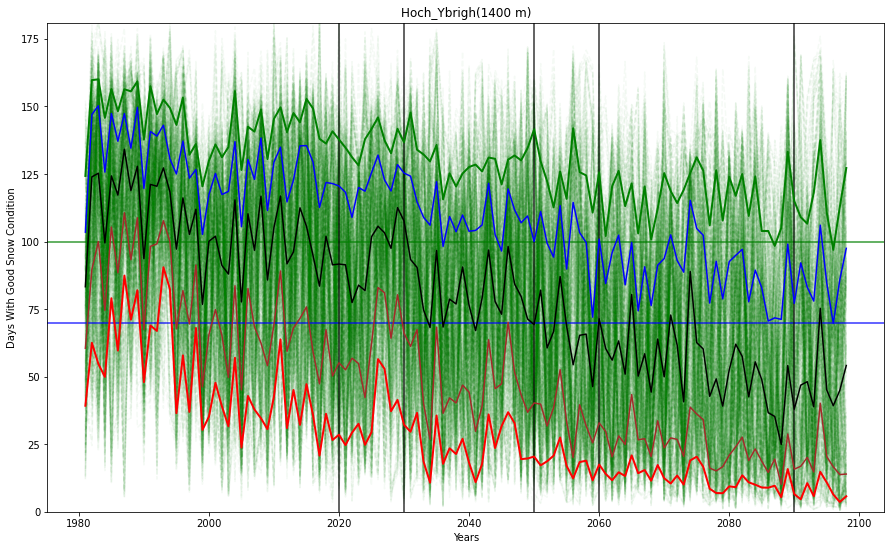

In [36]:
fig1, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_GoodDays[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=70, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=0, top =181)
axs.set_title('Hoch_Ybrigh(1400 m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig1.savefig(os.path.join(rootVisualization, 'RCP_All_number_of_day_goodSnow.svg'), format='svg', dpi=300)

plt.show()

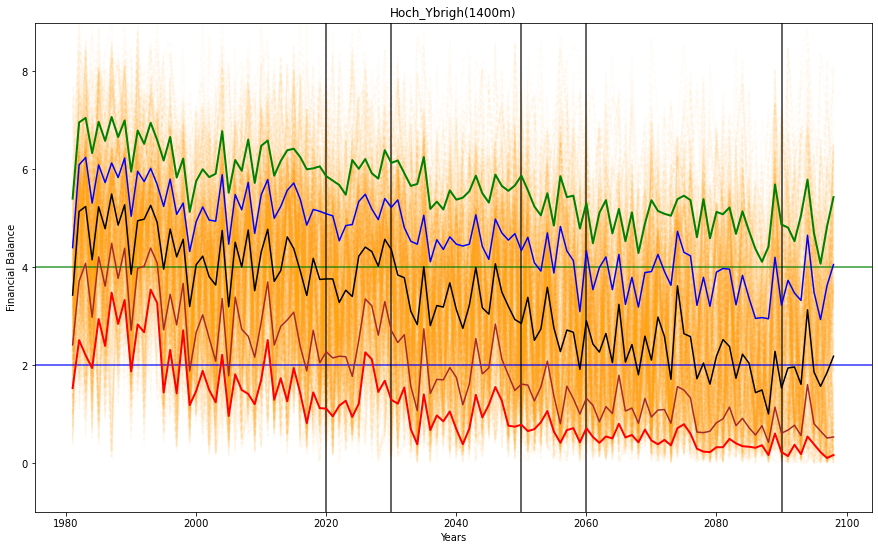

In [37]:
fig2, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_fin[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=4, color='green', alpha=0.8)
axs.axhline(y=2, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_fin, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_fin, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_fin, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_fin, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_fin, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =9)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Financial Balance')

fig2.savefig(os.path.join(rootVisualization, 'RCP_All_Financial.svg'), format='svg', dpi=300)

plt.show()

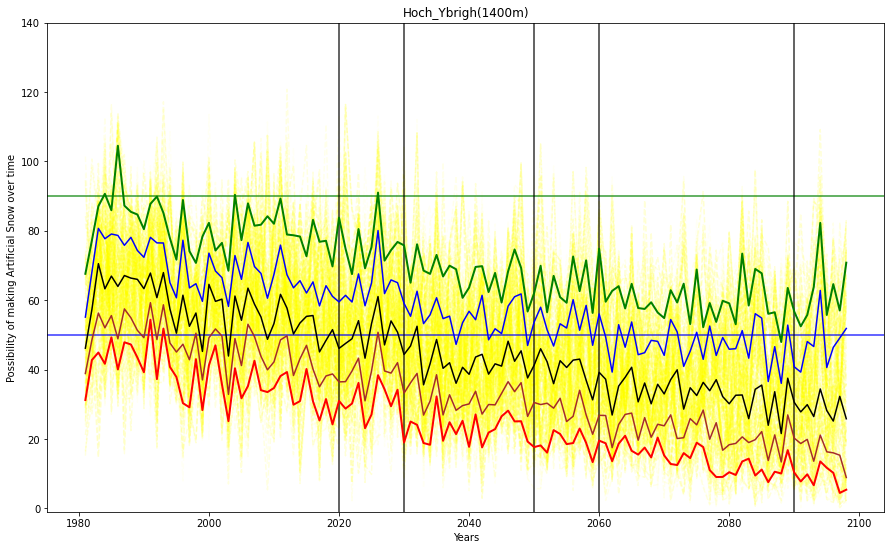

In [38]:
fig3, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_Art[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='yellow', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Art, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Art, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Art, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Art, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Art, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =140)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Possibility of making Artificial Snow over time')

fig3.savefig(os.path.join(rootVisualization, 'RCP_All_ArtSnow.svg'), format='svg', dpi=300)

plt.show()

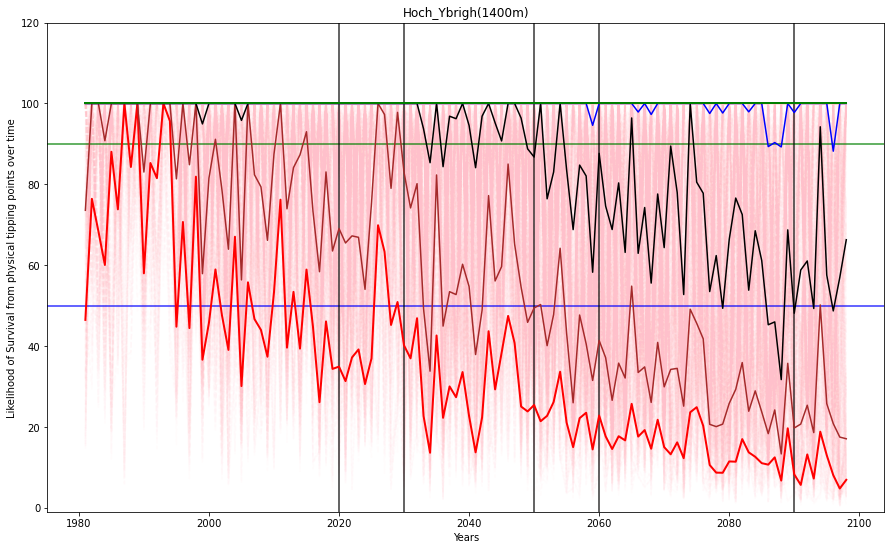

In [39]:
fig4, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_Like[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='pink', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Like, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Like, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Like, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Like, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Like, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =120)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Likelihood of Survival from physical tipping points over time')

fig4.savefig(os.path.join(rootVisualization, 'RCP_All_Likelihood.svg'), format='svg', dpi=300)

plt.show()

### Visualization with ema-workbench - part2 

## Scenario Discovery 
### A model driven approach to scenario development

There is ample literature on both CART and PRIM and their relative merits for use in scenario discovery.

S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)

Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)

S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort

S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points

tipping_points: Number of tipping points (1981-2100)

In [40]:
from ema_workbench.analysis import prim

x = experiments
y = outcomes['S_Ave_GoodDay'] < 70
prim_alg = prim.Prim(x, y, threshold=0.6)
box1 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 2460 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfact

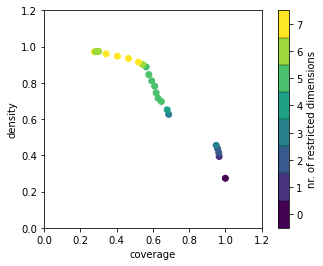

<Figure size 432x288 with 0 Axes>

In [41]:
#import mpld3
#fig, axs = plt.subplots()
#fig5, axs = plt.subplots(figsize=(15,9))
box1.show_tradeoff()
plt.show()
plt.savefig(os.path.join(rootVisualization, 'coverage_density_1.png'))
            
#mpld3.display()
#fig5.savefig(os.path.join(rootVisualization, 'box.svg'), format='svg', dpi=600)

coverage    0.520325
density     0.914286
id                15
mass        0.155556
mean        0.914286
res_dim            7
Name: 15, dtype: object

                                                            box 15  \
                                                               min   
X5temp                                                     4.50607   
X2fM                                                       1.01198   
xClimateModel                                          0.000251509   
xRCP                                                           2.5   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 240.0, 280.0, 250...   
Xfactor1                                                  0.638158   
X3iPot                                                     907.314   

                                                                    \
                                                               max   
X5temp                                                     5.37201   
X2fM    

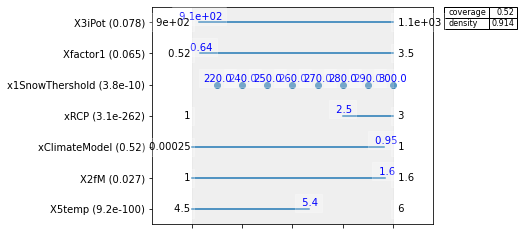

In [42]:
# Saeed : explore the inspect effect
box1.inspect(15)
box1.inspect(15, style='graph')
plt.show()

x1SnowThershold [290.0, 260.0, 300.0, 270.0, 240.0, 280.0, 250.0, 220.0, 200.0]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


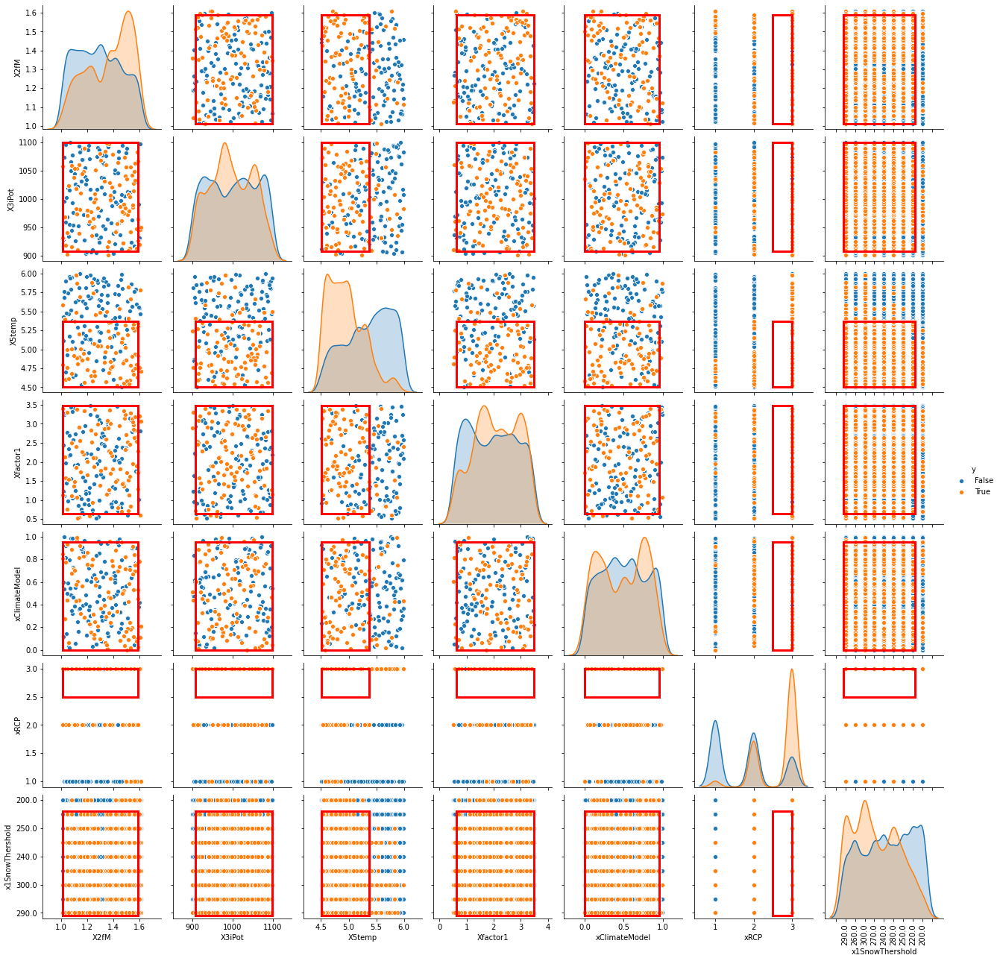

In [43]:
# fig, axs = plt.subplots()
axs1 = box1.show_pairs_scatter(15)
plt.show()
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_70.svg'), format='svg', dpi=600)
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_70.tiff'), format='tiff', dpi=300)
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_2_70.tiff'), format='tiff', dpi=150)

In [44]:
box2 = prim_alg.find_box()

[MainProcess/INFO] 8240 points remaining, containing 1720 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 0.9072164948453608, mass: 0.05388888888888889,

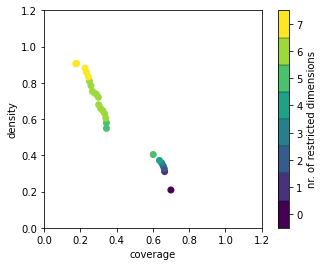

In [45]:
#import mpld3
box2.show_tradeoff()
plt.show()
#mpld3.display()
#fig.savefig(os.path.join(rootVisualization, 'box2.svg'), format='svg', dpi=600)

coverage    0.288618
density     0.735751
id                15
mass        0.107222
mean        0.735751
res_dim            6
Name: 15, dtype: object

                                                            box 15  \
                                                               min   
X5temp                                                     4.50607   
xClimateModel                                          0.000251509   
xRCP                                                           2.5   
x1SnowThershold  {290.0, 260.0, 300.0, 240.0, 280.0, 250.0, 220.0}   
X3iPot                                                     909.014   
X2fM                                                       1.03999   

                                                                    \
                                                               max   
X5temp                                                      5.5464   
xClimateModel                                             0.954154   
xRCP    

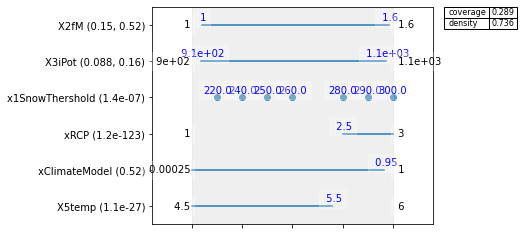

In [46]:
# Saeed : explore the inspect effect
box2.inspect(15)
box2.inspect(15, style='graph')
plt.show()

x1SnowThershold [290.0, 260.0, 300.0, 240.0, 280.0, 250.0, 220.0, 200.0, 270.0]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


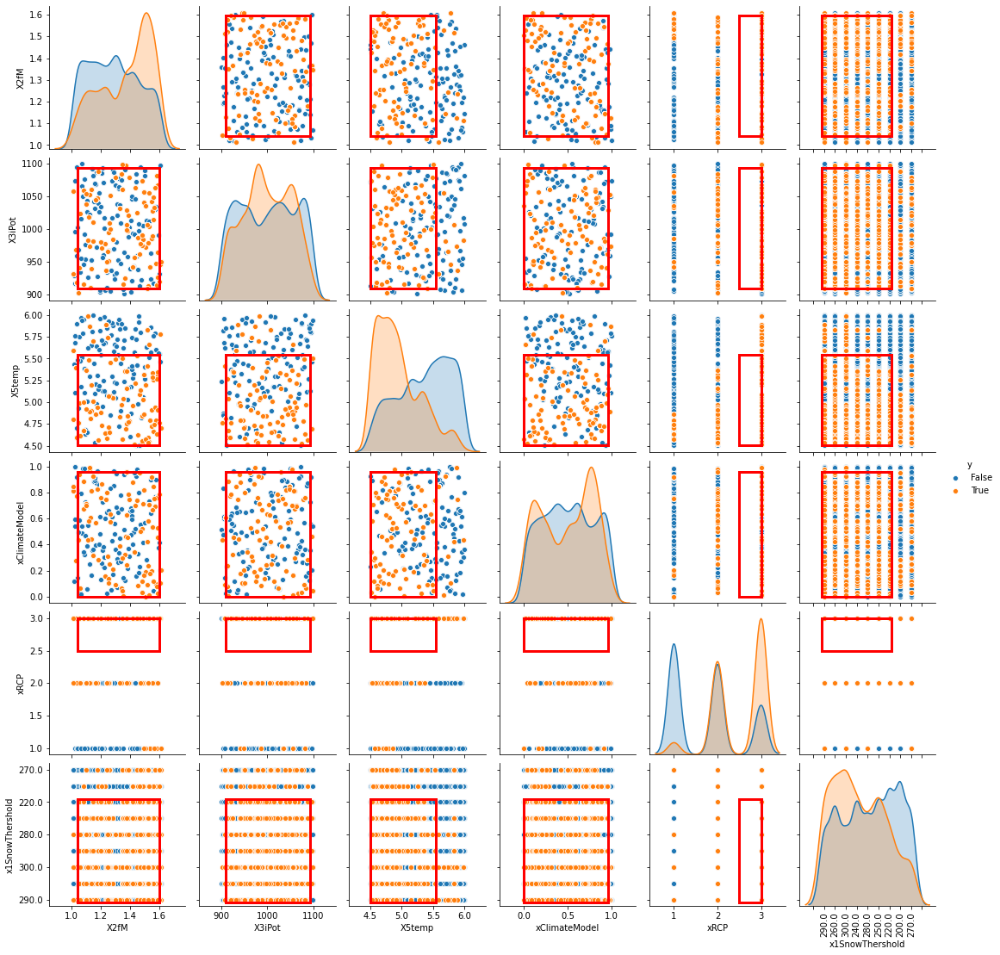

In [47]:
# fig, axs = plt.subplots()
axs2 = box2.show_pairs_scatter(15)
plt.show()
axs2.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_2_.svg'), format='svg', dpi=300)

### Artifical snow analysis

In [48]:
x = experiments
y = outcomes['S_Ave_ArtSnow'] < 40
prim_alg = prim.Prim(x, y, threshold=0.8)
box3 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 1530 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEB

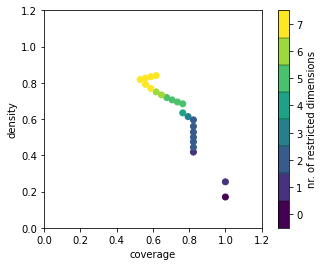

In [49]:
box3.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

coverage    0.735294
density     0.694444
id                12
mass            0.18
mean        0.694444
res_dim            5
Name: 12, dtype: object

                   box 12                                              
                      min          max                        qp values
X6tempArt       -1.996835    -1.328726    [-1.0, 8.974608480428636e-57]
X2fM             1.011982     1.565012    [-1.0, 0.0011596876829297242]
xRCP             2.500000     3.000000  [1.5560219445086855e-255, -1.0]
xClimateModel    0.096439     0.996307   [3.2702412698082936e-06, -1.0]
X3iPot         909.014253  1099.382813    [0.0009677802741682025, -1.0]



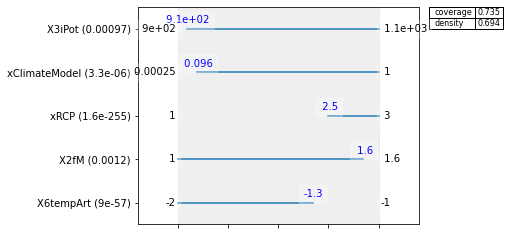

In [50]:
# Saeed : explore the inspect effect
box3.inspect(12)
box3.inspect(12, style='graph')
plt.show()

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


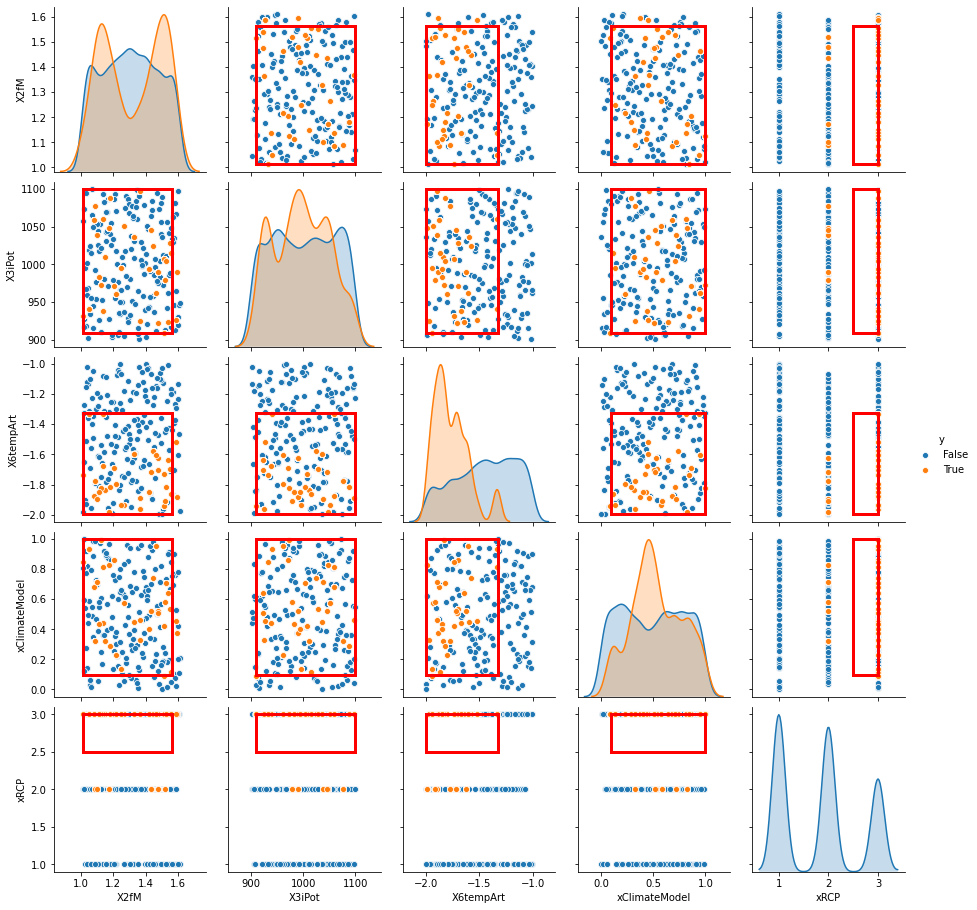

In [51]:
#fig, axs = plt.subplots()
axs4 = box3.show_pairs_scatter(12)
plt.show()
axs4.savefig(os.path.join(rootVisualization, 'multi_graphs_Artificial_40.svg'), format='tiff', dpi=300)

### Likelihood of Survival analysis

In [52]:
x = experiments
y = outcomes['S_Ave_Likelihood'] < 0.5
prim_alg = prim.Prim(x, y, threshold=0.7)
box4 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 561 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting xGoodDays
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 0.7286324786324786, mass: 0.052, coverage: 0.6078431372549019, density: 0.7286324786324786 restricted_dimensions: 7


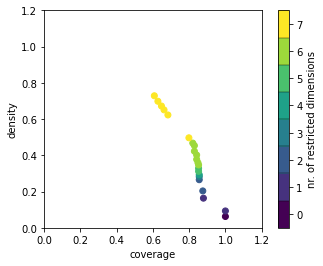

In [53]:
box4.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_liklihood.svg'), format='svg', dpi=600)

coverage    0.627451
density     0.698413
id                20
mass           0.056
mean        0.698413
res_dim            7
Name: 20, dtype: object

                                                            box 20  \
                                                               min   
X5temp                                                     4.50607   
xRCP                                                           2.5   
xGoodDays                                            {90.0, 100.0}   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 240.0, 280.0, 250...   
policy           {0, 1, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 1...   
X3iPot                                                     909.014   
X2fM                                                       1.03999   

                                                                    \
                                                               max   
X5temp                                                     5.33964   
xRCP    

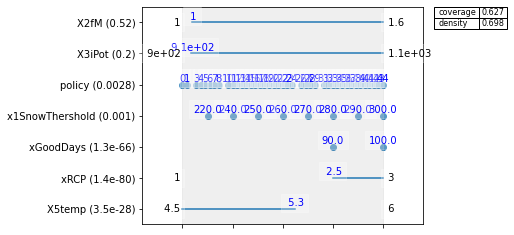

In [54]:
# Saeed : explore the inspect effect
box4.inspect(20)
box4.inspect(20, style='graph')
plt.show()

xGoodDays [80.0, 90.0, 100.0, 60.0, 70.0]
policy [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 25, 2, 30]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


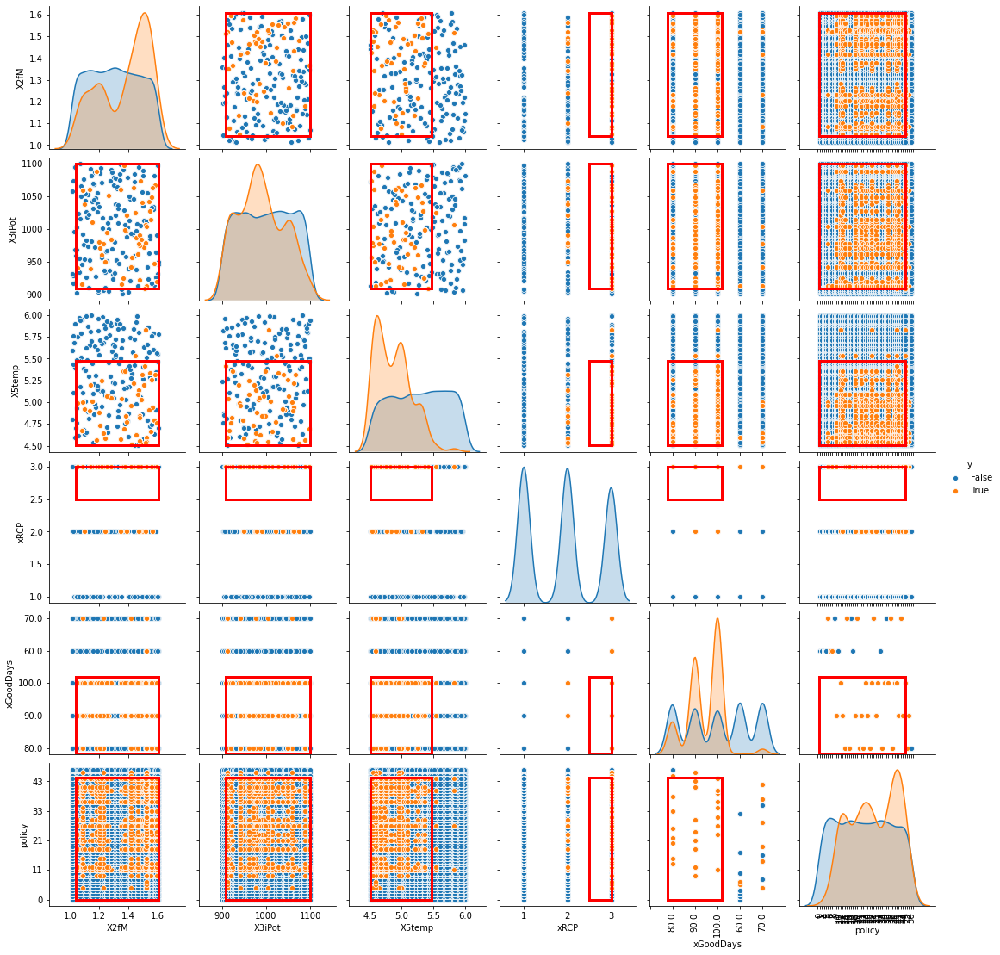

In [55]:
#fig, axs = plt.subplots()
axs3 = box4.show_pairs_scatter(15)
plt.show()
axs3.savefig(os.path.join(rootVisualization, 'multi_graphs_likehood.svg'), format='svg', dpi=600)

### Tipping points analysis

In [56]:
x = experiments
y = outcomes['tipping_points'] < 15
prim_alg = prim.Prim(x, y, threshold=0.8)
box5 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 6250 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting xGoodDays
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.14222222222222222, coverage: 0.2048, density: 1.0 restricted_dimensions: 4


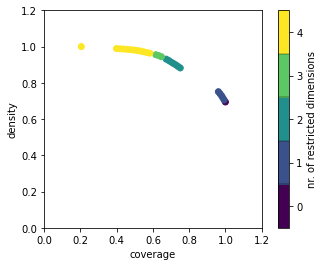

In [57]:
box5.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

coverage      0.5128
density     0.978327
id                20
mass           0.364
mean        0.978327
res_dim            4
Name: 20, dtype: object

                                                      box 20  \
                                                         min   
xRCP                                                       1   
policy     {0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 14, 15, 16, 17...   
xGoodDays                           {70.0, 80.0, 90.0, 60.0}   
X5temp                                               4.57504   

                                                              \
                                                         max   
xRCP                                                     2.5   
policy     {0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 14, 15, 16, 17...   
xGoodDays                           {70.0, 80.0, 90.0, 60.0}   
X5temp                                               5.99471   

                                           
                                qp 

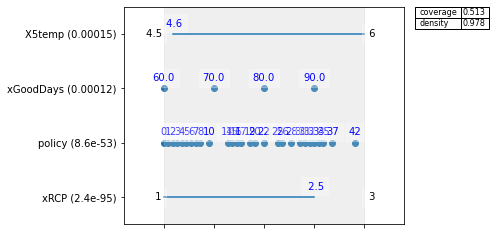

In [58]:
# Saeed : explore the inspect effect
box5.inspect(20)
box5.inspect(20, style='graph')
plt.show()

xGoodDays [70.0, 80.0, 90.0, 60.0, 100.0]
policy [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 14, 15, 16, 17, 19, 20, 22, 25, 26, 28, 30, 31, 32, 33, 34, 35, 37, 42, 36, 38, 39, 40, 9, 41, 11, 12, 13, 43, 44, 18, 21, 23, 24, 27, 29]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


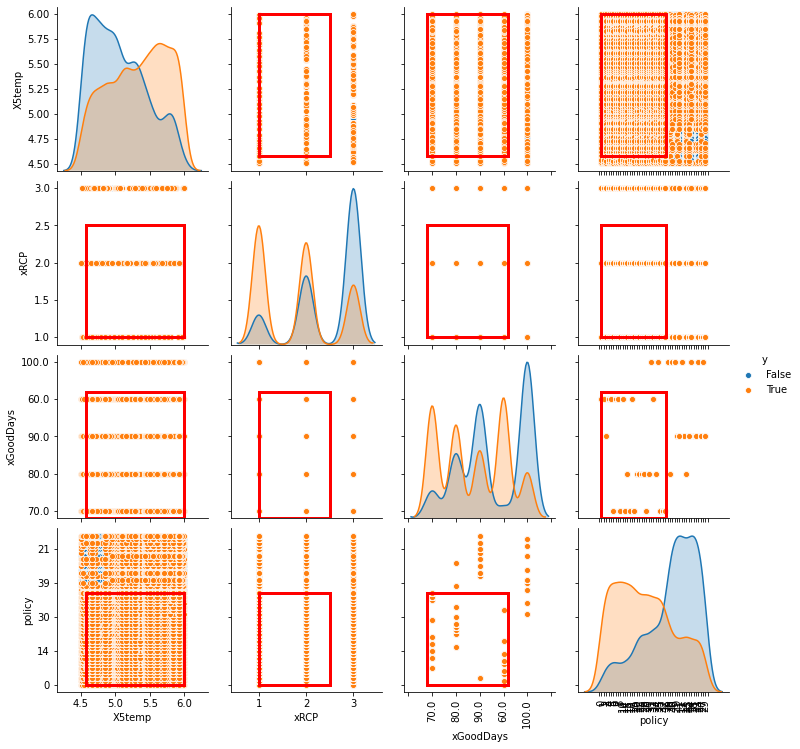

In [59]:
#fig, axs = plt.subplots()
axs5 = box5.show_pairs_scatter(20)
plt.show()

axs5.savefig(os.path.join(rootVisualization, 'multigraphs_tippingpoints.svg'), format='svg', dpi=300)

### Visualization with ema-workbench - part3

In [60]:
experiments2 = experiments
experiments2 = experiments2.pop('policy')

In [61]:
new_dict_experiments = {key:val for key, val in experiments2.items() if key != 'policy'} 

In [62]:
sns.set(font_scale=1.5)

ax6 = sns.heatmap(fs, cmap='viridis', annot=True,
                  vmin=0, linewidths=0.14,linecolor="grey",
                  cbar_kws={'label': 'features ranks','shrink': 0.1})

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category


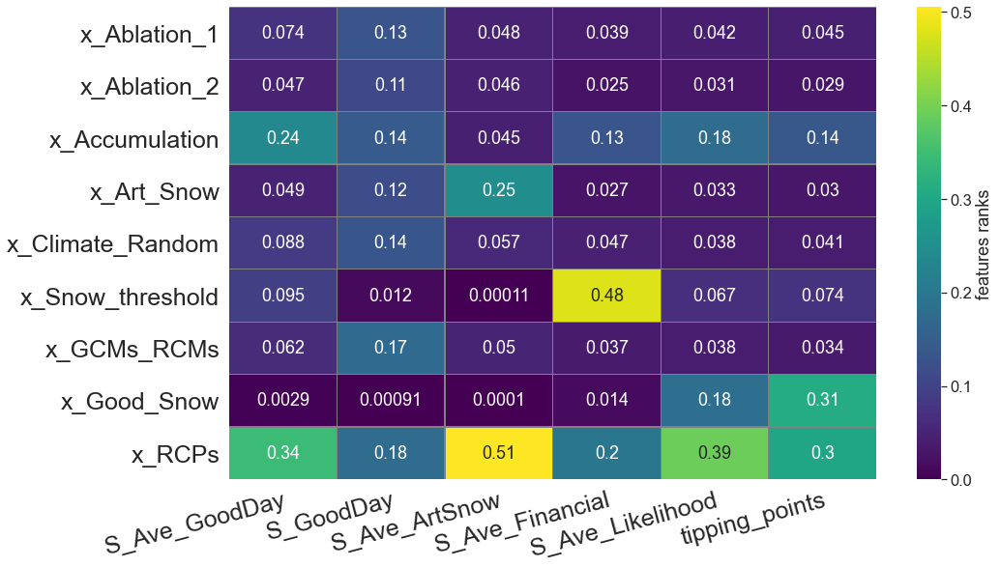

In [63]:
from ema_workbench.analysis import feature_scoring

fig6, ax6 = plt.subplots(figsize=(15,9))

x = experiments
#x = new_dict_experiments
#Y = outcomes
Y = new_dict
fs = feature_scoring.get_feature_scores_all(x, Y)
ax6 = sns.heatmap(fs, cmap='viridis', annot=True,
                  vmin=0, linewidths=0.28,linecolor="grey",
                  cbar_kws={'label': 'features ranks'})

# Rotate the tick labels and set their alignment.
plt.setp(ax6.get_xticklabels(), rotation=15, size = 25, ha="right",
         rotation_mode="anchor")

ylabels = ['x_Ablation_1', 'x_Ablation_2', 'x_Accumulation', 'x_Art_Snow', 'x_Climate_Random', 'x_Snow_threshold', 'x_GCMs_RCMs', 'x_Good_Snow', 'x_RCPs']
ax6.set_yticklabels(ylabels)
plt.setp(ax6.get_yticklabels(), rotation=0, size = 25, ha="right", rotation_mode="anchor")

#ax6.legend(size=13)

plt.show()

fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.svg'), format='svg', dpi=300)
fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.tiff'), format='tiff', dpi=150)
fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.jpg'), format='jpg', dpi=150)

S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)

Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)

S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort

S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points

tipping_points: Number of tipping points (1981-2100)

[MainProcess/INFO] model dropped from analysis because only a single category


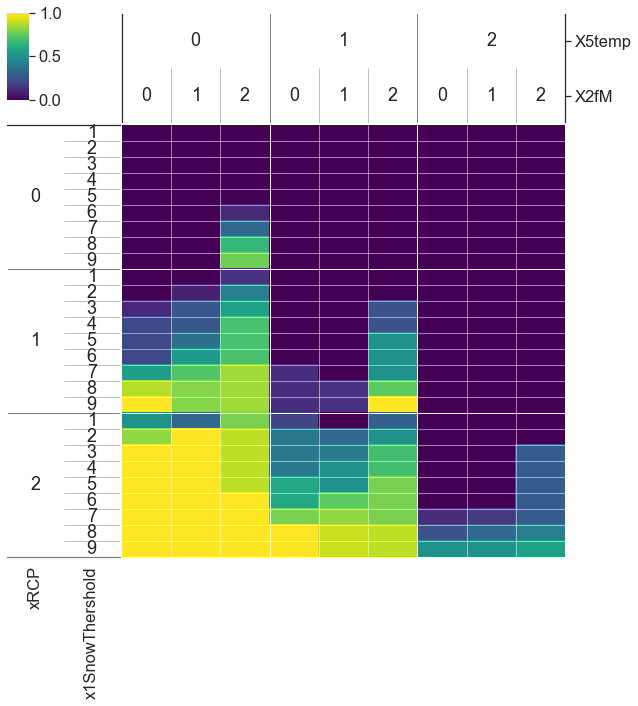

In [64]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_GoodDay'] < 70
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_gooddays.svg'), format='svg', dpi=600)

[MainProcess/INFO] model dropped from analysis because only a single category


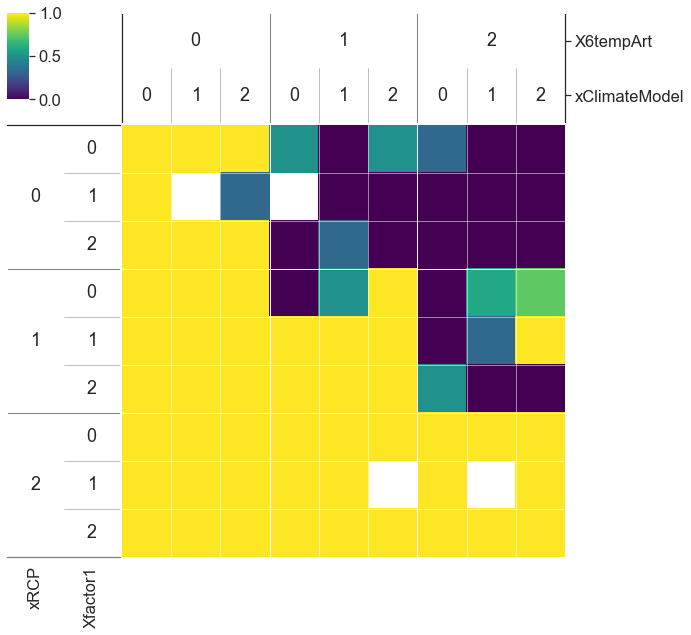

In [65]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_ArtSnow'] < 50
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Artificial.svg'), format='svg', dpi=300)

[MainProcess/INFO] model dropped from analysis because only a single category


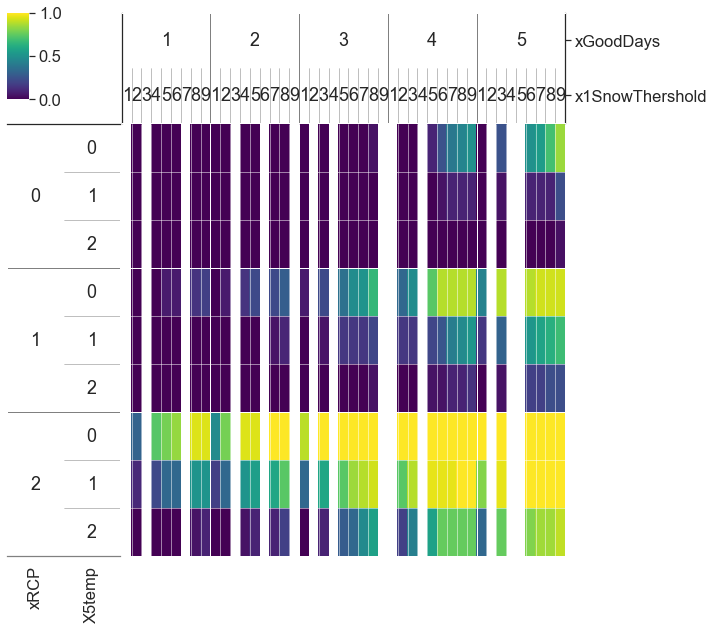

In [66]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_Likelihood'] < 0.6
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Liklehood.svg'), format='svg', dpi=600)

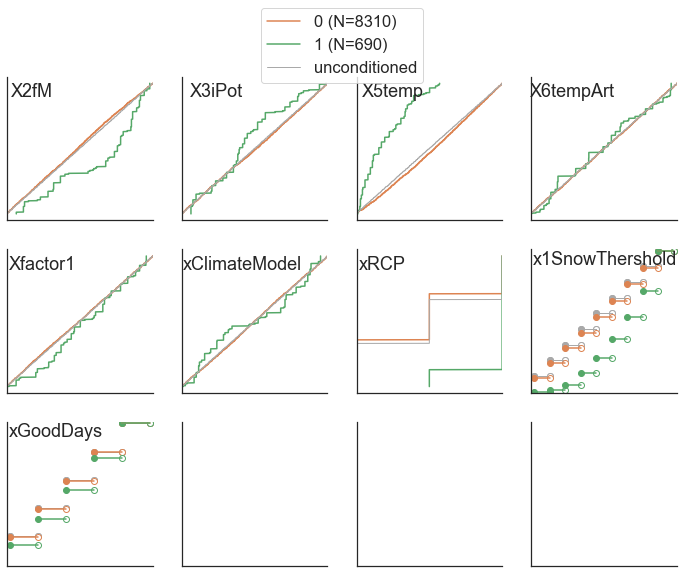

In [67]:
from ema_workbench.analysis import regional_sa
from numpy.lib import recfunctions as rf

sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_GoodDay'] < 60
fig10 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig10.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_gooddays.svg'), format='svg', dpi=600)

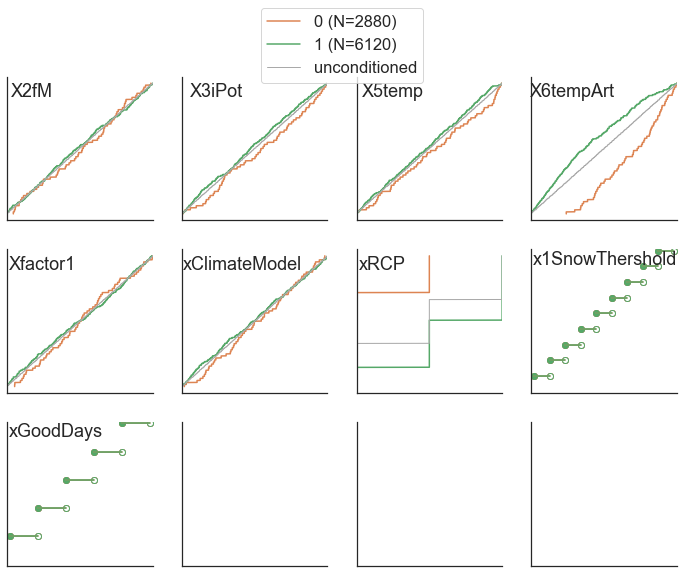

In [68]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_ArtSnow'] < 50
fig12 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig12.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

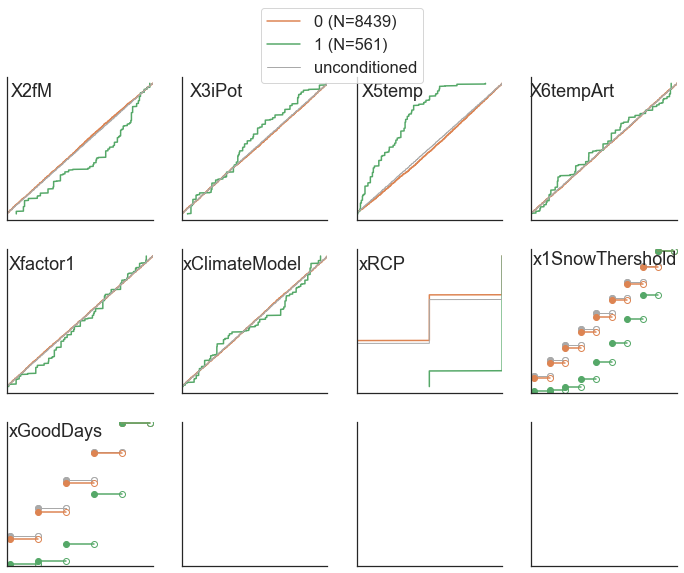

In [69]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_Likelihood'] < 0.5
fig11 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig11.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

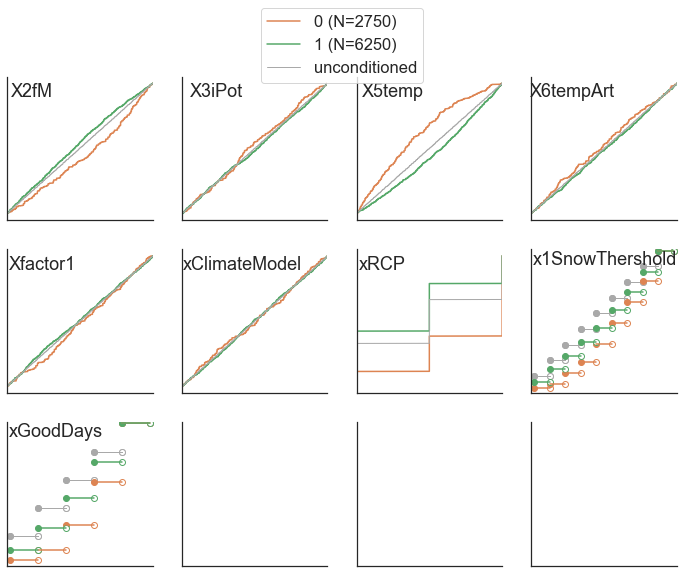

In [70]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['tipping_points'] < 15
fig11_2 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig11_2.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_tipping_points.svg'), format='svg', dpi=600)

### Scatter Plots (Inputs vs Outputs)

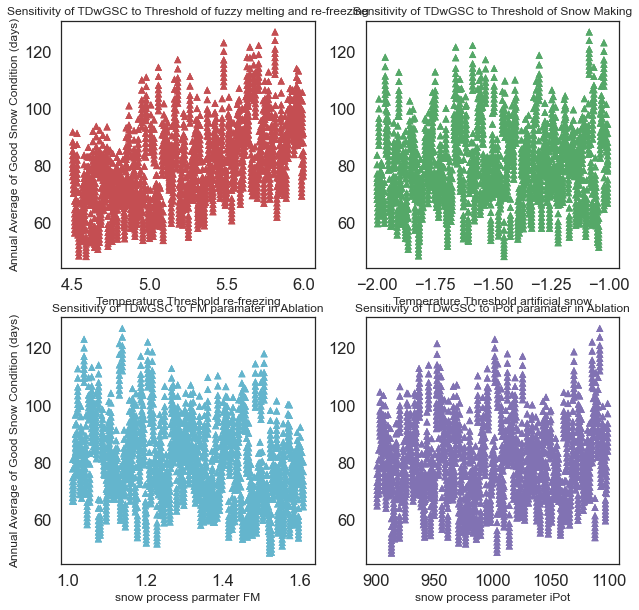

In [71]:
#fig, (ax1, ax2) = plt.subplots(1,2)
fig13, axs = plt.subplots(2, 2, figsize=(10,10))
#axs[0,0].scatter(xGoodDays, y, s = 200, c='b' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Good Days Condition')

#axs[0,1].scatter(x1SnowThershold, y, s = 200, c='orange' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Snow Threshold Condition')

axs[0,0].scatter(x5, YY, s = 50, c='r' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[0,1].scatter(x6, YY, s = 50, c='g' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')

axs[1,0].scatter(x2, YY, s = 50, c='c' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[1,1].scatter(x3, YY, s = 50, c='m' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')


# produce a legend with the unique colors from the scatter
#axs[0,0].set_xlabel("Good Days Condition")
#axs[0,1].set_xlabel("Snow Threshold Condition")
axs[0,0].set_xlabel("Temperature Threshold re-freezing", size = 12)
axs[0,1].set_xlabel("Temperature Threshold artificial snow", size = 12)
axs[1,0].set_xlabel("snow process parmater FM",size = 12)
axs[1,1].set_xlabel("snow process parameter iPot", size = 12)


axs[0,0].set_ylabel("Annual Average of Good Snow Condition (days)", size = 12)
#axs[0,1].set_ylabel("Frequency of Tipping points")
axs[1,0].set_ylabel("Annual Average of Good Snow Condition (days)", size = 12)
#axs[1,1].set_ylabel("Frequency of Tipping points")
#axs[2,0].set_ylabel("Annual Average of Good Snow Condition (days)")
#axs[2,1].set_ylabel("Frequency of Tipping points")

#axs[0,0].set_title('Sensitivity of TDwGSC to Policy-1 (less that 100 days)')
#axs[0,1].set_title('Sensitivity of TDwGSC to Policy-2 (300 mm)')
axs[0,0].set_title('Sensitivity of TDwGSC to Threshold of fuzzy melting and re-freezing', size = 12)
axs[0,1].set_title('Sensitivity of TDwGSC to Threshold of Snow Making', size = 12)
axs[1,0].set_title('Sensitivity of TDwGSC to FM paramater in Ablation', size = 12)
axs[1,1].set_title('Sensitivity of TDwGSC to iPot paramater in Ablation', size = 12)


#axs[0,0].text(0, 130, r'A', fontsize=15)
#axs[0,1].text(-1.9, 130, r'B', fontsize=15)
#axs[1,0].text(1.04, 130, r'C', fontsize=15)
#axs[1,1].text(920, 130, r'D', fontsize=15)

fig13.savefig(os.path.join(rootVisualization, 'SA4_All.svg'), format='svg', dpi=300)

plt.show()

## 3D Scatter Plot

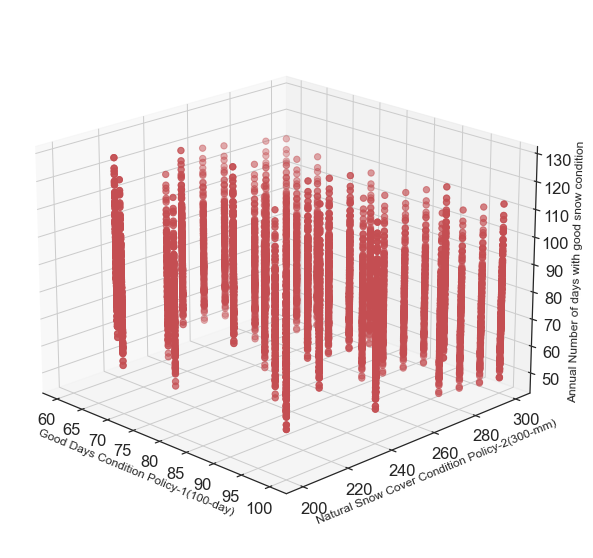

In [72]:
from mpl_toolkits.mplot3d import Axes3D 
fig14 = plt.figure(figsize=(15,10))
ax = fig14.add_subplot(111, projection='3d')

ax.scatter(xGoodDays, x1SnowThershold, YY, s = 40, c='r', marker='o')

ax.set_xlabel('Good Days Condition Policy-1(100-day)', size = 12)
ax.set_ylabel('Natural Snow Cover Condition Policy-2(300-mm)', size = 12)
ax.set_zlabel('Annual Number of days with good snow condition', size = 12)


#ax.scatter(100, 300, 40, color='green')


#x = np.linspace(75,100,5)
#y = np.linspace(220,300,16)
#X,Y = np.meshgrid(x,y)
#Z= X + Y -X - Y + 40 
#surf = ax.plot_surface(X, Y, Z, alpha = 0.2)
ax.view_init(20, -45)

fig14.savefig(os.path.join(rootVisualization, 'SA_Policy_All.svg'), format='svg', dpi=300)
plt.show()

In [73]:
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
0,1.191161,902.965567,5.814916,-1.665461,1.219984,0.483592,3.0,270.0,60.0,0,0,UZHModel,93.445357,51,107.546667,102.292815,158.870296,103.085444,146.764037,141.802333,140.164444,161.497259,151.354333,142.589519,109.720185,143.364963,136.491556,133.661630,159.908000,171.515778,123.533778,76.905852,41.656185,72.274185,...,65.089519,110.375111,36.394926,35.019148,21.234889,74.919407,131.875037,31.898148,46.483815,109.410296,44.436815,121.092185,116.558519,20.194000,33.876481,38.107222,9.243963,11.692333,21.799148,44.478852,50.622370,41.118037,12.225741,27.076926,13.170111,98.849222,31.571852,20.137556,28.388593,35.740185,41.176186,3.698220,0.742535,7.0
1,1.279832,1090.643646,5.876523,-1.907386,2.341139,0.174160,2.0,270.0,60.0,1,0,UZHModel,86.052021,15,86.943407,137.121037,137.777926,123.560296,122.345889,150.362481,142.617444,117.216556,118.825333,71.162407,128.546296,146.028741,121.779000,95.342074,130.789704,118.622296,107.811963,41.638926,64.647222,89.610889,...,69.493630,44.571296,36.839444,108.824667,88.817593,16.833630,61.204333,85.803481,82.735741,30.741370,98.667148,73.126111,87.578815,96.008926,65.707481,33.709926,11.569963,38.792556,38.564185,91.885370,145.210407,108.817259,63.485667,112.860000,18.829741,116.935407,82.296296,12.088296,95.190889,55.630296,44.373390,3.394322,0.762868,1.0
2,1.585717,1066.577812,5.314054,-1.289036,2.288920,0.024030,3.0,270.0,60.0,2,0,UZHModel,61.924311,37,65.785259,91.738000,164.500778,123.181407,104.285667,83.156000,38.992444,135.558852,67.643926,110.300481,55.610889,144.022444,92.085556,122.714037,82.688815,86.795556,91.457111,109.769074,40.104037,75.740519,...,40.291037,116.568481,19.480148,49.286667,10.540444,35.841963,21.424741,91.996889,10.186296,9.291333,10.405815,46.719519,16.959889,5.876444,9.558593,11.522741,29.478222,30.183111,12.783481,62.208741,23.478667,8.312296,5.862074,76.921185,5.800926,48.701185,4.380926,0.772704,19.231185,5.525037,44.324492,2.431525,0.611793,11.0
3,1.392948,1078.387572,4.779334,-1.342517,1.816506,0.744004,2.0,270.0,60.0,3,0,UZHModel,67.299064,30,77.492741,123.360556,156.714556,104.728222,86.330000,128.731630,90.390370,94.088333,82.896593,56.333000,123.764000,139.770074,98.069704,107.025556,45.160074,139.154222,39.702778,109.129852,102.047074,105.160815,...,16.705296,22.816519,92.310926,78.490000,9.551185,68.050148,73.535519,47.439037,48.061222,74.890481,21.492444,25.447926,36.285296,94.946259,52.851259,42.161370,17.724259,18.535444,48.303741,65.272333,28.512889,69.788852,47.760519,98.131222,20.359593,45.075370,72.673889,96.752889,13.111296,24.814407,49.142966,2.651695,0.659322,7.0
4,1.508217,1012.886028,5.631448,-1.961889,0.610938,0.280354,1.0,270.0,60.0,4,0,UZHModel,106.506942,3,91.098556,75.815481,164.888889,78.333778,149.488926,85.141630,156.848037,95.352519,158.623815,156.781926,93.666259,140.003519,143.639111,129.785778,158.415815,162.829333,126.749407,115.606259,49.129444,99.133074,...,92.263778,40.082296,81.385111,67.617444,19.220481,129.492370,119.376111,124.035852,129.912074,101.053259,104.104259,104.329741,117.907111,129.463259,124.504111,148.579000,79.878593,57.185222,111.712852,25.846630,157.669630,40.338481,166.984889,109.306926,149.581815,156.062296,107.944037,58.389741,138.726963,64.032481,44.916949,4.227966,0.797712,0.0


# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values
y7 = df_final_ema['Yout7'].values

In [74]:
df_final_ema.tail()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
8995,1.464654,961.510237,5.089917,-1.605157,0.701695,0.949119,3.0,300.0,100.0,195,44,UZHModel,53.780021,65,52.346467,61.912100,154.830100,94.994933,114.130400,50.521767,133.624333,47.754400,128.268767,103.994600,90.128333,151.430367,111.022300,114.568467,35.605767,161.413533,105.445033,50.557067,44.873667,52.803533,...,28.553833,26.106800,4.696667,6.594133,2.661800,13.922367,10.563367,4.643467,1.909467,24.515700,4.732600,13.154233,45.060300,9.580000,9.501733,7.695767,2.625200,7.226700,6.160400,11.004867,14.920633,7.822633,2.577400,2.847967,2.983967,24.158967,4.010000,2.469300,11.738633,2.405100,36.315593,1.944407,0.419899,25.0
8996,1.185822,1054.499783,5.605871,-1.255537,1.503439,0.857485,2.0,300.0,100.0,196,44,UZHModel,72.232436,32,123.341700,93.809867,127.514167,81.552100,115.451033,129.044400,136.354500,139.997333,90.115333,99.444867,83.879700,113.068133,131.880367,110.808000,100.807467,118.904733,88.626033,92.305667,41.696700,34.597400,...,102.225933,94.982567,22.190800,27.194767,49.518000,38.894533,52.907733,21.300233,62.654867,58.041933,54.314333,11.164067,83.081367,34.275700,8.957067,75.368567,68.549133,35.292667,104.626900,23.048933,63.550567,23.624667,69.689967,50.863133,10.962733,93.359000,58.504533,63.125333,6.609100,51.172533,46.290339,2.663644,0.569302,22.0
8997,1.159125,1069.317702,5.094637,-1.087199,0.676038,0.908319,1.0,300.0,100.0,197,44,UZHModel,83.954134,10,60.272267,69.545033,165.510133,89.644667,112.792000,73.093567,133.280867,78.097567,149.524500,83.720700,44.869000,131.905533,85.353900,126.317067,97.503300,132.309267,111.433033,106.035333,63.410800,92.995300,...,85.066100,33.306733,87.036467,83.141500,19.510967,123.488333,61.004700,149.168000,87.113733,76.011000,69.141100,88.182767,76.414033,134.725100,57.928867,119.831433,134.382200,51.623433,19.119767,34.558700,148.058867,45.508867,31.521267,67.694067,124.907367,156.142467,84.636200,60.147567,84.180533,23.000433,54.574322,3.109153,0.622785,14.0
8998,1.519960,978.718013,4.539624,-1.910477,1.134131,0.581377,2.0,300.0,100.0,198,44,UZHModel,55.760009,26,42.634200,101.183433,109.012833,116.630500,26.248133,114.331167,148.011000,140.353733,111.239400,87.557000,113.540200,83.578500,75.530533,43.932233,98.839367,46.847700,4.994567,48.831633,65.514167,23.406700,...,33.214433,8.555800,97.158267,16.967267,18.118267,96.874967,45.996667,46.212300,97.249133,5.878400,40.508767,53.286533,81.543633,2.226667,100.453267,28.211133,2.617900,22.050333,6.891033,42.599167,10.990267,9.771333,4.493500,8.386000,63.457000,51.952300,58.609500,26.426733,66.887167,99.979200,39.621525,2.004576,0.448075,29.0
8999,1.372753,1028.909744,5.153629,-1.823651,3.356518,0.959189,2.0,300.0,100.0,199,44,UZHModel,67.648655,35,140.934200,104.524500,116.813733,139.783867,105.627367,53.948000,148.754300,95.603000,131.596800,63.766100,131.535533,56.360267,107.495033,110.066700,85.395033,25.889867,104.087833,101.047733,118.352433,45.018600,...,12.708767,18.237667,33.949433,42.676833,25.385867,99.838100,94.596533,81.129767,8.948767,142.767700,26.000300,8.427300,49.807833,48.605567,14.118833,67.643667,82.870533,55.732100,81.306400,6.447533,66.980333,4.415867,28.398267,50.505733,69.405133,99.304267,31.920767,10.241400,12.652367,14.607500,44.479237,2.474831,0.530921,23.0


In [75]:
filt_S = (df_final_ema['scenario'] == 1)
x_policy = df_final_ema.loc[filt_S, 'x1SnowThershold']
y_policy = df_final_ema.loc[filt_S, 'xGoodDays']
scenarios = df_final_ema.loc[filt_S, 'policy']

In [76]:
x_policy[1]

270.0

In [77]:
df_final_ema[filt_S]

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
1,1.279832,1090.643646,5.876523,-1.907386,2.341139,0.17416,2.0,270.0,60.0,1,0,UZHModel,86.052021,15,86.943407,137.121037,137.777926,123.560296,122.345889,150.362481,142.617444,117.216556,118.825333,71.162407,128.546296,146.028741,121.779000,95.342074,130.789704,118.622296,107.811963,41.638926,64.647222,89.610889,...,69.493630,44.571296,36.839444,108.824667,88.817593,16.833630,61.204333,85.803481,82.735741,30.741370,98.667148,73.126111,87.578815,96.008926,65.707481,33.709926,11.569963,38.792556,38.564185,91.885370,145.210407,108.817259,63.485667,112.860000,18.829741,116.935407,82.296296,12.088296,95.190889,55.630296,44.37339,3.394322,0.762868,1.0
201,1.279832,1090.643646,5.876523,-1.907386,2.341139,0.17416,2.0,220.0,60.0,1,1,UZHModel,93.916985,15,99.797227,142.756864,141.982682,127.711364,125.307909,156.818273,147.735818,132.065773,129.027727,87.227591,138.486409,149.817545,127.480409,103.189909,145.216727,123.171636,116.705500,51.003136,73.826364,98.566773,...,84.982545,54.701136,44.036409,114.196136,104.405500,20.659455,68.998227,95.387955,92.172045,37.728045,108.595409,79.720409,93.900909,105.971909,74.503636,41.371273,14.199500,44.473091,47.328773,98.907045,146.514455,112.234455,70.073227,116.691500,23.109227,118.738909,88.436182,14.835636,98.349273,65.188045,44.37339,4.629153,0.783345,1.0
401,1.279832,1090.643646,5.876523,-1.907386,2.341139,0.17416,2.0,220.0,90.0,1,2,UZHModel,93.916985,15,99.797227,142.756864,141.982682,127.711364,125.307909,156.818273,147.735818,132.065773,129.027727,87.227591,138.486409,149.817545,127.480409,103.189909,145.216727,123.171636,116.705500,51.003136,73.826364,98.566773,...,84.982545,54.701136,44.036409,114.196136,104.405500,20.659455,68.998227,95.387955,92.172045,37.728045,108.595409,79.720409,93.900909,105.971909,74.503636,41.371273,14.199500,44.473091,47.328773,98.907045,146.514455,112.234455,70.073227,116.691500,23.109227,118.738909,88.436182,14.835636,98.349273,65.188045,44.37339,4.629153,0.721660,4.0
601,1.279832,1090.643646,5.876523,-1.907386,2.341139,0.17416,2.0,220.0,60.0,1,3,UZHModel,93.916985,15,99.797227,142.756864,141.982682,127.711364,125.307909,156.818273,147.735818,132.065773,129.027727,87.227591,138.486409,149.817545,127.480409,103.189909,145.216727,123.171636,116.705500,51.003136,73.826364,98.566773,...,84.982545,54.701136,44.036409,114.196136,104.405500,20.659455,68.998227,95.387955,92.172045,37.728045,108.595409,79.720409,93.900909,105.971909,74.503636,41.371273,14.199500,44.473091,47.328773,98.907045,146.514455,112.234455,70.073227,116.691500,23.109227,118.738909,88.436182,14.835636,98.349273,65.188045,44.37339,4.629153,0.783345,1.0
801,1.279832,1090.643646,5.876523,-1.907386,2.341139,0.17416,2.0,260.0,60.0,1,4,UZHModel,87.581767,15,89.288808,138.216923,138.837077,124.312615,122.935077,151.472154,143.603346,120.333769,120.626308,73.899423,130.398962,146.957885,122.797808,97.302885,133.926808,119.415462,109.406692,43.240423,66.573308,91.541538,...,72.166462,46.285577,38.234077,110.081231,91.767885,17.481077,62.558346,87.760077,84.624346,31.923731,100.510385,74.400192,88.878385,97.951731,67.311615,35.006462,12.014962,39.942577,40.047423,93.171423,145.517885,109.425615,64.812115,113.585385,19.553962,117.240615,83.615385,12.553231,95.819962,57.616077,44.37339,3.525254,0.767035,1.0
1001,1.279832,1090.643646,5.876523,-1.907386,2.341139,0.17416,2.0,290.0,70.0,1,5,UZHModel,83.090101,15,82.

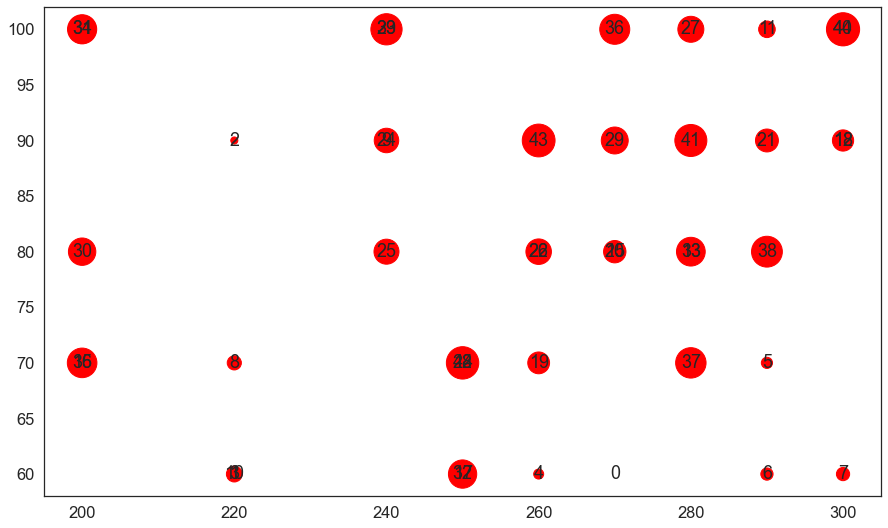

In [78]:
#x_policy = x1SnowThershold 
#y_policy = xGoodDays 

#ranking = np.random.normal(size=9000)
#scenarios = df_final_ema['policy'].values


fig, ax_n = plt.subplots(figsize=(15,9))


x_policy = df_final_ema.loc[filt_S, 'x1SnowThershold']
y_policy = df_final_ema.loc[filt_S, 'xGoodDays']
scenarios = df_final_ema.loc[filt_S, 'policy']
#colors = np.random.rand(N)


# Because the price is much too small when being provided as size for ``s``,
# we normalize it to some useful point sizes, s=0.3*(price*3)**2
ax_n.scatter(x_policy, y_policy, s = scenarios * 25, c = 'red' , cmap="Spectral")

for x_pos, y_pos, label in zip(x_policy, y_policy, scenarios):
    ax_n.annotate(label,
                xy=(x_pos, y_pos),
                xytext=(0, 0),
                textcoords='offset points',
                ha='center',
                va='center')

plt.show()

### Defining the Q0.9 and Q0.1 databases

In [79]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[39.23526818]
[60.47659231]
[83.27205303]
[103.45693125]
[124.25585143]
(118, 1)
[1.529]
[2.41]
[3.43]
[4.4]
[5.401]
(118, 1)
[31.202]
[38.8725]
[46.15]
[55.1075]
[67.593]
(118, 1)
[46.45819907]
[73.57172917]
[100.]
[100.]
[100.]
(118, 1)


In [80]:
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

#########
(2970, 119, 2)
(3015, 119, 2)
(3015, 119, 2)
9000
#########
(2970, 119, 2)
(3015, 119, 2)
(3015, 119, 2)
9000
#########
(2970, 119, 2)
(3015, 119, 2)
(3015, 119, 2)
9000
#########
(2970, 119, 2)
(3015, 119, 2)
(3015, 119, 2)
9000


In [81]:
print(matrix_GoodDays[:, :, 1:2].shape)
print(matrix_GoodDays[3, 0, 1:2])
print(matrix_GoodDays[4].shape)

(9000, 119, 1)
['isOverSnow_sc_26_4']
(119, 2)


## Analysis for different RCP2.6, RCP4.5, and RCP8.5
### Calculate quantiles for each RCP scenarios

In [82]:
q10_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.9, axis=0)



#2020/08/13
q10_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.9, axis=0)


q10_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.9, axis=0)


#### Make dataframes from quantiles

In [83]:
dfq50_26 = pd.DataFrame(q50_years_26)
dfq50_26.columns = ['median26']
dfq50_45 = pd.DataFrame(q50_years_45)
dfq50_45.columns = ['median45']
dfq50_85 = pd.DataFrame(q50_years_85)
dfq50_85.columns = ['median85']

dfq90_26 = pd.DataFrame(q90_years_26)
dfq90_26.columns = ['Q90_26']
dfq90_45 = pd.DataFrame(q90_years_45)
dfq90_45.columns = ['Q90_45']
dfq90_85 = pd.DataFrame(q90_years_85)
dfq90_85.columns = ['Q90_85']

dfq10_26 = pd.DataFrame(q10_years_26)
dfq10_26.columns = ['Q10_26']
dfq10_45 = pd.DataFrame(q10_years_45)
dfq10_45.columns = ['Q10_45']
dfq10_85 = pd.DataFrame(q10_years_85)
dfq10_85.columns = ['Q10_85']

### 2020/08/13
dfq50_fin_26 = pd.DataFrame(q50_years_fin_26)
dfq50_fin_26.columns = ['median26']
dfq50_fin_45 = pd.DataFrame(q50_years_fin_45)
dfq50_fin_45.columns = ['median45']
dfq50_fin_85 = pd.DataFrame(q50_years_fin_85)
dfq50_fin_85.columns = ['median85']

dfq90_fin_26 = pd.DataFrame(q90_years_fin_26)
dfq90_fin_26.columns = ['median26']
dfq90_fin_45 = pd.DataFrame(q90_years_fin_45)
dfq90_fin_45.columns = ['median45']
dfq90_fin_85 = pd.DataFrame(q90_years_fin_85)
dfq90_fin_85.columns = ['median85']

dfq10_fin_26 = pd.DataFrame(q10_years_fin_26)
dfq10_fin_26.columns = ['median26']
dfq10_fin_45 = pd.DataFrame(q10_years_fin_45)
dfq10_fin_45.columns = ['median45']
dfq10_fin_85 = pd.DataFrame(q10_years_fin_85)
dfq10_fin_85.columns = ['median85']

dfq50_Art_26 = pd.DataFrame(q50_years_Art_26)
dfq50_Art_26.columns = ['median26']
dfq50_Art_45 = pd.DataFrame(q50_years_Art_45)
dfq50_Art_45.columns = ['median45']
dfq50_Art_85 = pd.DataFrame(q50_years_Art_85)
dfq50_Art_85.columns = ['median85']

dfq90_Art_26 = pd.DataFrame(q90_years_Art_26)
dfq90_Art_26.columns = ['median26']
dfq90_Art_45 = pd.DataFrame(q90_years_Art_45)
dfq90_Art_45.columns = ['median45']
dfq90_Art_85 = pd.DataFrame(q90_years_Art_85)
dfq90_Art_85.columns = ['median85']

dfq10_Art_26 = pd.DataFrame(q10_years_Art_26)
dfq10_Art_26.columns = ['median26']
dfq10_Art_45 = pd.DataFrame(q10_years_Art_45)
dfq10_Art_45.columns = ['median45']
dfq10_Art_85 = pd.DataFrame(q10_years_Art_85)
dfq10_Art_85.columns = ['median85']

dfq50_Like_26 = pd.DataFrame(q50_years_Like_26)
dfq50_Like_26.columns = ['median26']
dfq50_Like_45 = pd.DataFrame(q50_years_Like_45)
dfq50_Like_45.columns = ['median45']
dfq50_Like_85 = pd.DataFrame(q50_years_Like_85)
dfq50_Like_85.columns = ['median85']

dfq90_Like_26 = pd.DataFrame(q90_years_Like_26)
dfq90_Like_26.columns = ['median26']
dfq90_Like_45 = pd.DataFrame(q90_years_Like_45)
dfq90_Like_45.columns = ['median45']
dfq90_Like_85 = pd.DataFrame(q90_years_Like_85)
dfq90_Like_85.columns = ['median85']

dfq10_Like_26 = pd.DataFrame(q10_years_Like_26)
dfq10_Like_26.columns = ['median26']
dfq10_Like_45 = pd.DataFrame(q10_years_Like_45)
dfq10_Like_45.columns = ['median45']
dfq10_Like_85 = pd.DataFrame(q10_years_Like_85)
dfq10_Like_85.columns = ['median85']

In [84]:
dfq50_26.head()

,median26
0,79.380593
1,127.554980
2,132.938247
3,95.943221
4,115.694790


In [85]:
dfAllAverages = pd.concat((dfq50_26, dfq50_45, dfq50_85), axis=1)
dfAllAverages_Q90 = pd.concat((dfq90_26, dfq90_45, dfq90_85), axis=1)
dfAllAverages_Q10 = pd.concat((dfq10_26, dfq10_45, dfq10_85), axis=1)

dfAllAverages_fin = pd.concat((dfq50_fin_26, dfq50_fin_45, dfq50_fin_85), axis=1)
dfAllAverages_Q90_fin = pd.concat((dfq90_fin_26, dfq90_fin_45, dfq90_fin_85), axis=1)
dfAllAverages_Q10_fin = pd.concat((dfq10_fin_26, dfq10_fin_45, dfq10_fin_85), axis=1)

dfAllAverages_Art = pd.concat((dfq50_Art_26, dfq50_Art_45, dfq50_Art_85), axis=1)
dfAllAverages_Q90_Art = pd.concat((dfq90_Art_26, dfq90_Art_45, dfq90_Art_85), axis=1)
dfAllAverages_Q10_Art = pd.concat((dfq10_Art_26, dfq10_Art_45, dfq10_Art_85), axis=1)

dfAllAverages_Like = pd.concat((dfq50_Like_26, dfq50_Like_45, dfq50_Like_85), axis=1)
dfAllAverages_Q90_Like = pd.concat((dfq90_Like_26, dfq90_Like_45, dfq90_Like_85), axis=1)
dfAllAverages_Q10_Like = pd.concat((dfq10_Like_26, dfq10_Like_45, dfq10_Like_85), axis=1)

In [86]:
dfAllAverages.head()

,median26,median45,median85
0,79.380593,86.739069,84.436321
1,127.554980,115.507045,132.280667
2,132.938247,123.316037,121.284240
3,95.943221,101.060100,100.225593
4,115.694790,122.846917,135.148958


In [87]:
print('*** All RCPs***')
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)
print('*** RCP2.6***')
print(q10_years_26[0])
print(q25_years_26[0])
print(q50_years_26[0])
print(q75_years_26[0])
print(q90_years_26[0])
print(q50_years_26.shape)
print('*** RCP4.5***')
print(q10_years_45[0])
print(q25_years_45[0])
print(q50_years_45[0])
print(q75_years_45[0])
print(q90_years_45[0])
print(q50_years_45.shape)
print('*** RCP8.5***')
print(q10_years_85[0])
print(q25_years_85[0])
print(q50_years_85[0])
print(q75_years_85[0])
print(q90_years_85[0])
print(q50_years_85.shape)

*** All RCPs***
[39.23526818]
[60.47659231]
[83.27205303]
[103.45693125]
[124.25585143]
(118, 1)
*** RCP2.6***
[45.88866667]
[61.76163333]
[79.38059259]
[98.74970833]
[107.86203704]
(118, 1)
*** RCP4.5***
[33.42383333]
[52.13777273]
[86.73906897]
[112.10445]
[136.71446154]
(118, 1)
*** RCP8.5***
[39.85553333]
[63.78692857]
[84.43632143]
[105.74235714]
[125.21124]
(118, 1)


In [88]:
print('*** All RCPs***')
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)
print('*** RCP2.6***')
print(q10_years_fin_26[0])
print(q25_years_fin_26[0])
print(q50_years_fin_26[0])
print(q75_years_fin_26[0])
print(q90_years_fin_26[0])
print(q50_years_fin_26.shape)
print('*** RCP4.5***')
print(q10_years_fin_45[0])
print(q25_years_fin_45[0])
print(q50_years_fin_45[0])
print(q75_years_fin_45[0])
print(q90_years_fin_45[0])
print(q50_years_fin_45.shape)
print('*** RCP8.5***')
print(q10_years_fin_85[0])
print(q25_years_fin_85[0])
print(q50_years_fin_85[0])
print(q75_years_fin_85[0])
print(q90_years_fin_85[0])
print(q50_years_fin_85.shape)

*** All RCPs***
[1.529]
[2.41]
[3.43]
[4.4]
[5.401]
(118, 1)
*** RCP2.6***
[1.75]
[2.44]
[3.325]
[4.09]
[4.85]
(118, 1)
*** RCP4.5***
[1.29]
[2.23]
[3.5]
[4.86]
[5.67]
(118, 1)
*** RCP8.5***
[1.56]
[2.45]
[3.49]
[4.45]
[5.34]
(118, 1)


#### Set the parameters of making figure

In [89]:
p_Step = 20
alpha_Fade = 0.11

### RCP 2.6 Number of days with Good Snow Condition over the time

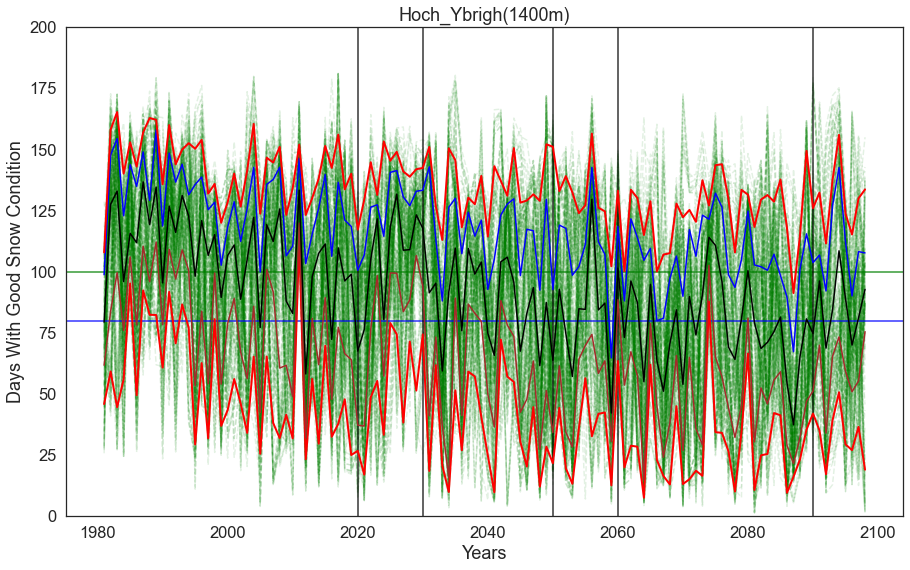

In [90]:
fig15, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), p_Step):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_26, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_26, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig15.savefig(os.path.join(rootVisualization, 'RCP26.svg'), format='svg', dpi=300)
plt.show()

### RCP 4.5 Number of days with Good Snow Condition over the time

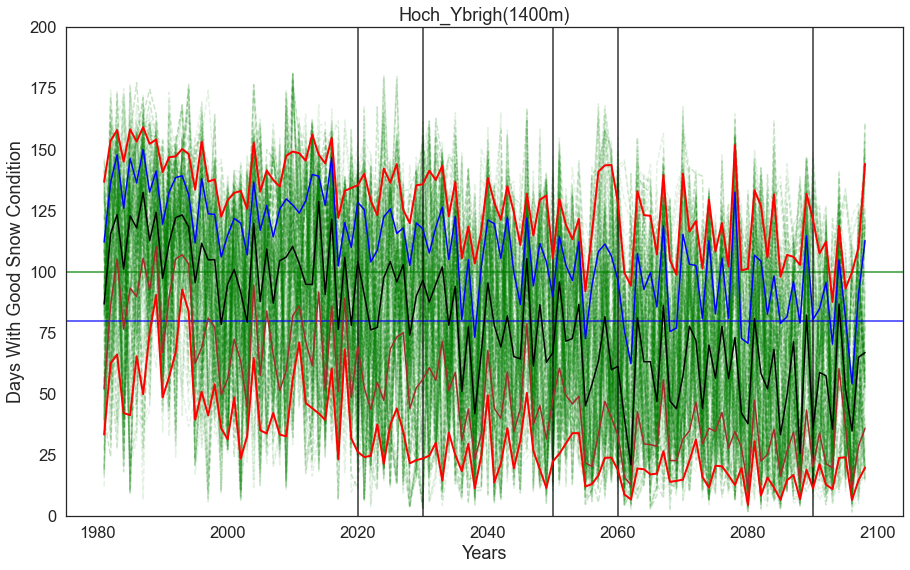

In [91]:
fig16, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays45), p_Step):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_45, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_45, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig16.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

### RCP 8.5 Number of days with Good Snow Condition over the time

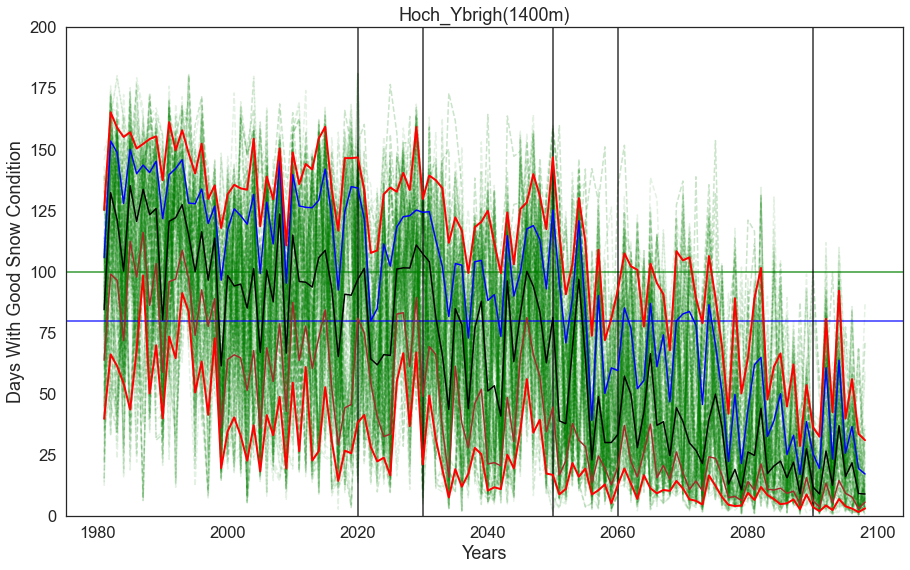

In [92]:
fig17, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_GoodDays85), p_Step):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_85, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_85, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig17.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

In [93]:
title_Figs = 'case2_Atzmaennig (840-1200m), RCP2.6'

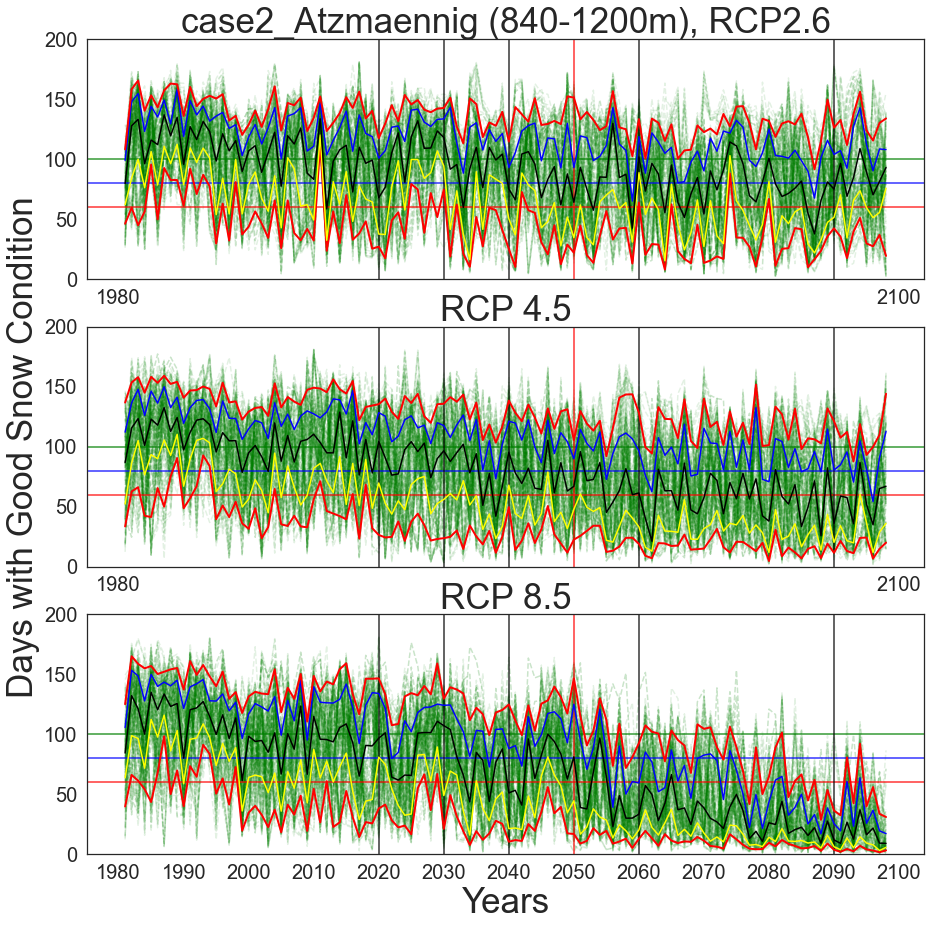

In [94]:
fig18, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), p_Step):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

for i in range(0, len(matrix_GoodDays45), p_Step):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_GoodDays85), p_Step):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)    

    
axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=100, color='green', alpha=0.8)
axs[0].axhline(y=80, color='blue', alpha=0.8)
axs[0].axhline(y=60, color='red', alpha=0.8)

axs[1].axhline(y=100, color='green', alpha=0.8)
axs[1].axhline(y=80, color='blue', alpha=0.8)
axs[1].axhline(y=60, color='red', alpha=0.8)

axs[2].axhline(y=100, color='green', alpha=0.8)
axs[2].axhline(y=80, color='blue', alpha=0.8)
axs[2].axhline(y=60, color='red', alpha=0.8)


axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)

axs[0].plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_85, color='red', linewidth = 2, alpha=1)

axs[0].set_ylim(bottom=0, top =200)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days With Good Snow Condition', fontsize=12)

axs[1].set_ylim(bottom=0, top =200)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Days with Good Snow Condition', fontsize=35)

axs[2].set_ylim(bottom=0, top =200)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days With Good Snow Condition', fontsize=12)

fig18.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.svg'), format='svg', dpi=300)
fig18.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.tiff'), format='tiff', dpi=150)

plt.show()

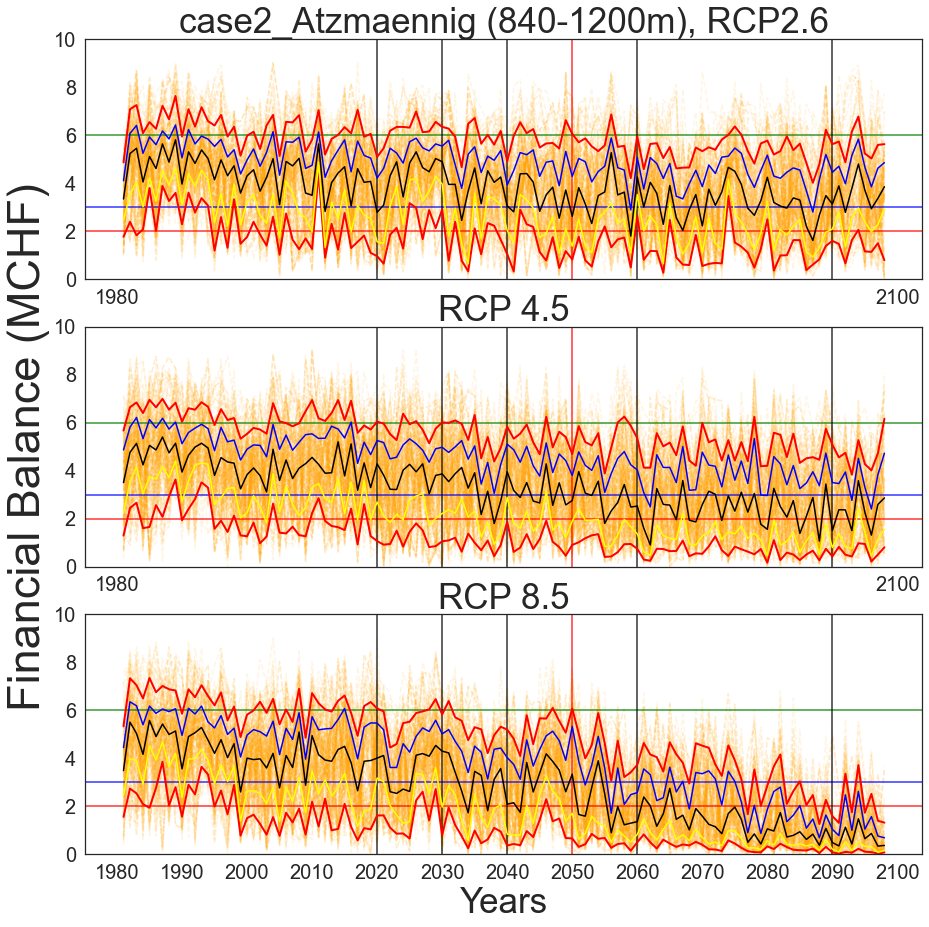

In [95]:
fig19, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_fin26), p_Step):
    a = matrix_fin26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_fin45), p_Step):
    a = matrix_fin45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_fin85), p_Step):
    a = matrix_fin85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)    

axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=6, color='green', alpha=0.8)
axs[0].axhline(y=3, color='blue', alpha=0.8)
axs[0].axhline(y=2, color='red', alpha=0.8)

axs[1].axhline(y=6, color='green', alpha=0.8)
axs[1].axhline(y=3, color='blue', alpha=0.8)
axs[1].axhline(y=2, color='red', alpha=0.8)

axs[2].axhline(y=6, color='green', alpha=0.8)
axs[2].axhline(y=3, color='blue', alpha=0.8)
axs[2].axhline(y=2, color='red', alpha=0.8)


axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)

axs[0].plot(x_axis, q10_years_fin_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_fin_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_fin_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_fin_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_fin_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_fin_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_fin_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_fin_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_fin_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_fin_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_fin_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_fin_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_fin_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_fin_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_fin_85, color='red', linewidth = 2, alpha=1)


axs[0].set_ylim(bottom=0, top =10)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days With Good Snow Condition', fontsize=12)

axs[1].set_ylim(bottom=0, top =10)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Financial Balance (MCHF)', fontsize=45)

axs[2].set_ylim(bottom=0, top =10
               )
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days With Good Snow Condition', fontsize=12)


fig19.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.svg'), format='svg', dpi=300)
fig19.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.tiff'), format='tiff', dpi=150)


plt.show()

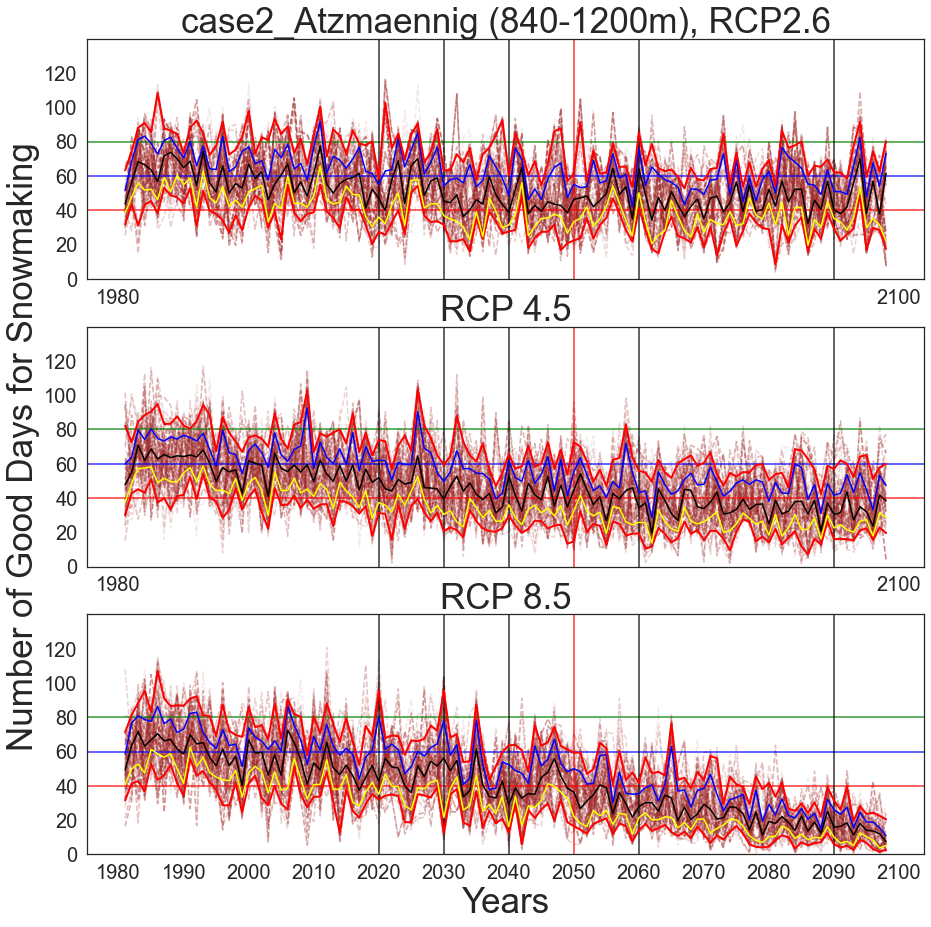

In [96]:
fig20, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Art26), p_Step):
    a = matrix_Art26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Art45), p_Step):
    a = matrix_Art45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Art85), p_Step):
    a = matrix_Art85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)    

    
    
    
axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].yaxis.set_ticks(np.arange(0, 140, 20))
axs[1].yaxis.set_ticks(np.arange(0, 140, 20))
axs[2].yaxis.set_ticks(np.arange(0, 140, 20))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=60, color='blue', alpha=0.8)
axs[0].axhline(y=40, color='red', alpha=0.8)

axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=60, color='blue', alpha=0.8)
axs[1].axhline(y=40, color='red', alpha=0.8)

axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=60, color='blue', alpha=0.8)
axs[2].axhline(y=40, color='red', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Art_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Art_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Art_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Art_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Art_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Art_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Art_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Art_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Art_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Art_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Art_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Art_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Art_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Art_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Art_85, color='red', linewidth = 2, alpha=1)



axs[0].set_ylim(bottom=0, top =140)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days with Artificial Snow Possibility', fontsize=12)

axs[1].set_ylim(bottom=0, top =140)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Number of Good Days for Snowmaking', fontsize=35)

axs[2].set_ylim(bottom=0, top =140)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days with Artificial Snow Possibility', fontsize=12)


fig20.savefig(os.path.join(rootVisualization, 'RCP26_45_85_ArtificialSnow.svg'), format='svg', dpi=300)
fig20.savefig(os.path.join(rootVisualization, 'RCP26_45_85_ArtificialSnow.tiff'), format='tiff', dpi=150)


plt.show()

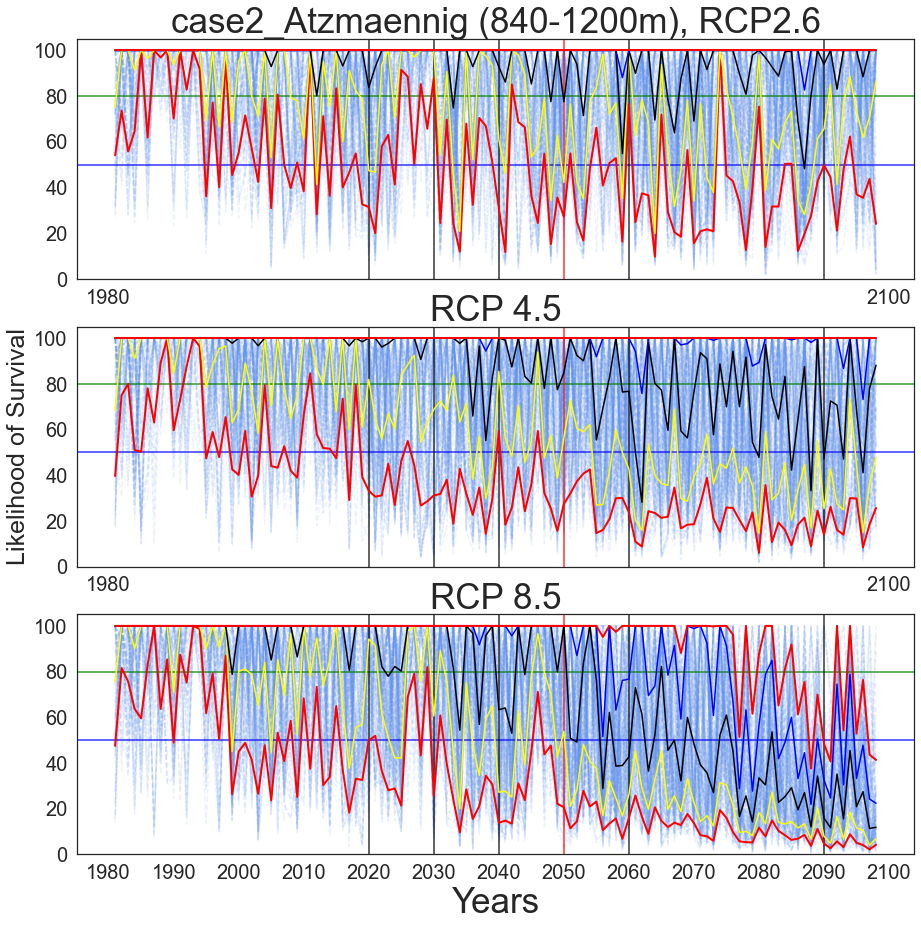

In [97]:
fig21, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Like26), p_Step):
    a = matrix_Like26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Like45), p_Step):
    a = matrix_Like45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Like85), p_Step):
    a = matrix_Like85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)    


axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].yaxis.set_ticks(np.arange(0, 140, 20))
axs[1].yaxis.set_ticks(np.arange(0, 140, 20))
axs[2].yaxis.set_ticks(np.arange(0, 140, 20))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)    
    

axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=50, color='blue', alpha=0.8)
axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=50, color='blue', alpha=0.8)
axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=50, color='blue', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Like_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Like_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Like_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Like_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Like_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Like_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Like_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Like_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Like_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Like_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Like_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Like_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Like_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Like_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Like_85, color='red', linewidth = 2, alpha=1)


axs[0].set_ylim(bottom=0, top =105)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Likelihood of Survival', fontsize=12)

axs[1].set_ylim(bottom=0, top =105)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Likelihood of Survival', fontsize=25)

axs[2].set_ylim(bottom=0, top =105)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)


axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Likelihood of Survival', fontsize=12)


fig21.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.svg'), format='svg', dpi=300)
fig21.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.tiff'), format='tiff', dpi=150)


plt.show()

In [98]:
dfAllAverages.head()

,median26,median45,median85
0,79.380593,86.739069,84.436321
1,127.554980,115.507045,132.280667
2,132.938247,123.316037,121.284240
3,95.943221,101.060100,100.225593
4,115.694790,122.846917,135.148958


### Worst Case: Quantile 0.10 >> 90% of the scenarios satisfy this condition

In [99]:
title_Figs2 = 'Atzmaenning'

In [100]:
y_axis = np.arange(1981, 2100, step= 20)

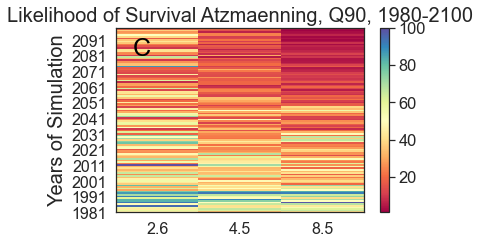

In [101]:
from matplotlib.ticker import FuncFormatter


fig22, (ax3) = plt.subplots(1, 1, figsize=(9,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c3 = ax3.pcolor(dfAllAverages_Q10, cmap='Spectral', vmin=1, vmax=100, offsets = 0.35)
cb3 = fig22.colorbar(c3)

#xticks(np.arange(0, 4, step=1))
ax3.set_title('default: no edges')


#ax3.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax3.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q90, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax3.text(0.2, 100, 'C', color = 'Black', fontsize=25)

fig22.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.svg'), format='svg', dpi=300)
fig22.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.tiff'), format='tiff', dpi=300)


fig22.tight_layout()
plt.show()

### Median Case: Quantile 0.5 >> 50 % of the scenarios satisfy this condition

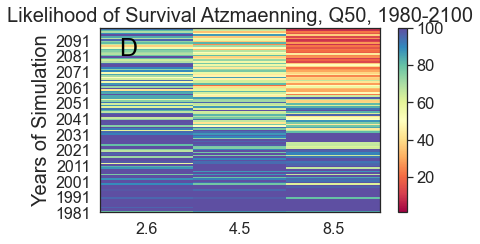

In [102]:
from matplotlib.ticker import FuncFormatter


fig23, (ax4) = plt.subplots(1, 1, figsize=(9.5,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages, cmap='Spectral' ,vmin=1, vmax=100, offsets = .35)
cb4 = fig23.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


#ax4.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax4.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q50, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax4.text(0.2, 100, 'D', color = 'Black', fontsize=25)


fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.svg'), format='svg', dpi=300)
fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.tiff'), format='tiff', dpi=300)
#fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.jpg'), format='jpg', dpi=300)


fig23.tight_layout()
plt.show()

### Best Case: Quantile 0.9 >> Only 10 % of the scenarios satisfy this condition

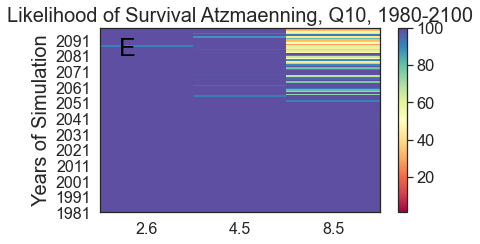

In [103]:
from matplotlib.ticker import FuncFormatter


fig24, (ax4) = plt.subplots(1, 1, figsize=(9.5,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages_Q90, cmap='Spectral' ,vmin=1, vmax=100)
cb4 = fig24.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


#ax4.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax4.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q10, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax4.text(0.2, 100, 'E', color = 'Black', fontsize=25)


fig24.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q10.svg'), format='svg', dpi=300)
fig24.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q10.tiff'), format='tiff', dpi=300)



fig24.tight_layout()
plt.show()

### Making dataframes for all RCP2.6 , RCP4.5, and RCP8.5 scenarios

In [104]:
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(matrix_GoodDays.shape)

(2970, 119, 2)
(3015, 119, 2)
(3015, 119, 2)
(9000, 119, 2)


In [105]:
pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1]).head()

,Season
0,1981-1982
1,1982-1983
2,1983-1984
3,1984-1985
4,1985-1986


In [106]:
df26_all = pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1])
for i in range(len(matrix_GoodDays26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays26[i,0,1:])])
    df26_all = pd.concat((df26_all, b), axis = 1)

In [108]:
df26_all.head(7)
df26_all.to_csv(os.path.join(rootVisualization, 'df26_all.csv'), index = False)

In [109]:
matrix_GoodDays45[2,0,1:]

array(['isOverSnow_sc_45_19'], dtype='<U46')

In [110]:
df45_all = pd.DataFrame((matrix_GoodDays45[0][1:,0:1]), columns=matrix_GoodDays45[0,0,0:1])
for i in range(len(matrix_GoodDays45)):
    #b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=matrix_GoodDays45[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays45[i,0,1:])])

    df45_all = pd.concat((df45_all, b), axis = 1)

In [111]:
df45_all.head(7)
df45_all.to_csv(os.path.join(rootVisualization, 'df45_all.csv'), index = False)

In [112]:
df85_all = pd.DataFrame((matrix_GoodDays85[0][1:,0:1]), columns=matrix_GoodDays85[0,0,0:1])
for i in range(len(matrix_GoodDays85)):
    #b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=matrix_GoodDays85[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays85[i,0,1:])])

    df85_all = pd.concat((df85_all, b), axis = 1)

In [113]:
df85_all.head(7)
df85_all.to_csv(os.path.join(rootVisualization, 'df85_all.csv'), index = False)

In [114]:
df26_all_Matrix = df26_all.to_numpy()
df45_all_Matrix = df45_all.to_numpy()
df85_all_Matrix = df85_all.to_numpy()

In [115]:
df26_all_fin = pd.DataFrame((matrix_fin26[0][1:,0:1]), columns=matrix_fin26[0,0,0:1])
for i in range(len(matrix_fin26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin26[i,0,1:])])
    df26_all_fin = pd.concat((df26_all_fin, b), axis = 1)

In [116]:
df26_all_fin.head(7)

,Season,sc_1_['Money_sc_26_4'],sc_2_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_3_['Money_sc_26_6'],sc_4_['Money_sc_26_11'],sc_5_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_6_['Money_sc_26_3'],sc_7_['Money_sc_26_10'],sc_8_['Money_sc_26_4'],sc_9_['Money_sc_26_5'],sc_10_['Money_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_11_['Money_sc_26_5'],sc_12_['Money_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_13_['Money_sc_26_11'],sc_14_['Money_sc_26_4'],sc_15_['Money_sc_26_11'],sc_16_['Money_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_17_['Money_sc_26_10'],sc_18_['Money_sc_26_8'],sc_19_['Money_sc_26_6'],sc_20_['Money_sc_26_7'],sc_21_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_22_['Money_sc_26_6'],sc_23_['Money_sc_26_3'],sc_24_['Money_sc_26_9'],sc_25_['Money_sc_26_7'],sc_26_['Money_sc_26_8'],sc_27_['Money_sc_26_6'],sc_28_['Money_sc_26_8'],sc_29_['Money_sc_26_9'],sc_30_['Money_sc_26_8'],sc_31_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_32_['Money_sc_26_9'],sc_33_['Money_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],...,sc_2937_['Money_sc_26_3'],sc_2938_['Money_sc_26_8'],sc_2939_['Money_sc_26_1'],sc_2940_['Money_sc_26_6'],sc_2941_['Money_sc_26_11'],sc_2942_['Money_sc_26_9'],sc_2943_['Money_sc_26_11'],sc_2944_['Money_sc_26_10'],sc_2945_['Money_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2946_['Money_sc_26_7'],sc_2947_['Money_sc_26_1'],sc_2948_['Money_sc_26_10'],sc_2949_['Money_sc_26_11'],sc_2950_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_2951_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2952_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_2953_['Money_sc_26_12'],sc_2954_['Money_sc_26_6'],sc_2955_['Money_sc_26_10'],sc_2956_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2957_['Money_sc_26_3'],sc_2958_['Money_sc_26_1'],sc_2959_['Money_sc_26_5'],sc_2960_['Money_sc_26_11'],sc_2961_['Money_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2962_['Money_sc_26_8'],sc_2963_['Money_sc_26_9'],sc_2964_['Money_sc_26_10'],sc_2965_['Money_sc_26_12'],sc_2966_['Money_sc_26_3'],sc_2967_['Money_sc_26_3'],sc_2968_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2969_['Money_sc_26_9'],sc_2970_['Money_SMHI-RCA-MPIESM-EUR44-RCP26-pcp']
0,1981-1982,4.98,3.32,1.4000000000000008,2.6600000000000006,1.6100000000000012,0.9800000000000006,1.350000000000001,3.7700000000000005,2.409999999999999,2.1,3.349999999999999,2.8799999999999977,2.0300000000000007,3.970000000000002,3.2699999999999996,1.6700000000000013,2.3099999999999996,3.7400000000000007,2.8600000000000003,2.619999999999999,1.7300000000000013,1.9700000000000013,0.8300000000000005,2.739999999999998,4.4300000000000015,3.449999999999996,2.8299999999999996,3.880000000000001,2.3099999999999987,3.9000000000000012,2.829999999999998,2.0300000000000007,2.24,...,0.9100000000000006,3.9200000000000013,3.7699999999999987,3.26,4.15,3.0600000000000005,4.280000000000001,2.12,4.189999999999998,3.020000000000001,3.269999999999998,3.0500000000000007,4.4300000000000015,4.190000000000001,2.3299999999999996,3.950000000000002,4.719999999999996,2.5799999999999974,1.9700000000000013,2.379999999999998,1.1400000000000008,4.110000000000001,2.9600000000000004,3.37,3.7,3.9800000000000004,4.510000000000003,2.020000000000001,2.839999999999996,1.8600000000000014,1.320000000000001,3.810000000000001,4.179999999999998,2.6900000000000004
1,1982-1983,5.2600000000000025,2.699999999999999,3.759999999999988,1.5800000000000012,4.699999999999996,5.949999999999998,5.190000000000002,4.239999999999997,6.230000000000003,2.739999999999999,2.529999999999998,5.360000000000006,3.090000000000001,4.339999999999995,1.6200000000000012,5.7600000000000025,2.0500000000000003,4.339999999999996,1.7600000000000013,2.429999999999998,2.3899999999999952,4.149999999999991,5.969999999999999,5.700000000000005,4.809999999999993,4.129999999999999,1.8000000000000014,4.920000000000004,5.580000000000003,4.839999999999999,6.420000000000006,1.310000000000001,2.709999999999998,...,6.079999999999998,4.910000000000001,5.930000000000004,2.1800000000000006,4.030000000000003,5.870000000000005,4.030000000000003,5.

In [117]:
df45_all_fin = pd.DataFrame((matrix_fin45[0][1:,0:1]), columns=matrix_fin45[0,0,0:1])
for i in range(len(matrix_fin45)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin45[i,0,1:])])
    df45_all_fin = pd.concat((df45_all_fin, b), axis = 1)

In [118]:
df45_all_fin.head(7)

,Season,sc_1_['Money_sc_45_4'],sc_2_['Money_sc_45_4'],sc_3_['Money_sc_45_19'],sc_4_['Money_sc_45_7'],sc_5_['Money_sc_45_17'],sc_6_['Money_SMHI-RCA-MIROC-EUR44-RCP45-pcp'],sc_7_['Money_sc_45_2'],sc_8_['Money_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_9_['Money_sc_45_10'],sc_10_['Money_SMHI-RCA-ECEARTH-EUR11-RCP45-pcp'],sc_11_['Money_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_12_['Money_sc_45_11'],sc_13_['Money_sc_45_1'],sc_14_['Money_sc_45_2'],sc_15_['Money_sc_45_6'],sc_16_['Money_sc_45_21'],sc_17_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_18_['Money_CLMCOM-CCLM4-MPIESM-EUR44-RCP45-pcp'],sc_19_['Money_DMI-HIRHAM-ECEARTH-EUR11-RCP45-pcp'],sc_20_['Money_sc_45_19'],sc_21_['Money_sc_45_21'],sc_22_['Money_sc_45_3'],sc_23_['Money_sc_45_14'],sc_24_['Money_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_25_['Money_sc_45_23'],sc_26_['Money_sc_45_16'],sc_27_['Money_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_28_['Money_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_29_['Money_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_30_['Money_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_31_['Money_sc_45_10'],sc_32_['Money_sc_45_2'],sc_33_['Money_sc_45_6'],...,sc_2982_['Money_sc_45_2'],sc_2983_['Money_sc_45_3'],sc_2984_['Money_SMHI-RCA-GFDL-EUR44-RCP45-pcp'],sc_2985_['Money_sc_45_2'],sc_2986_['Money_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_2987_['Money_sc_45_6'],sc_2988_['Money_sc_45_20'],sc_2989_['Money_sc_45_1'],sc_2990_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_2991_['Money_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_2992_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP45-pcp'],sc_2993_['Money_sc_45_4'],sc_2994_['Money_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_2995_['Money_sc_45_25'],sc_2996_['Money_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_2997_['Money_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_2998_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP45-pcp'],sc_2999_['Money_sc_45_15'],sc_3000_['Money_sc_45_3'],sc_3001_['Money_DMI-HIRHAM-ECEARTH-EUR11-RCP45-pcp'],sc_3002_['Money_sc_45_13'],sc_3003_['Money_sc_45_15'],sc_3004_['Money_sc_45_7'],sc_3005_['Money_sc_45_17'],sc_3006_['Money_sc_45_6'],sc_3007_['Money_sc_45_24'],sc_3008_['Money_sc_45_3'],sc_3009_['Money_sc_45_14'],sc_3010_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP45-pcp'],sc_3011_['Money_SMHI-RCA-GFDL-EUR44-RCP45-pcp'],sc_3012_['Money_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_3013_['Money_sc_45_21'],sc_3014_['Money_SMHI-RCA-ECEARTH-EUR11-RCP45-pcp'],sc_3015_['Money_sc_45_24']
0,1981-1982,3.44,3.06,2.639999999999998,3.5000000000000004,1.2300000000000009,5.130000000000004,4.370000000000003,3.329999999999999,2.8999999999999995,2.229999999999997,3.3,5.470000000000006,0.5200000000000001,4.890000000000005,0.6300000000000003,4.810000000000003,1.420000000000001,2.8999999999999977,3.2400000000000007,2.6899999999999973,4.810000000000004,0.8200000000000005,2.6599999999999966,2.56,2.5100000000000007,0.3300000000000001,2.7400000000000007,5.090000000000001,4.360000000000003,2.6299999999999994,2.9299999999999966,1.320000000000001,0.6300000000000003,...,1.420000000000001,0.7800000000000005,3.890000000000001,4.8300000000000045,1.6800000000000013,0.6500000000000004,1.8700000000000012,1.5400000000000011,3.0500000000000007,5.510000000000001,4.050000000000002,3.5,1.6900000000000013,1.6200000000000012,4.400000000000003,1.400000000000001,3.870000000000001,5.780000000000005,2.3399999999999994,3.700000000000001,4.409999999999999,3.139999999999999,4.780000000000003,2.349999999999999,3.110000000000001,5.7900000000000045,1.8500000000000014,3.82,3.7200000000000015,4.140000000000001,5.640000000000006,5.060000000000004,1.8600000000000014,5.890000000000004
1,1982-1983,5.510000000000004,5.2100000000000035,4.650000000000002,1.440000000000001,3.199999999999999,2.1299999999999986,4.3900000000000015,6.380000000000006,2.7899999999999987,4.509999999999996,4.390000000000002,2.3299999999999987,4.390000000000004,4.6899999999999995,4.1199999999999966,2.419999999999998,2.1699999999999977,3.499999999999999,5.260000000000001,4.880000000000003,2.4799999999999995,3.719999999999999,5.140000000000003,3.1299999999999986,5.020000000000001,5.54000

In [119]:
df85_all_fin = pd.DataFrame((matrix_fin85[0][1:,0:1]), columns=matrix_fin85[0,0,0:1])
for i in range(len(matrix_fin85)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin85[i,0,1:])])
    df85_all_fin = pd.concat((df85_all_fin, b), axis = 1)

In [120]:
df85_all_fin.head(7)

,Season,sc_1_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP85-pcp'],sc_2_['Money_SMHI-RCA-HADGEM-EUR44-RCP85-pcp'],sc_3_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP85-pcp'],sc_4_['Money_sc_85_1'],sc_5_['Money_sc_85_27'],sc_6_['Money_SMHI-RCA-HADGEM-EUR44-RCP85-pcp'],sc_7_['Money_sc_85_6'],sc_8_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP85-pcp'],sc_9_['Money_sc_85_23'],sc_10_['Money_SMHI-RCA-ECEARTH-EUR11-RCP85-pcp'],sc_11_['Money_KNMI-RACMO-ECEARTH-EUR44-RCP85-pcp'],sc_12_['Money_sc_85_5'],sc_13_['Money_sc_85_16'],sc_14_['Money_sc_85_11'],sc_15_['Money_sc_85_6'],sc_16_['Money_sc_85_20'],sc_17_['Money_sc_85_17'],sc_18_['Money_sc_85_10'],sc_19_['Money_sc_85_19'],sc_20_['Money_sc_85_31'],sc_21_['Money_CLMCOM-CCLM4-HADGEM-EUR44-RCP85-pcp'],sc_22_['Money_sc_85_3'],sc_23_['Money_sc_85_3'],sc_24_['Money_SMHI-RCA-MPIESM-EUR11-RCP85-pcp'],sc_25_['Money_sc_85_7'],sc_26_['Money_KNMI-RACMO-HADGEM-EUR44-RCP85-pcp'],sc_27_['Money_sc_85_20'],sc_28_['Money_sc_85_9'],sc_29_['Money_sc_85_4'],sc_30_['Money_CLMCOM-CCLM4-HADGEM-EUR44-RCP85-pcp'],sc_31_['Money_sc_85_27'],sc_32_['Money_DMI-HIRHAM-ECEARTH-EUR11-RCP85-pcp'],sc_33_['Money_sc_85_18'],...,sc_2982_['Money_sc_85_27'],sc_2983_['Money_SMHI-RCA-ECEARTH-EUR11-RCP85-pcp'],sc_2984_['Money_sc_85_7'],sc_2985_['Money_sc_85_29'],sc_2986_['Money_KNMI-RACMO-HADGEM-EUR44-RCP85-pcp'],sc_2987_['Money_sc_85_14'],sc_2988_['Money_sc_85_22'],sc_2989_['Money_sc_85_26'],sc_2990_['Money_sc_85_23'],sc_2991_['Money_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_2992_['Money_sc_85_9'],sc_2993_['Money_sc_85_24'],sc_2994_['Money_sc_85_11'],sc_2995_['Money_sc_85_10'],sc_2996_['Money_CLMCOM-CCLM4-HADGEM-EUR44-RCP85-pcp'],sc_2997_['Money_sc_85_18'],sc_2998_['Money_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_2999_['Money_sc_85_13'],sc_3000_['Money_sc_85_22'],sc_3001_['Money_sc_85_10'],sc_3002_['Money_CLMCOM-CCLM5-HADGEM-EUR44-RCP85-pcp'],sc_3003_['Money_SMHI-RCA-ECEARTH-EUR44-RCP85-pcp'],sc_3004_['Money_sc_85_26'],sc_3005_['Money_sc_85_11'],sc_3006_['Money_SMHI-RCA-NORESM-EUR44-RCP85-pcp'],sc_3007_['Money_SMHI-RCA-IPSL-EUR44-RCP85-pcp'],sc_3008_['Money_sc_85_14'],sc_3009_['Money_sc_85_7'],sc_3010_['Money_sc_85_13'],sc_3011_['Money_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_3012_['Money_sc_85_4'],sc_3013_['Money_ICTP-REGCM-HADGEM-EUR44-RCP85-pcp'],sc_3014_['Money_sc_85_7'],sc_3015_['Money_SMHI-RCA-MPIESM-EUR11-RCP85-pcp']
0,1981-1982,4.270000000000001,1.7300000000000013,4.08,2.2099999999999986,4.21,1.560000000000001,2.0700000000000003,2.690000000000002,2.769999999999999,2.6499999999999955,5.040000000000002,2.86,4.110000000000004,4.250000000000002,2.519999999999999,1.4900000000000009,1.7000000000000013,4.319999999999997,2.889999999999997,3.1300000000000003,2.2399999999999998,3.9400000000000013,3.9000000000000012,2.1,0.7700000000000004,3.05,1.540000000000001,2.1799999999999997,1.1800000000000008,2.3499999999999988,3.7500000000000004,3.4100000000000006,3.3899999999999983,...,4.380000000000002,2.7799999999999945,0.9700000000000006,5.530000000000005,3.8000000000000003,1.400000000000001,5.360000000000002,1.8300000000000014,3.500000000000001,3.4700000000000015,5.170000000000003,0.6600000000000004,4.5500000000000025,5.140000000000007,2.879999999999999,3.810000000000001,3.1899999999999995,1.5600000000000012,4.870000000000002,5.450000000000004,3.089999999999998,2.8099999999999983,3.8099999999999996,4.240000000000002,5.280000000000005,4.410000000000003,1.6800000000000013,3.4199999999999977,1.7200000000000013,3.1999999999999997,3.1299999999999972,4.1800000000000015,1.0700000000000007,2.4400000000000004
1,1982-1983,4.060000000000003,6.140000000000002,3.8200000000000025,3.3899999999999997,3.9100000000000015,5.810000000000002,4.470000000000002,4.069999999999999,4.430000000000004,4.950000000000007,4.400000000000003,2.8199999999999936,5.440000000000002,3.9200000000000004,4.570000000000003,6.340000000000005,6.290000000000007,4.980000000000004,2.0300000000000007,2.589999999999998,5.530000000000002,3.6600000000000015,3.6900000000000017,2.8199999999999985,5.2799999999999

In [121]:
df26_all_Art = pd.DataFrame((matrix_Art26[0][1:,0:1]), columns=matrix_Art26[0,0,0:1])
for i in range(len(matrix_Art26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art26[i,0,1:])])
    df26_all_Art = pd.concat((df26_all_Art, b), axis = 1)

In [122]:
df26_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_sc_26_4'],sc_2_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_3_['ArtSnowPossibility_sc_26_6'],sc_4_['ArtSnowPossibility_sc_26_11'],sc_5_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_6_['ArtSnowPossibility_sc_26_3'],sc_7_['ArtSnowPossibility_sc_26_10'],sc_8_['ArtSnowPossibility_sc_26_4'],sc_9_['ArtSnowPossibility_sc_26_5'],sc_10_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_11_['ArtSnowPossibility_sc_26_5'],sc_12_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_13_['ArtSnowPossibility_sc_26_11'],sc_14_['ArtSnowPossibility_sc_26_4'],sc_15_['ArtSnowPossibility_sc_26_11'],sc_16_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_17_['ArtSnowPossibility_sc_26_10'],sc_18_['ArtSnowPossibility_sc_26_8'],sc_19_['ArtSnowPossibility_sc_26_6'],sc_20_['ArtSnowPossibility_sc_26_7'],sc_21_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_22_['ArtSnowPossibility_sc_26_6'],sc_23_['ArtSnowPossibility_sc_26_3'],sc_24_['ArtSnowPossibility_sc_26_9'],sc_25_['ArtSnowPossibility_sc_26_7'],sc_26_['ArtSnowPossibility_sc_26_8'],sc_27_['ArtSnowPossibility_sc_26_6'],sc_28_['ArtSnowPossibility_sc_26_8'],sc_29_['ArtSnowPossibility_sc_26_9'],sc_30_['ArtSnowPossibility_sc_26_8'],sc_31_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_32_['ArtSnowPossibility_sc_26_9'],sc_33_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],...,sc_2937_['ArtSnowPossibility_sc_26_3'],sc_2938_['ArtSnowPossibility_sc_26_8'],sc_2939_['ArtSnowPossibility_sc_26_1'],sc_2940_['ArtSnowPossibility_sc_26_6'],sc_2941_['ArtSnowPossibility_sc_26_11'],sc_2942_['ArtSnowPossibility_sc_26_9'],sc_2943_['ArtSnowPossibility_sc_26_11'],sc_2944_['ArtSnowPossibility_sc_26_10'],sc_2945_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2946_['ArtSnowPossibility_sc_26_7'],sc_2947_['ArtSnowPossibility_sc_26_1'],sc_2948_['ArtSnowPossibility_sc_26_10'],sc_2949_['ArtSnowPossibility_sc_26_11'],sc_2950_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_2951_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2952_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_2953_['ArtSnowPossibility_sc_26_12'],sc_2954_['ArtSnowPossibility_sc_26_6'],sc_2955_['ArtSnowPossibility_sc_26_10'],sc_2956_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2957_['ArtSnowPossibility_sc_26_3'],sc_2958_['ArtSnowPossibility_sc_26_1'],sc_2959_['ArtSnowPossibility_sc_26_5'],sc_2960_['ArtSnowPossibility_sc_26_11'],sc_2961_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2962_['ArtSnowPossibility_sc_26_8'],sc_2963_['ArtSnowPossibility_sc_26_9'],sc_2964_['ArtSnowPossibility_sc_26_10'],sc_2965_['ArtSnowPossibility_sc_26_12'],sc_2966_['ArtSnowPossibility_sc_26_3'],sc_2967_['ArtSnowPossibility_sc_26_3'],sc_2968_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2969_['ArtSnowPossibility_sc_26_9'],sc_2970_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP26-pcp']
0,1981-1982,43.27000000000001,39.49000000000001,30.820000000000007,37.76999999999999,25.1,39.580000000000005,35.74000000000001,42.84000000000001,43.98999999999999,42.21999999999999,40.51,46.25999999999999,45.52,40.15,36.06,38.330000000000005,39.85000000000001,52.75,68.4,49.199999999999996,33.8,33.21,39.050000000000004,65.19999999999999,47.32,50.160000000000004,58.18000000000001,43.46999999999999,65.82,52.24000000000001,29.860000000000003,48.540000000000006,36.82000000000001,...,39.050000000000004,52.24000000000001,64.52,64.85,52.10999999999999,63.08999999999999,45.86,28.899999999999995,45.37,46.370000000000005,55.92,31.22,44.980000000000004,51.379999999999995,25.3,51.230000000000004,38.940000000000005,31.669999999999998,36.3,51.65000000000002,43.13999999999999,33.71,44.72,38.64999999999999,52.88999999999999,52.42,66.27,39.09,41.89000000000001,40.22999999999999,46.89,43.85999999999999,63.28999999999999,45.63
1,1982-1983,64.23,28.11,55.919999999999995,46.43,47.04,68.22000000000001,74.76000000000002,4

In [123]:
df45_all_Art = pd.DataFrame((matrix_Art45[0][1:,0:1]), columns=matrix_Art45[0,0,0:1])
for i in range(len(matrix_Art45)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art45[i,0,1:])])
    df45_all_Art = pd.concat((df45_all_Art, b), axis = 1)

In [124]:
df45_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_sc_45_4'],sc_2_['ArtSnowPossibility_sc_45_4'],sc_3_['ArtSnowPossibility_sc_45_19'],sc_4_['ArtSnowPossibility_sc_45_7'],sc_5_['ArtSnowPossibility_sc_45_17'],sc_6_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP45-pcp'],sc_7_['ArtSnowPossibility_sc_45_2'],sc_8_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_9_['ArtSnowPossibility_sc_45_10'],sc_10_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP45-pcp'],sc_11_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_12_['ArtSnowPossibility_sc_45_11'],sc_13_['ArtSnowPossibility_sc_45_1'],sc_14_['ArtSnowPossibility_sc_45_2'],sc_15_['ArtSnowPossibility_sc_45_6'],sc_16_['ArtSnowPossibility_sc_45_21'],sc_17_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_18_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR44-RCP45-pcp'],sc_19_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR11-RCP45-pcp'],sc_20_['ArtSnowPossibility_sc_45_19'],sc_21_['ArtSnowPossibility_sc_45_21'],sc_22_['ArtSnowPossibility_sc_45_3'],sc_23_['ArtSnowPossibility_sc_45_14'],sc_24_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_25_['ArtSnowPossibility_sc_45_23'],sc_26_['ArtSnowPossibility_sc_45_16'],sc_27_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_28_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_29_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_30_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_31_['ArtSnowPossibility_sc_45_10'],sc_32_['ArtSnowPossibility_sc_45_2'],sc_33_['ArtSnowPossibility_sc_45_6'],...,sc_2982_['ArtSnowPossibility_sc_45_2'],sc_2983_['ArtSnowPossibility_sc_45_3'],sc_2984_['ArtSnowPossibility_SMHI-RCA-GFDL-EUR44-RCP45-pcp'],sc_2985_['ArtSnowPossibility_sc_45_2'],sc_2986_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_2987_['ArtSnowPossibility_sc_45_6'],sc_2988_['ArtSnowPossibility_sc_45_20'],sc_2989_['ArtSnowPossibility_sc_45_1'],sc_2990_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_2991_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_2992_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP45-pcp'],sc_2993_['ArtSnowPossibility_sc_45_4'],sc_2994_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_2995_['ArtSnowPossibility_sc_45_25'],sc_2996_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_2997_['ArtSnowPossibility_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_2998_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP45-pcp'],sc_2999_['ArtSnowPossibility_sc_45_15'],sc_3000_['ArtSnowPossibility_sc_45_3'],sc_3001_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR11-RCP45-pcp'],sc_3002_['ArtSnowPossibility_sc_45_13'],sc_3003_['ArtSnowPossibility_sc_45_15'],sc_3004_['ArtSnowPossibility_sc_45_7'],sc_3005_['ArtSnowPossibility_sc_45_17'],sc_3006_['ArtSnowPossibility_sc_45_6'],sc_3007_['ArtSnowPossibility_sc_45_24'],sc_3008_['ArtSnowPossibility_sc_45_3'],sc_3009_['ArtSnowPossibility_sc_45_14'],sc_3010_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP45-pcp'],sc_3011_['ArtSnowPossibility_SMHI-RCA-GFDL-EUR44-RCP45-pcp'],sc_3012_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_3013_['ArtSnowPossibility_sc_45_21'],sc_3014_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP45-pcp'],sc_3015_['ArtSnowPossibility_sc_45_24']
0,1981-1982,47.80999999999998,47.80999999999998,54.31,62.070000000000014,42.529999999999994,55.400000000000006,84.21000000000001,43.24,32.79,47.44,53.81999999999999,96.48,31.040000000000003,82.08,29.019999999999992,67.53999999999999,29.449999999999996,59.470000000000006,56.190000000000005,47.83999999999999,53.440000000000005,39.120000000000005,51.12,39.650000000000006,45.160000000000004,23.96,51.129999999999995,94.57000000000001,44.60000000000001,43.529999999999994,45.72,29.91,35.24999999999999,...,29.91,27.3,69.31000000000002,85.32000000000001,23.55,35.24999999999999,15.180000000000001,38.589999999999996,63.59,101.39,44.859999999999985,60.47000000000001,30.199999999999996,37.540000000000006,46.93999999999999,31.250000000000004,48.44000000000001,34.43000000000001,35.159

In [125]:
df85_all_Art = pd.DataFrame((matrix_Art85[0][1:,0:1]), columns=matrix_Art85[0,0,0:1])
for i in range(len(matrix_Art85)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art85[i,0,1:])])
    df85_all_Art = pd.concat((df85_all_Art, b), axis = 1)

In [126]:
df85_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP85-pcp'],sc_2_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP85-pcp'],sc_3_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP85-pcp'],sc_4_['ArtSnowPossibility_sc_85_1'],sc_5_['ArtSnowPossibility_sc_85_27'],sc_6_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP85-pcp'],sc_7_['ArtSnowPossibility_sc_85_6'],sc_8_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP85-pcp'],sc_9_['ArtSnowPossibility_sc_85_23'],sc_10_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP85-pcp'],sc_11_['ArtSnowPossibility_KNMI-RACMO-ECEARTH-EUR44-RCP85-pcp'],sc_12_['ArtSnowPossibility_sc_85_5'],sc_13_['ArtSnowPossibility_sc_85_16'],sc_14_['ArtSnowPossibility_sc_85_11'],sc_15_['ArtSnowPossibility_sc_85_6'],sc_16_['ArtSnowPossibility_sc_85_20'],sc_17_['ArtSnowPossibility_sc_85_17'],sc_18_['ArtSnowPossibility_sc_85_10'],sc_19_['ArtSnowPossibility_sc_85_19'],sc_20_['ArtSnowPossibility_sc_85_31'],sc_21_['ArtSnowPossibility_CLMCOM-CCLM4-HADGEM-EUR44-RCP85-pcp'],sc_22_['ArtSnowPossibility_sc_85_3'],sc_23_['ArtSnowPossibility_sc_85_3'],sc_24_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP85-pcp'],sc_25_['ArtSnowPossibility_sc_85_7'],sc_26_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP85-pcp'],sc_27_['ArtSnowPossibility_sc_85_20'],sc_28_['ArtSnowPossibility_sc_85_9'],sc_29_['ArtSnowPossibility_sc_85_4'],sc_30_['ArtSnowPossibility_CLMCOM-CCLM4-HADGEM-EUR44-RCP85-pcp'],sc_31_['ArtSnowPossibility_sc_85_27'],sc_32_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR11-RCP85-pcp'],sc_33_['ArtSnowPossibility_sc_85_18'],...,sc_2982_['ArtSnowPossibility_sc_85_27'],sc_2983_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP85-pcp'],sc_2984_['ArtSnowPossibility_sc_85_7'],sc_2985_['ArtSnowPossibility_sc_85_29'],sc_2986_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP85-pcp'],sc_2987_['ArtSnowPossibility_sc_85_14'],sc_2988_['ArtSnowPossibility_sc_85_22'],sc_2989_['ArtSnowPossibility_sc_85_26'],sc_2990_['ArtSnowPossibility_sc_85_23'],sc_2991_['ArtSnowPossibility_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_2992_['ArtSnowPossibility_sc_85_9'],sc_2993_['ArtSnowPossibility_sc_85_24'],sc_2994_['ArtSnowPossibility_sc_85_11'],sc_2995_['ArtSnowPossibility_sc_85_10'],sc_2996_['ArtSnowPossibility_CLMCOM-CCLM4-HADGEM-EUR44-RCP85-pcp'],sc_2997_['ArtSnowPossibility_sc_85_18'],sc_2998_['ArtSnowPossibility_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_2999_['ArtSnowPossibility_sc_85_13'],sc_3000_['ArtSnowPossibility_sc_85_22'],sc_3001_['ArtSnowPossibility_sc_85_10'],sc_3002_['ArtSnowPossibility_CLMCOM-CCLM5-HADGEM-EUR44-RCP85-pcp'],sc_3003_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP85-pcp'],sc_3004_['ArtSnowPossibility_sc_85_26'],sc_3005_['ArtSnowPossibility_sc_85_11'],sc_3006_['ArtSnowPossibility_SMHI-RCA-NORESM-EUR44-RCP85-pcp'],sc_3007_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR44-RCP85-pcp'],sc_3008_['ArtSnowPossibility_sc_85_14'],sc_3009_['ArtSnowPossibility_sc_85_7'],sc_3010_['ArtSnowPossibility_sc_85_13'],sc_3011_['ArtSnowPossibility_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_3012_['ArtSnowPossibility_sc_85_4'],sc_3013_['ArtSnowPossibility_ICTP-REGCM-HADGEM-EUR44-RCP85-pcp'],sc_3014_['ArtSnowPossibility_sc_85_7'],sc_3015_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP85-pcp']
0,1981-1982,44.02000000000001,40.61999999999999,44.02000000000001,46.570000000000014,64.92000000000002,40.61999999999999,61.87999999999999,33.22000000000001,35.849999999999994,47.45,71.19,51.330000000000005,45.75000000000001,45.35999999999999,65.78,27.450000000000003,45.709999999999994,61.33000000000001,43.92,54.45,50.45,54.699999999999996,52.470000000000006,43.42,31.48,44.44999999999999,26.36,58.45,38.42000000000001,51.22000000000001,55.78,55.00999999999998,72.42000000000002,...,64.92000000000002,47.45,31.48,108.07,50.0,29.040000000000003,80.82,21.15,43.290000000000006,45.350000000000016,68.07,41.52000000000001,57.22999999999999,59.63,45.46999999999999,74.08,50.099999999999994,39.29,71.72000000000001,71.16,46.660000000000004,53.90999999999999,16.41,46.53999999999999,49.46999999

### Survival Map CH2018 RCP2.6

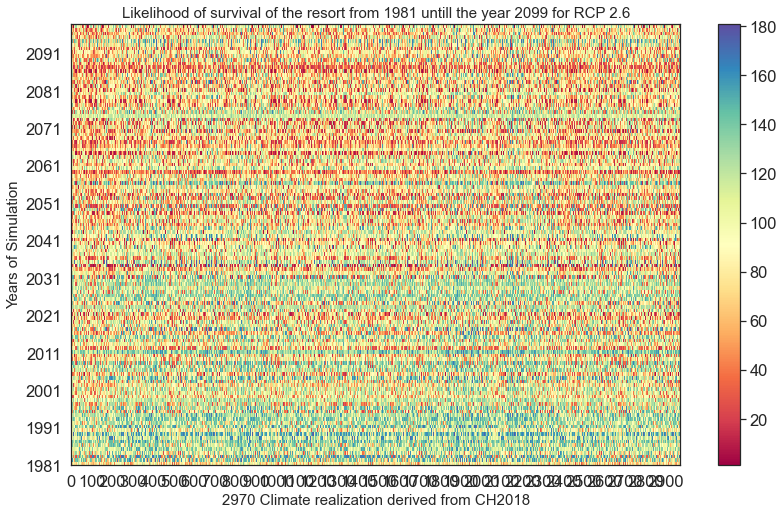

In [127]:
fig25, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df26_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

c3 = ax3.pcolor(Z, cmap='Spectral')
cb3 = fig25.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays26), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays26)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 2.6), fontsize=15)

fig25.tight_layout()
plt.show()

### Survival AMap CH2018 RCP4.5

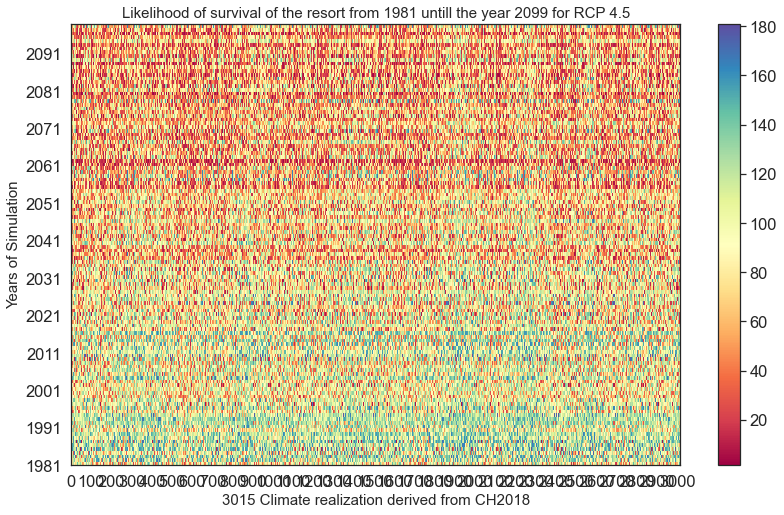

In [128]:
fig26, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df45_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='Spectral')
cb3 = fig26.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays45), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays45)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 4.5), fontsize=15)

fig26.tight_layout()
plt.show()

### Survival Map CH2018 RCP8.5

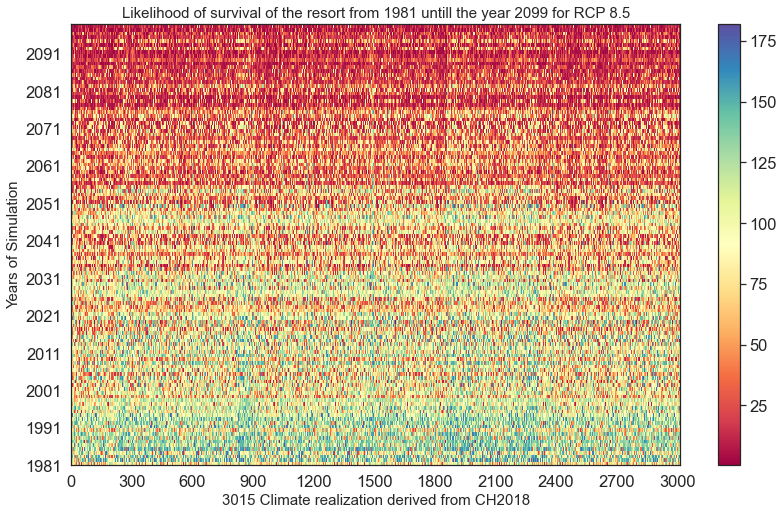

In [129]:
fig27, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df85_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='Spectral')

cb3 = fig27.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays85), step=300)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays85)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 8.5), fontsize=15)

fig27.tight_layout()
plt.show()

## 3 years of not having good snow days in 10 years

### version 1: fixed threshold

In [259]:
def tipping_points_freq(df):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    dfColumns= df.columns
    
    scenarios_length= len(dfColumns)
    simulations_Length = len(df[dfColumns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df[dfColumns[i]].iloc[j]) < 100.0:
                m += 1
                if m == 3:
                    tipping_freq[i] += 1
                    m = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                continue    
                #break
    return tipping_freq

### version 2: dynamic threshold

In [260]:
def tipping_points_freq2(df2, threshold):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    df2Columns= df2.columns
    
    scenarios_length= len(df2Columns)
    simulations_Length = len(df2[df2Columns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        mm = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df2[df2Columns[i]].iloc[j]) < threshold[i-1] -10:
                m += 1
                mm += 1
                if m == 3:
                    if mm <= 10:
                        tipping_freq[i] += 1
                        m = 0
                        mm = 0
                else:
                    if mm > 10:
                        m = 0
                        mm = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                mm = 0
                continue    
                #break
    return tipping_freq

### version 3: Time rolling and policy selection added

In [261]:
def tipping_points_freq3(df3, threshold, beginningYear, endYear, policy, tippingpoint_threshold, scenario):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    df3Columns= df3.columns
    
    scenarios_length= len(df3Columns)
    #simulations_Length = len(df3[df3Columns[1]])
    simulations_Length = endYear - beginningYear + 1
    statring_year = beginningYear - 1981 
    tipping_freq = np.zeros(scenarios_length)
    goodPolicy = []
    goodScenario = []
    goodTippingPoint = []
    
    for i in range (1, scenarios_length, 1):
        m = 0
        mm = 0
        for j in range (1 + statring_year, statring_year + simulations_Length + 1, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            mm += 1
            if float(df3[df3Columns[i]].iloc[j]) < threshold[i-1]:
                m += 1
                if m == 3:
                    if mm <= 10:
                        tipping_freq[i] += 1
                        m = 0
                        mm = 0
                else:
                    if mm > 10:
                        m = 0
                        mm = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                if mm > 10:
                    m = 0
                    mm = 0
                #continue    
                #break
                
        if tipping_freq[i] < tippingpoint_threshold:
            goodPolicy.append(policy[i-1])
            goodScenario.append(scenario[i-1])
            goodTippingPoint.append(tipping_freq[i])
        else:
            continue
            
    return tipping_freq, goodTippingPoint, goodPolicy, goodScenario

In [262]:
df26_all.shape

(118, 2971)

In [263]:
filt_S26 = (df_final_ema['xRCP'] == 1)
thresholds_26 = df_final_ema.loc[filt_S26, 'xGoodDays']
thresholds_26_m = thresholds_26.to_numpy()
thresholds_26_pol = df_final_ema.loc[filt_S26, 'policy']
thresholds_26_pol_m = thresholds_26_pol.to_numpy()
thresholds_26_sce = df_final_ema.loc[filt_S26, 'scenario']
thresholds_26_sce_m = thresholds_26_sce.to_numpy()

filt_S45 = (df_final_ema['xRCP'] == 2)
thresholds_45 = df_final_ema.loc[filt_S45, 'xGoodDays']
thresholds_45_m = thresholds_45.to_numpy()
thresholds_45_pol = df_final_ema.loc[filt_S45, 'policy']
thresholds_45_pol_m = thresholds_45_pol.to_numpy()
thresholds_45_sce = df_final_ema.loc[filt_S45, 'scenario']
thresholds_45_sce_m = thresholds_45_sce.to_numpy()

filt_S85 = (df_final_ema['xRCP'] == 3)
thresholds_85 = df_final_ema.loc[filt_S85, 'xGoodDays']
thresholds_85_m = thresholds_85.to_numpy()
thresholds_85_pol = df_final_ema.loc[filt_S85, 'policy']
thresholds_85_pol_m = thresholds_85_pol.to_numpy()
thresholds_85_sce = df_final_ema.loc[filt_S85, 'scenario']
thresholds_85_sce_m = thresholds_85_sce.to_numpy()


In [264]:
type(df26_all)

pandas.core.frame.DataFrame

In [265]:
thresholds_85_sce_m

array([  0,   2,  10, ..., 189, 194, 195], dtype=int64)

In [266]:
thresholds_45_sce_m

array([  1,   3,   6, ..., 196, 198, 199], dtype=int64)

In [267]:
df26_allColumns = df26_all.columns

In [268]:
df26_all[df26_allColumns[1]].iloc[0]

'127.04277777777777'

In [269]:
df26_all.head()

,Season,sc_1_['isOverSnow_sc_26_4'],sc_2_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_3_['isOverSnow_sc_26_6'],sc_4_['isOverSnow_sc_26_11'],sc_5_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_6_['isOverSnow_sc_26_3'],sc_7_['isOverSnow_sc_26_10'],sc_8_['isOverSnow_sc_26_4'],sc_9_['isOverSnow_sc_26_5'],sc_10_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_11_['isOverSnow_sc_26_5'],sc_12_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_13_['isOverSnow_sc_26_11'],sc_14_['isOverSnow_sc_26_4'],sc_15_['isOverSnow_sc_26_11'],sc_16_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_17_['isOverSnow_sc_26_10'],sc_18_['isOverSnow_sc_26_8'],sc_19_['isOverSnow_sc_26_6'],sc_20_['isOverSnow_sc_26_7'],sc_21_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_22_['isOverSnow_sc_26_6'],sc_23_['isOverSnow_sc_26_3'],sc_24_['isOverSnow_sc_26_9'],sc_25_['isOverSnow_sc_26_7'],sc_26_['isOverSnow_sc_26_8'],sc_27_['isOverSnow_sc_26_6'],sc_28_['isOverSnow_sc_26_8'],sc_29_['isOverSnow_sc_26_9'],sc_30_['isOverSnow_sc_26_8'],sc_31_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_32_['isOverSnow_sc_26_9'],sc_33_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],...,sc_2937_['isOverSnow_sc_26_3'],sc_2938_['isOverSnow_sc_26_8'],sc_2939_['isOverSnow_sc_26_1'],sc_2940_['isOverSnow_sc_26_6'],sc_2941_['isOverSnow_sc_26_11'],sc_2942_['isOverSnow_sc_26_9'],sc_2943_['isOverSnow_sc_26_11'],sc_2944_['isOverSnow_sc_26_10'],sc_2945_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2946_['isOverSnow_sc_26_7'],sc_2947_['isOverSnow_sc_26_1'],sc_2948_['isOverSnow_sc_26_10'],sc_2949_['isOverSnow_sc_26_11'],sc_2950_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_2951_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2952_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_2953_['isOverSnow_sc_26_12'],sc_2954_['isOverSnow_sc_26_6'],sc_2955_['isOverSnow_sc_26_10'],sc_2956_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2957_['isOverSnow_sc_26_3'],sc_2958_['isOverSnow_sc_26_1'],sc_2959_['isOverSnow_sc_26_5'],sc_2960_['isOverSnow_sc_26_11'],sc_2961_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2962_['isOverSnow_sc_26_8'],sc_2963_['isOverSnow_sc_26_9'],sc_2964_['isOverSnow_sc_26_10'],sc_2965_['isOverSnow_sc_26_12'],sc_2966_['isOverSnow_sc_26_3'],sc_2967_['isOverSnow_sc_26_3'],sc_2968_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2969_['isOverSnow_sc_26_9'],sc_2970_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp']
0,1981-1982,127.04277777777777,87.9063793103448,38.007379310344845,72.31937931034487,41.047137931034484,26.129931034482752,43.12675862068964,100.69534482758624,69.19637931034481,56.756259259259295,90.26455172413795,79.74637931034479,55.91082758620687,99.92474074074073,88.06313793103448,47.87941379310344,63.799310344827596,95.94841379310346,75.17296551724138,69.74517241379314,50.15324137931037,54.99306896551724,21.69518518518518,74.52896551724143,113.74489655172414,90.16179310344828,75.40279310344827,101.12448275862072,63.8913448275862,99.49796296296293,77.22034482758623,54.70451724137931,62.02517241379311,...,22.52961538461538,100.22019230769229,94.73415384615383,82.68061538461538,99.82638461538463,74.52561538461538,102.67396153846154,52.00557692307693,105.58407692307695,73.93734615384615,80.62157692307687,74.57715384615383,110.23148148148151,105.4080769230769,53.63684615384615,99.69434615384615,115.87938461538452,63.98365384615386,47.91688461538461,61.43048148148153,28.7275,103.09415384615384,70.21523076923076,84.32507692307694,93.6177307692308,101.26318518518521,110.46603846153849,49.79649999999999,72.07276923076923,47.87815384615386,33.159230769230795,95.00257692307694,103.3158076923077,69.4702692307692
1,1982-1983,130.45748148148144,71.83741379310345,100.03420689655165,42.43006896551725,124.29596551724136,149.76279310344827,135.8437931034483,111.33968965517244,159.71355172413794,68.65574074074074,71.44258620689655,138.3568620689655,83.03206896551724,105.66211111111112,44.11120689655172,148.61068965517234,56.091103448275

In [270]:
thresholds_45_sce_m.shape

(3015,)

In [271]:
#print(thresholds_85.shape)
print(type(thresholds_85_m))
print(thresholds_85_m[1])
print(thresholds_85_pol_m[20])
print(thresholds_85_sce_m[20])

<class 'numpy.ndarray'>
60.0
0
55


In [272]:
T1RCP26 = tipping_points_freq(df26_all)
T1RCP45 = tipping_points_freq(df45_all)
T1RCP85 = tipping_points_freq(df85_all)

In [273]:
T1RCP26_m = tipping_points_freq2(df26_all, thresholds_26_m)
T1RCP45_m = tipping_points_freq2(df45_all, thresholds_45_m)
T1RCP85_m = tipping_points_freq2(df85_all, thresholds_85_m)

In [274]:
T1RCP26_m_3 , tipping26_3, scenario26_3, policy26_3= tipping_points_freq3(df26_all, thresholds_26_m, 1981, 2097, thresholds_26_pol_m, 10, thresholds_26_sce_m)
T1RCP45_m_3 , tipping45_3, scenario45_3, policy45_3= tipping_points_freq3(df45_all, thresholds_45_m, 1981, 2097, thresholds_45_pol_m, 10, thresholds_45_sce_m)
T1RCP85_m_3 , tipping85_3, scenario85_3, policy85_3= tipping_points_freq3(df85_all, thresholds_85_m, 1981, 2097, thresholds_85_pol_m, 10, thresholds_85_sce_m)

In [276]:
print(len( policy26_3))
print(len( policy45_3))
print(len( policy85_3))

1195
466
50


In [277]:
print(len(scenario26_3))
print(len(scenario45_3))
print(len(scenario85_3))

1195
466
50


In [278]:
print(len(tipping26_3))
print(len(tipping45_3))
print(len(tipping85_3))

1195
466
50


In [279]:
print(len(T1RCP26_m_3))
print(len(T1RCP45_m_3))
print(len(T1RCP85_m_3))

2971
3016
3016


In [280]:
print(len(T1RCP26[1:]))
print(len(T1RCP45[1:]))
print(len(T1RCP85[1:]))

2970
3015
3015


In [281]:
type(T1RCP85)

numpy.ndarray

In [282]:
T1RCP85.shape

(3016,)

In [283]:
print(type(T1RCP85_m_3))
print(type(scenario85_3))
print(type(policy85_3))

<class 'numpy.ndarray'>
<class 'list'>
<class 'list'>


In [284]:
tipping26_3_df = pd.DataFrame(tipping26_3, columns =['tippingPoint26'])
tipping45_3_df = pd.DataFrame(tipping45_3, columns =['tippingPoint45'])
tipping85_3_df = pd.DataFrame(tipping85_3, columns =['tippingPoint85'])

scenario26_m_3 = pd.DataFrame(scenario26_3, columns =['Scenario26'])
scenario45_m_3 = pd.DataFrame(scenario45_3, columns =['Scenario45'])
scenario85_m_3 = pd.DataFrame(scenario85_3, columns =['Scenario85'])

policy26_m_3 = pd.DataFrame(policy26_3, columns =['Policy26'])
policy45_m_3 = pd.DataFrame(policy45_3, columns =['Policy45'])
policy85_m_3 = pd.DataFrame(policy85_3, columns =['Policy85'])

In [285]:
df_final_tipping_point = pd.concat((tipping26_3_df, scenario26_m_3, policy26_m_3, 
                                    tipping45_3_df, scenario45_m_3, policy45_m_3,
                                    tipping85_3_df, scenario85_m_3, policy85_m_3), axis = 1)

df_final_tipping_point.head(38)

,tippingPoint26,Scenario26,Policy26,tippingPoint45,Scenario45,Policy45,tippingPoint85,Scenario85,Policy85
0,3.0,0,4,8.0,0.0,1.0,7.0,0.0,0.0
1,3.0,0,5,8.0,0.0,3.0,6.0,0.0,10.0
2,6.0,0,9,8.0,0.0,34.0,7.0,0.0,25.0
3,7.0,0,16,8.0,0.0,53.0,6.0,1.0,31.0
4,8.0,0,24,2.0,0.0,56.0,7.0,1.0,39.0
5,3.0,0,27,7.0,0.0,77.0,9.0,1.0,79.0
6,8.0,0,33,8.0,0.0,80.0,8.0,3.0,64.0
7,2.0,0,38,8.0,0.0,92.0,7.0,3.0,75.0
8,2.0,0,40,4.0,0.0,111.0,8.0,4.0,10.0
9,8.0,0,45,8.0,0.0,136.0,9.0,4.0,18.0


### Specify the number of runs
for instance : number_Simulations = 9000

In [286]:
number_Simulations = 9000
x_axis = np.arange(1,number_Simulations + 2)

In [287]:
print("The lengthe of Y is: {}".format(len(T1RCP26[1:])))
print("The lengthe of X is: {}".format(len(matrix_GoodDays26) + 1 -1))
print('***')
print("The lengthe of Y is: {}".format(len(T1RCP45[1:])))
print("The lengthe of X is: {}".format((len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1) -(len(matrix_GoodDays26) + 1)))
print('***')
print("The lengthe of Y is: {}".format(len(T1RCP85[1:])))
print("The lengthe of X is: {}".format(number_Simulations+1 - (len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1)))

The lengthe of Y is: 2970
The lengthe of X is: 2970
***
The lengthe of Y is: 3015
The lengthe of X is: 3015
***
The lengthe of Y is: 3015
The lengthe of X is: 3015


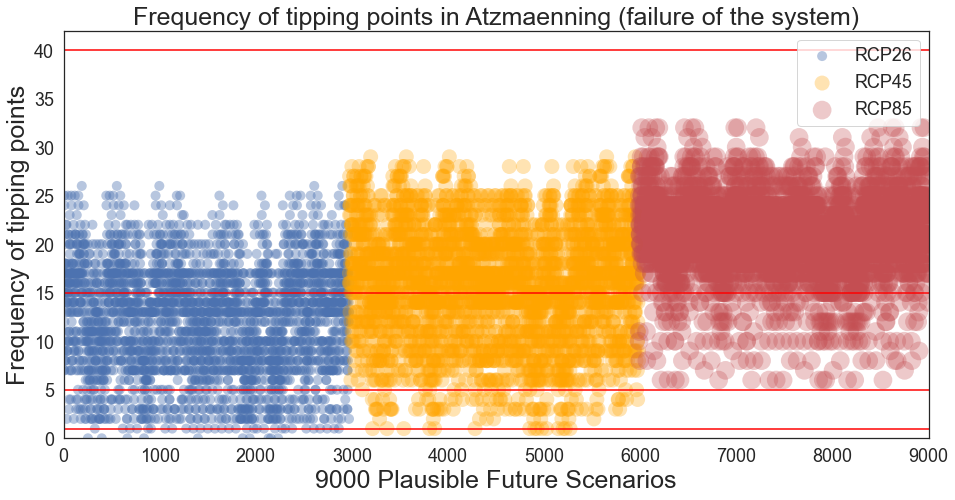

In [288]:
fig28, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (failure of the system)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig28.savefig(os.path.join(rootVisualization, 'tipping_point_All.svg'), format='svg', dpi=1200)
fig28.savefig(os.path.join(rootVisualization, 'tipping_point_All.tiff'), format='tiff', dpi=150)

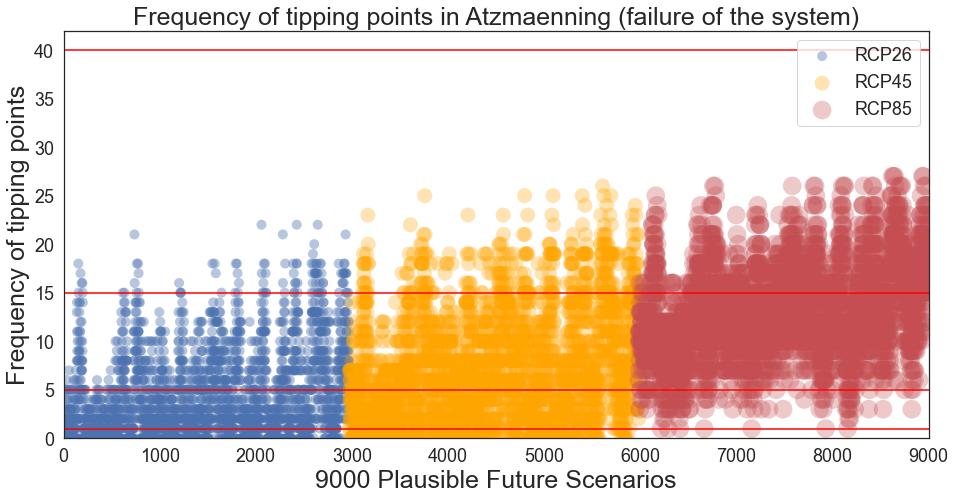

In [289]:
fig29, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (failure of the system)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig29.savefig(os.path.join(rootVisualization, 'tipping_point_All_new.svg'), format='svg', dpi=1200)
fig29.savefig(os.path.join(rootVisualization, 'tipping_point_All_new.tiff'), format='tiff', dpi=150)

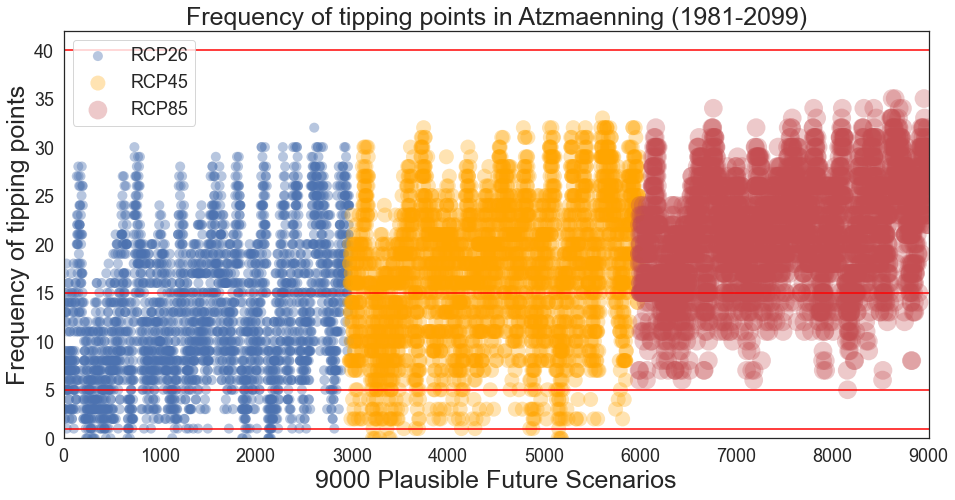

In [290]:
fig30, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (1981-2099)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig30.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3.svg'), format='svg', dpi=1200)
fig30.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3.tiff'), format='tiff', dpi=150)

### Check the 45 policies

In [292]:
df_final_ema[filt_S]

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
1,1.279832,1090.643646,5.876523,-1.907386,2.341139,0.17416,2.0,270.0,60.0,1,0,UZHModel,86.052021,15,86.943407,137.121037,137.777926,123.560296,122.345889,150.362481,142.617444,117.216556,118.825333,71.162407,128.546296,146.028741,121.779000,95.342074,130.789704,118.622296,107.811963,41.638926,64.647222,89.610889,...,69.493630,44.571296,36.839444,108.824667,88.817593,16.833630,61.204333,85.803481,82.735741,30.741370,98.667148,73.126111,87.578815,96.008926,65.707481,33.709926,11.569963,38.792556,38.564185,91.885370,145.210407,108.817259,63.485667,112.860000,18.829741,116.935407,82.296296,12.088296,95.190889,55.630296,44.37339,3.394322,0.762868,1.0
201,1.279832,1090.643646,5.876523,-1.907386,2.341139,0.17416,2.0,220.0,60.0,1,1,UZHModel,93.916985,15,99.797227,142.756864,141.982682,127.711364,125.307909,156.818273,147.735818,132.065773,129.027727,87.227591,138.486409,149.817545,127.480409,103.189909,145.216727,123.171636,116.705500,51.003136,73.826364,98.566773,...,84.982545,54.701136,44.036409,114.196136,104.405500,20.659455,68.998227,95.387955,92.172045,37.728045,108.595409,79.720409,93.900909,105.971909,74.503636,41.371273,14.199500,44.473091,47.328773,98.907045,146.514455,112.234455,70.073227,116.691500,23.109227,118.738909,88.436182,14.835636,98.349273,65.188045,44.37339,4.629153,0.783345,1.0
401,1.279832,1090.643646,5.876523,-1.907386,2.341139,0.17416,2.0,220.0,90.0,1,2,UZHModel,93.916985,15,99.797227,142.756864,141.982682,127.711364,125.307909,156.818273,147.735818,132.065773,129.027727,87.227591,138.486409,149.817545,127.480409,103.189909,145.216727,123.171636,116.705500,51.003136,73.826364,98.566773,...,84.982545,54.701136,44.036409,114.196136,104.405500,20.659455,68.998227,95.387955,92.172045,37.728045,108.595409,79.720409,93.900909,105.971909,74.503636,41.371273,14.199500,44.473091,47.328773,98.907045,146.514455,112.234455,70.073227,116.691500,23.109227,118.738909,88.436182,14.835636,98.349273,65.188045,44.37339,4.629153,0.721660,4.0
601,1.279832,1090.643646,5.876523,-1.907386,2.341139,0.17416,2.0,220.0,60.0,1,3,UZHModel,93.916985,15,99.797227,142.756864,141.982682,127.711364,125.307909,156.818273,147.735818,132.065773,129.027727,87.227591,138.486409,149.817545,127.480409,103.189909,145.216727,123.171636,116.705500,51.003136,73.826364,98.566773,...,84.982545,54.701136,44.036409,114.196136,104.405500,20.659455,68.998227,95.387955,92.172045,37.728045,108.595409,79.720409,93.900909,105.971909,74.503636,41.371273,14.199500,44.473091,47.328773,98.907045,146.514455,112.234455,70.073227,116.691500,23.109227,118.738909,88.436182,14.835636,98.349273,65.188045,44.37339,4.629153,0.783345,1.0
801,1.279832,1090.643646,5.876523,-1.907386,2.341139,0.17416,2.0,260.0,60.0,1,4,UZHModel,87.581767,15,89.288808,138.216923,138.837077,124.312615,122.935077,151.472154,143.603346,120.333769,120.626308,73.899423,130.398962,146.957885,122.797808,97.302885,133.926808,119.415462,109.406692,43.240423,66.573308,91.541538,...,72.166462,46.285577,38.234077,110.081231,91.767885,17.481077,62.558346,87.760077,84.624346,31.923731,100.510385,74.400192,88.878385,97.951731,67.311615,35.006462,12.014962,39.942577,40.047423,93.171423,145.517885,109.425615,64.812115,113.585385,19.553962,117.240615,83.615385,12.553231,95.819962,57.616077,44.37339,3.525254,0.767035,1.0
1001,1.279832,1090.643646,5.876523,-1.907386,2.341139,0.17416,2.0,290.0,70.0,1,5,UZHModel,83.090101,15,82.

In [293]:
T1RCP26_m_3_1980 , tipping26_3_1980, scenario26_3_1980, policy26_3_1980= tipping_points_freq3(df26_all, thresholds_26_m, 1981, 2010, thresholds_26_pol_m, 30, thresholds_26_sce_m)
T1RCP45_m_3_1980 , tipping45_3_1980, scenario45_3_1980, policy45_3_1980= tipping_points_freq3(df45_all, thresholds_45_m, 1981, 2010, thresholds_45_pol_m, 30, thresholds_45_sce_m)
T1RCP85_m_3_1980 , tipping85_3_1980, scenario85_3_1980, policy85_3_1980= tipping_points_freq3(df85_all, thresholds_85_m, 1981, 2010, thresholds_85_pol_m, 30, thresholds_85_sce_m)

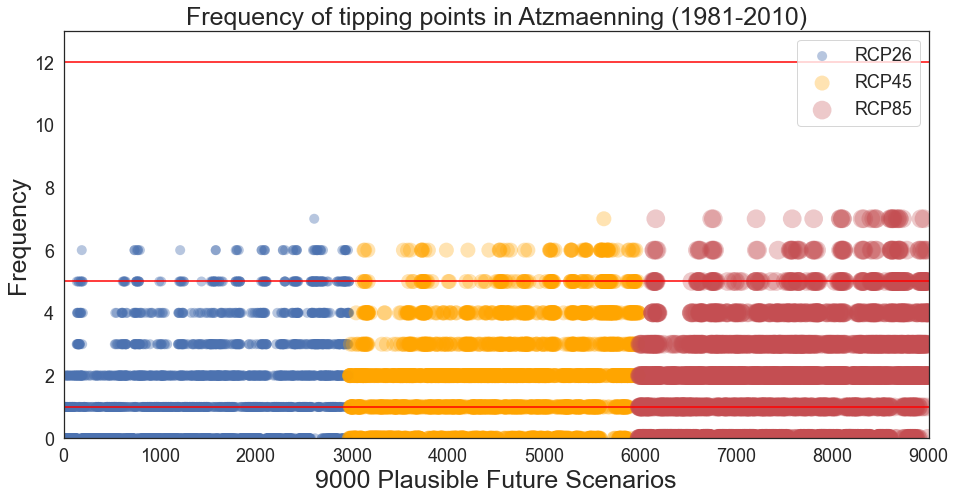

In [294]:
fig31, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_1980[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_1980[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_1980[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (1981-2010)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig31.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_1981.svg'), format='svg', dpi=600)
fig31.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_1981.tiff'), format='tiff', dpi=150)

In [295]:
type(T1RCP85_m_3_1980)

numpy.ndarray

In [296]:
T1RCP26_m_3_1980_df = pd.DataFrame(T1RCP26_m_3_1980, columns =['tippingPoint26_1980'])
tipping26_3_1980_df = pd.DataFrame(tipping26_3_1980, columns =['tippingPoint26_1_1980'])
scenario26_3_1980_df = pd.DataFrame(scenario26_3_1980, columns =['scenario26_1980'])
policy26_3_1980_df = pd.DataFrame(policy26_3_1980, columns =['policy26_1980'])

T1RCP45_m_3_1980_df = pd.DataFrame(T1RCP45_m_3_1980, columns =['tippingPoint45_1980'])
tipping45_3_1980_df = pd.DataFrame(tipping45_3_1980, columns =['tippingPoint45_1_1980'])
scenario45_3_1980_df = pd.DataFrame(scenario45_3_1980, columns =['scenario45_1980'])
policy45_3_1980_df = pd.DataFrame(policy45_3_1980, columns =['policy45_1980'])

T1RCP85_m_3_1980_df = pd.DataFrame(T1RCP85_m_3_1980, columns =['tippingPoint85_1980'])
tipping85_3_1980_df = pd.DataFrame(tipping85_3_1980, columns =['tippingPoint85_1_1980'])
scenario85_3_1980_df = pd.DataFrame(scenario85_3_1980, columns =['scenario85_1980'])
policy85_3_1980_df = pd.DataFrame(policy85_3_1980, columns =['policy85_1980'])

In [297]:
df_final_tipping_point_1980 = pd.concat((tipping26_3_1980_df, scenario26_3_1980_df, policy26_3_1980_df,
                                         tipping45_3_1980_df, scenario45_3_1980_df, policy45_3_1980_df,
                                         tipping85_3_1980_df, scenario85_3_1980_df, policy85_3_1980_df), axis = 1)
df_final_tipping_point_1980.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_1980.csv'), index = False)

In [298]:
print(T1RCP26_m_3_1980_df['tippingPoint26_1980'].value_counts())
print(T1RCP45_m_3_1980_df['tippingPoint45_1980'].value_counts())
print(T1RCP85_m_3_1980_df['tippingPoint85_1980'].value_counts())

0.0    1211
2.0     566
1.0     545
3.0     285
4.0     168
5.0     147
6.0      48
7.0       1
Name: tippingPoint26_1980, dtype: int64
0.0    799
2.0    760
1.0    601
4.0    337
3.0    307
5.0    142
6.0     69
7.0      1
Name: tippingPoint45_1980, dtype: int64
0.0    834
2.0    680
1.0    491
3.0    447
4.0    285
5.0    181
6.0     68
7.0     30
Name: tippingPoint85_1980, dtype: int64


In [299]:
print(tipping26_3_1980_df['tippingPoint26_1_1980'].value_counts())
print(tipping45_3_1980_df['tippingPoint45_1_1980'].value_counts())
print(tipping85_3_1980_df['tippingPoint85_1_1980'].value_counts())

0.0    1210
2.0     566
1.0     545
3.0     285
4.0     168
5.0     147
6.0      48
7.0       1
Name: tippingPoint26_1_1980, dtype: int64
0.0    798
2.0    760
1.0    601
4.0    337
3.0    307
5.0    142
6.0     69
7.0      1
Name: tippingPoint45_1_1980, dtype: int64
0.0    833
2.0    680
1.0    491
3.0    447
4.0    285
5.0    181
6.0     68
7.0     30
Name: tippingPoint85_1_1980, dtype: int64


In [300]:
print(scenario26_3_1980_df['scenario26_1980'].value_counts())
print(scenario45_3_1980_df['scenario45_1980'].value_counts())
print(scenario85_3_1980_df['scenario85_1980'].value_counts())

43    66
42    66
38    66
36    66
34    66
32    66
30    66
28    66
26    66
24    66
22    66
20    66
18    66
16    66
14    66
12    66
10    66
8     66
6     66
4     66
2     66
40    66
44    66
41    66
1     66
39    66
37    66
35    66
33    66
31    66
29    66
27    66
25    66
23    66
21    66
19    66
17    66
15    66
13    66
11    66
9     66
7     66
5     66
3     66
0     66
Name: scenario26_1980, dtype: int64
43    67
42    67
38    67
36    67
34    67
32    67
30    67
28    67
26    67
24    67
22    67
20    67
18    67
16    67
14    67
12    67
10    67
8     67
6     67
4     67
2     67
40    67
44    67
41    67
1     67
39    67
37    67
35    67
33    67
31    67
29    67
27    67
25    67
23    67
21    67
19    67
17    67
15    67
13    67
11    67
9     67
7     67
5     67
3     67
0     67
Name: scenario45_1980, dtype: int64
43    67
42    67
38    67
36    67
34    67
32    67
30    67
28    67
26    67
24    67
22    67
20    67
18    67
1

In [301]:
print(policy26_3_1980_df['policy26_1980'].value_counts())
print(policy45_3_1980_df['policy45_1980'].value_counts())
print(policy85_3_1980_df['policy85_1980'].value_counts())

197    45
96     45
156    45
148    45
142    45
134    45
132    45
128    45
124    45
120    45
118    45
116    45
108    45
106    45
104    45
100    45
94     45
191    45
90     45
86     45
76     45
72     45
66     45
54     45
52     45
48     45
40     45
38     45
36     45
24     45
16     45
14     45
168    45
170    45
174    45
186    45
181    45
173    45
169    45
167    45
165    45
163    45
155    45
151    45
149    45
131    45
123    45
109    45
103    45
97     45
85     45
81     45
71     45
63     45
61     45
59     45
49     45
45     45
41     45
33     45
27     45
19     45
9      45
5      45
190    45
4      45
Name: policy26_1980, dtype: int64
199    45
98     45
1      45
198    45
196    45
192    45
188    45
178    45
172    45
164    45
150    45
146    45
140    45
136    45
130    45
122    45
92     45
7      45
84     45
82     45
80     45
74     45
68     45
60     45
56     45
50     45
34     45
28     45
26     45
20     45
12    

In [302]:
T1RCP26_m_3_2020 , tipping26_3_2020, scenario26_3_2020, policy26_3_2020= tipping_points_freq3(df26_all, thresholds_26_m, 2020, 2049, thresholds_26_pol_m, 5, thresholds_26_sce_m)
T1RCP45_m_3_2020 , tipping45_3_2020, scenario45_3_2020, policy45_3_2020= tipping_points_freq3(df45_all, thresholds_45_m, 2020, 2049, thresholds_45_pol_m, 5, thresholds_45_sce_m)
T1RCP85_m_3_2020 , tipping85_3_2020, scenario85_3_2020, policy85_3_2020= tipping_points_freq3(df85_all, thresholds_85_m, 2020, 2049, thresholds_85_pol_m, 5, thresholds_85_sce_m)

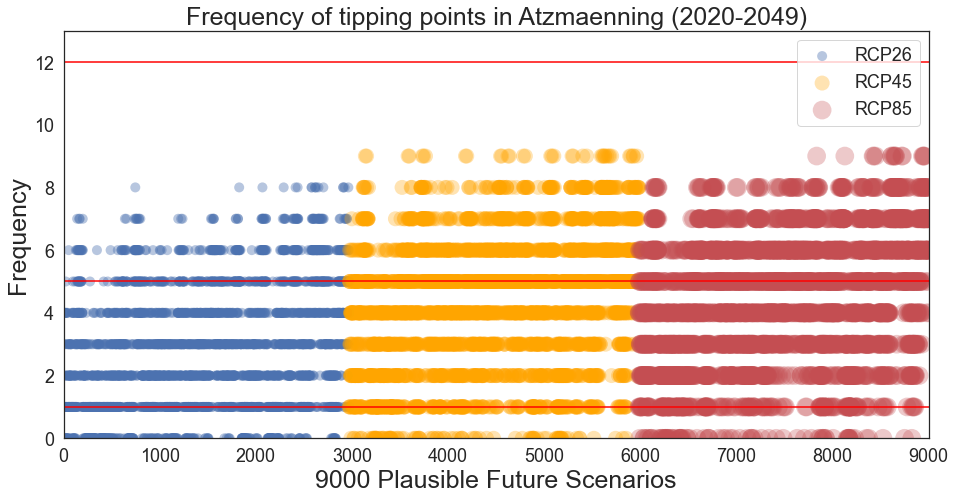

In [303]:
fig32, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2020[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2020[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2020[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2020-2049)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig32.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2020.svg'), format='svg', dpi=600)
fig32.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2020.tiff'), format='tiff', dpi=150)

In [304]:
T1RCP26_m_3_2020_df = pd.DataFrame(T1RCP26_m_3_2020, columns =['tippingPoint26_2020'])
tipping26_3_2020_df = pd.DataFrame(tipping26_3_2020, columns =['tippingPoint26_1_2020'])
scenario26_3_2020_df = pd.DataFrame(scenario26_3_2020, columns =['scenario26_2020'])
policy26_3_2020_df = pd.DataFrame(policy26_3_2020, columns =['policy26_2020'])

T1RCP45_m_3_2020_df = pd.DataFrame(T1RCP45_m_3_2020, columns =['tippingPoint45_2020'])
tipping45_3_2020_df = pd.DataFrame(tipping45_3_2020, columns =['tippingPoint45_1_2020'])
scenario45_3_2020_df = pd.DataFrame(scenario45_3_2020, columns =['scenario45_2020'])
policy45_3_2020_df = pd.DataFrame(policy45_3_2020, columns =['policy45_2020'])

T1RCP85_m_3_2020_df = pd.DataFrame(T1RCP85_m_3_2020, columns =['tippingPoint85_2020'])
tipping85_3_2020_df = pd.DataFrame(tipping85_3_2020, columns =['tippingPoint85_1_2020'])
scenario85_3_2020_df = pd.DataFrame(scenario85_3_2020, columns =['scenario85_2020'])
policy85_3_2020_df = pd.DataFrame(policy85_3_2020, columns =['policy85_2020'])

In [305]:
df_final_tipping_point_2020 = pd.concat((tipping26_3_2020_df, scenario26_3_2020_df, policy26_3_2020_df,
                                         tipping45_3_2020_df, scenario45_3_2020_df, policy45_3_2020_df,
                                         tipping85_3_2020_df, scenario85_3_2020_df, policy85_3_2020_df), axis = 1)
df_final_tipping_point_2020.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2020.csv'), index = False)

In [306]:
print(T1RCP26_m_3_2020_df['tippingPoint26_2020'].value_counts())
print(T1RCP45_m_3_2020_df['tippingPoint45_2020'].value_counts())
print(T1RCP85_m_3_2020_df['tippingPoint85_2020'].value_counts())

1.0    632
2.0    536
3.0    455
4.0    340
0.0    332
5.0    322
6.0    257
7.0     80
8.0     17
Name: tippingPoint26_2020, dtype: int64
5.0    580
4.0    471
6.0    463
3.0    327
1.0    309
2.0    293
7.0    288
8.0    155
0.0     94
9.0     36
Name: tippingPoint45_2020, dtype: int64
6.0    546
5.0    452
4.0    451
3.0    421
7.0    365
2.0    342
1.0    201
8.0    141
0.0     80
9.0     17
Name: tippingPoint85_2020, dtype: int64


In [307]:
print(tipping26_3_2020_df['tippingPoint26_1_2020'].value_counts())
print(tipping45_3_2020_df['tippingPoint45_1_2020'].value_counts())
print(tipping85_3_2020_df['tippingPoint85_1_2020'].value_counts())

1.0    632
2.0    536
3.0    455
4.0    340
0.0    331
Name: tippingPoint26_1_2020, dtype: int64
4.0    471
3.0    327
1.0    309
2.0    293
0.0     93
Name: tippingPoint45_1_2020, dtype: int64
4.0    451
3.0    421
2.0    342
1.0    201
0.0     79
Name: tippingPoint85_1_2020, dtype: int64


In [308]:
print(scenario26_3_2020_df['scenario26_2020'].value_counts())
print(scenario45_3_2020_df['scenario45_2020'].value_counts())
print(scenario85_3_2020_df['scenario85_2020'].value_counts())

3     66
7     65
4     65
33    65
17    65
28    65
32    65
5     65
10    65
19    64
42    64
0     64
6     64
37    64
1     63
16    63
14    62
35    62
13    62
22    61
20    60
8     60
29    60
38    59
30    59
26    58
25    57
12    53
15    52
21    52
41    43
24    42
9     41
18    40
43    37
34    36
2     35
23    31
11    25
27    25
44    22
31    20
36    17
40    16
39    15
Name: scenario26_2020, dtype: int64
32    61
4     61
6     60
10    58
3     58
28    57
17    54
5     52
7     51
0     51
1     50
33    47
19    47
16    46
37    43
42    43
35    42
14    41
13    40
20    39
30    38
29    38
8     38
38    37
26    36
22    34
25    32
12    30
15    29
21    25
41    23
9     19
24    18
18    17
34    12
2     12
23     9
43     9
27     7
36     7
11     6
44     5
31     4
40     4
39     3
Name: scenario45_2020, dtype: int64
4     64
32    63
3     61
6     61
28    59
10    59
17    56
1     55
5     54
7     54
33    53
0     53
19    51
1

In [309]:
print(policy26_3_2020_df['policy26_2020'].value_counts())
print(policy45_3_2020_df['policy45_2020'].value_counts())
print(policy85_3_2020_df['policy85_2020'].value_counts())

76     38
16     38
19     38
5      38
142    38
191    38
148    37
156    37
106    37
100    37
52     37
54     37
181    37
41     37
118    36
124    36
120    36
9      36
33     36
128    36
173    36
169    36
81     36
85     36
97     36
63     35
131    35
163    35
116    35
38     35
40     35
4      35
86     35
109    35
27     35
94     35
90     35
36     34
66     34
24     34
96     34
170    34
132    34
49     34
149    34
103    34
186    34
71     34
61     34
165    33
48     33
72     33
190    33
174    33
108    33
59     32
134    32
104    32
151    32
168    32
167    32
14     32
197    32
45     31
155    31
123    30
Name: policy26_2020, dtype: int64
164    29
136    28
50     27
196    27
68     27
147    26
73     26
115    25
84     25
139    25
12     25
145    25
157    25
129    24
141    24
1      24
187    24
177    24
7      24
11     24
111    24
23     24
140    23
21     23
188    23
89     23
121    23
17     22
65     22
77     22
8     

In [310]:
T1RCP26_m_3_2050 , tipping26_3_2050, scenario26_3_2050, policy26_3_2050= tipping_points_freq3(df26_all, thresholds_26_m, 2050, 2079, thresholds_26_pol_m, 5, thresholds_26_sce_m)
T1RCP45_m_3_2050 , tipping45_3_2050, scenario45_3_2050, policy45_3_2050= tipping_points_freq3(df45_all, thresholds_45_m, 2050, 2079, thresholds_45_pol_m, 5, thresholds_45_sce_m)
T1RCP85_m_3_2050 , tipping85_3_2050, scenario85_3_2050, policy85_3_2050= tipping_points_freq3(df85_all, thresholds_85_m, 2050, 2079, thresholds_85_pol_m, 5, thresholds_85_sce_m)

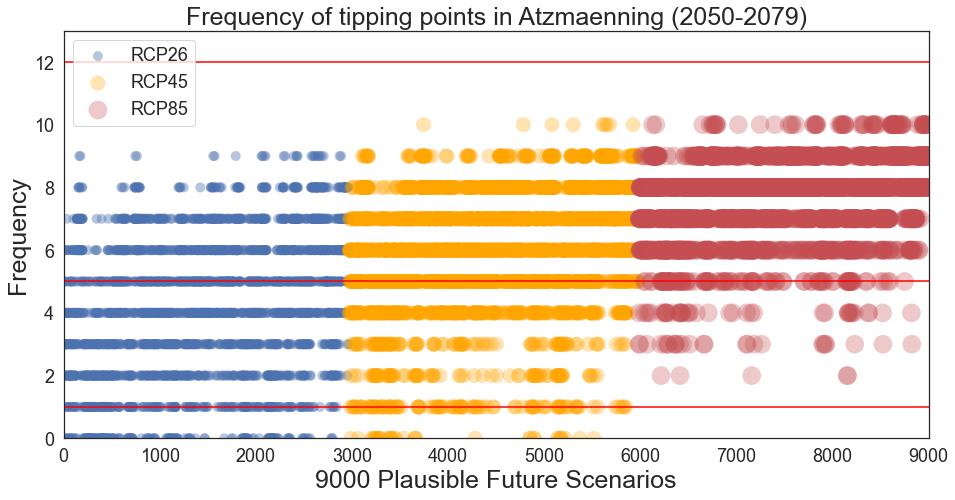

In [311]:
fig33, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2050[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2050[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2050[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2050-2079)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig33.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2050.svg'), format='svg', dpi=600)
fig33.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2050.tiff'), format='tiff', dpi=150)

In [312]:
T1RCP26_m_3_2050_df = pd.DataFrame(T1RCP26_m_3_2050, columns =['tippingPoint26_2050'])
tipping26_3_2050_df = pd.DataFrame(tipping26_3_2050, columns =['tippingPoint26_1_2050'])
scenario26_3_2050_df = pd.DataFrame(scenario26_3_2050, columns =['scenario26_2050'])
policy26_3_2050_df = pd.DataFrame(policy26_3_2050, columns =['policy26_2050'])

T1RCP45_m_3_2050_df = pd.DataFrame(T1RCP45_m_3_2050, columns =['tippingPoint45_2050'])
tipping45_3_2050_df = pd.DataFrame(tipping45_3_2050, columns =['tippingPoint45_1_2050'])
scenario45_3_2050_df = pd.DataFrame(scenario45_3_2050, columns =['scenario45_2050'])
policy45_3_2050_df = pd.DataFrame(policy45_3_2050, columns =['policy45_2050'])

T1RCP85_m_3_2050_df = pd.DataFrame(T1RCP85_m_3_2050, columns =['tippingPoint85_2050'])
tipping85_3_2050_df = pd.DataFrame(tipping85_3_2050, columns =['tippingPoint85_1_2050'])
scenario85_3_2050_df = pd.DataFrame(scenario85_3_2050, columns =['scenario85_2050'])
policy85_3_2050_df = pd.DataFrame(policy85_3_2050, columns =['policy85_2050'])

In [313]:
df_final_tipping_point_2050 = pd.concat((tipping26_3_2050_df, scenario26_3_2050_df, policy26_3_2050_df,
                                         tipping45_3_2050_df, scenario45_3_2050_df, policy45_3_2050_df,
                                         tipping85_3_2050_df, scenario85_3_2050_df, policy85_3_2050_df), axis = 1)
df_final_tipping_point_2050.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2050.csv'), index = False)

In [314]:
print(T1RCP26_m_3_2050_df['tippingPoint26_2050'].value_counts())
print(T1RCP45_m_3_2050_df['tippingPoint45_2050'].value_counts())
print(T1RCP85_m_3_2050_df['tippingPoint85_2050'].value_counts())

4.0    447
6.0    432
5.0    414
3.0    381
7.0    354
2.0    354
1.0    230
0.0    188
8.0    143
9.0     28
Name: tippingPoint26_2050, dtype: int64
6.0     642
7.0     579
8.0     505
5.0     451
4.0     316
9.0     180
1.0     111
3.0     105
2.0      82
0.0      36
10.0      9
Name: tippingPoint45_2050, dtype: int64
8.0     952
9.0     813
7.0     659
6.0     334
5.0     108
10.0     77
4.0      41
3.0      26
2.0       5
0.0       1
Name: tippingPoint85_2050, dtype: int64


In [315]:
print(tipping26_3_2050_df['tippingPoint26_1_2050'].value_counts())
print(tipping45_3_2050_df['tippingPoint45_1_2050'].value_counts())
print(tipping85_3_2050_df['tippingPoint85_1_2050'].value_counts())

4.0    447
3.0    381
2.0    354
1.0    230
0.0    187
Name: tippingPoint26_1_2050, dtype: int64
4.0    316
1.0    111
3.0    105
2.0     82
0.0     35
Name: tippingPoint45_1_2050, dtype: int64
4.0    41
3.0    26
2.0     5
Name: tippingPoint85_1_2050, dtype: int64


In [316]:
print(scenario26_3_2050_df['scenario26_2050'].value_counts())
print(scenario45_3_2050_df['scenario45_2050'].value_counts())
print(scenario85_3_2050_df['scenario85_2050'].value_counts())

28    62
4     62
3     61
32    61
10    60
6     58
17    57
0     55
7     55
5     54
1     53
16    51
33    50
19    49
42    47
14    47
35    45
37    44
13    43
8     39
26    39
22    38
29    36
20    36
12    35
30    35
38    35
25    30
15    30
21    29
24    25
41    21
34    20
9     15
43    15
18    14
23    14
2     14
27    12
40     9
11     9
39     9
31     9
44     9
36     8
Name: scenario26_2050, dtype: int64
4     38
32    37
6     36
3     34
28    32
10    31
17    28
19    25
0     25
5     24
33    23
42    22
7     22
1     22
16    21
14    20
35    19
13    16
29    15
37    15
20    15
22    14
8     14
30    13
26    12
38    12
12    11
25    10
41     8
15     8
21     6
24     4
34     4
9      2
11     2
18     2
23     2
2      2
43     2
36     1
Name: scenario45_2050, dtype: int64
6     9
4     8
32    7
28    6
0     4
1     4
17    4
5     4
7     4
33    3
3     3
16    3
10    3
42    2
37    2
35    2
14    2
8     1
19    1
Name: scena

In [317]:
print(policy26_3_2050_df['policy26_2050'].value_counts())
print(policy45_3_2050_df['policy45_2050'].value_counts())
print(policy85_3_2050_df['policy85_2050'].value_counts())

52     29
36     28
76     28
132    28
54     28
104    28
103    28
27     28
4      27
128    27
33     27
38     27
41     27
85     27
5      27
149    27
9      27
123    27
169    27
97     26
170    26
186    26
24     26
61     26
72     25
49     25
109    25
165    25
71     24
59     24
94     24
197    24
106    24
134    24
181    24
167    24
163    24
156    24
124    24
148    24
142    24
14     23
19     23
174    23
168    23
151    23
118    23
90     23
116    23
100    23
131    23
48     22
45     22
66     22
63     22
86     21
191    21
155    20
81     20
16     20
190    20
120    19
40     19
173    19
96     19
108    19
Name: policy26_2050, dtype: int64
12     15
164    14
68     14
136    14
145    13
93     13
80     12
34     12
50     12
127    12
161    12
147    12
23     11
56     11
143    11
82     11
129    11
175    11
17     11
187    11
89     11
77     11
84     11
137    11
198    10
60     10
53     10
99     10
119    10
140    10
122   

In [318]:
T1RCP26_m_3_2070 , tipping26_3_2070, scenario26_3_2070, policy26_3_2070= tipping_points_freq3(df26_all, thresholds_26_m, 2070, 2097, thresholds_26_pol_m, 5, thresholds_26_sce_m)
T1RCP45_m_3_2070 , tipping45_3_2070, scenario45_3_2070, policy45_3_2070= tipping_points_freq3(df45_all, thresholds_45_m, 2070, 2097, thresholds_45_pol_m, 5, thresholds_45_sce_m)
T1RCP85_m_3_2070 , tipping85_3_2070, scenario85_3_2070, policy85_3_2070= tipping_points_freq3(df85_all, thresholds_85_m, 2070, 2097, thresholds_85_pol_m, 5, thresholds_85_sce_m)

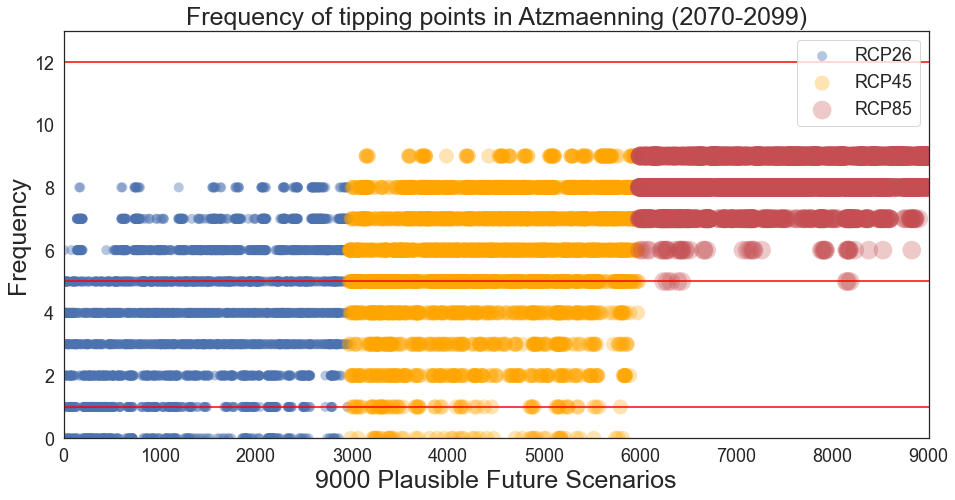

In [319]:
fig34, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2070[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2070[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2070[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2070-2099)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig34.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2070.svg'), format='svg', dpi=600)
fig34.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2070.tiff'), format='tiff', dpi=150)

In [320]:
T1RCP26_m_3_2070_df = pd.DataFrame(T1RCP26_m_3_2070, columns =['tippingPoint26_2070'])
tipping26_3_2070_df = pd.DataFrame(tipping26_3_2070, columns =['tippingPoint26_1_2070'])
scenario26_3_2070_df = pd.DataFrame(scenario26_3_2070, columns =['scenario26_2070'])
policy26_3_2070_df = pd.DataFrame(policy26_3_2070, columns =['policy26_2070'])

T1RCP45_m_3_2070_df = pd.DataFrame(T1RCP45_m_3_2070, columns =['tippingPoint45_2070'])
tipping45_3_2070_df = pd.DataFrame(tipping45_3_2070, columns =['tippingPoint45_1_2070'])
scenario45_3_2070_df = pd.DataFrame(scenario45_3_2070, columns =['scenario45_2070'])
policy45_3_2070_df = pd.DataFrame(policy45_3_2070, columns =['policy45_2070'])

T1RCP85_m_3_2070_df = pd.DataFrame(T1RCP85_m_3_2070, columns =['tippingPoint85_2070'])
tipping85_3_2070_df = pd.DataFrame(tipping85_3_2070, columns =['tippingPoint85_1_2070'])
scenario85_3_2070_df = pd.DataFrame(scenario85_3_2070, columns =['scenario85_2070'])
policy85_3_2070_df = pd.DataFrame(policy85_3_2070, columns =['policy85_2070'])

In [321]:
df_final_tipping_point_2070 = pd.concat((tipping26_3_2070_df, scenario26_3_2070_df, policy26_3_2070_df,
                                         tipping45_3_2070_df, scenario45_3_2070_df, policy45_3_2070_df,
                                         tipping85_3_2070_df, scenario85_3_2070_df, policy85_3_2070_df), axis = 1)
df_final_tipping_point_2070.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2070.csv'), index = False)

In [322]:
print(T1RCP26_m_3_2070_df['tippingPoint26_2070'].value_counts())
print(T1RCP45_m_3_2070_df['tippingPoint45_2070'].value_counts())
print(T1RCP85_m_3_2070_df['tippingPoint85_2070'].value_counts())

5.0    469
6.0    464
4.0    394
2.0    370
3.0    364
7.0    324
1.0    276
0.0    222
8.0     88
Name: tippingPoint26_2070, dtype: int64
6.0    600
8.0    577
7.0    521
5.0    471
4.0    267
3.0    173
2.0    168
9.0    111
1.0     71
0.0     57
Name: tippingPoint45_2070, dtype: int64
9.0    1338
8.0    1211
7.0     412
6.0      46
5.0       8
0.0       1
Name: tippingPoint85_2070, dtype: int64


In [323]:
print(tipping26_3_2070_df['tippingPoint26_1_2070'].value_counts())
print(tipping45_3_2070_df['tippingPoint45_1_2070'].value_counts())
print(tipping85_3_2070_df['tippingPoint85_1_2070'].value_counts())

4.0    394
2.0    370
3.0    364
1.0    276
0.0    221
Name: tippingPoint26_1_2070, dtype: int64
4.0    267
3.0    173
2.0    168
1.0     71
0.0     56
Name: tippingPoint45_1_2070, dtype: int64
Series([], Name: tippingPoint85_1_2070, dtype: int64)


In [324]:
print(scenario26_3_2070_df['scenario26_2070'].value_counts())
print(scenario45_3_2070_df['scenario45_2070'].value_counts())
print(scenario85_3_2070_df['scenario85_2070'].value_counts())

4     62
32    62
3     61
28    59
6     58
10    58
17    57
5     57
7     55
1     54
0     54
33    49
14    48
16    48
19    45
37    45
35    44
13    43
8     42
42    42
26    40
22    37
38    37
20    35
29    34
30    33
25    31
15    31
12    28
21    28
24    27
34    25
41    22
43    19
18    17
9     17
23    16
27    16
2     15
36    14
11    13
44    13
39    12
40    11
31    11
Name: scenario26_2070, dtype: int64
32    44
4     39
3     38
6     36
10    36
28    34
17    26
0     25
19    25
5     23
7     23
14    22
35    21
16    21
42    21
37    20
8     20
1     20
33    20
13    18
30    17
20    16
38    16
22    15
25    14
26    14
12    14
29    14
15    11
21    10
24     8
41     8
9      7
34     6
23     5
43     5
2      5
18     4
36     4
40     2
27     2
31     2
11     2
39     1
44     1
Name: scenario45_2070, dtype: int64
Series([], Name: scenario85_2070, dtype: int64)


In [325]:
print(policy26_3_2070_df['policy26_2070'].value_counts())
print(policy45_3_2070_df['policy45_2070'].value_counts())
print(policy85_3_2070_df['policy85_2070'].value_counts())

123    31
169    29
61     29
132    29
104    28
76     28
24     28
49     27
106    27
27     27
41     27
131    27
128    26
142    26
63     26
38     26
33     26
118    26
148    26
149    26
168    26
5      26
81     26
186    26
54     25
86     25
103    25
4      25
9      25
163    25
190    25
174    25
170    25
66     25
151    25
36     25
48     24
52     24
45     24
90     24
156    24
85     24
181    24
71     24
40     23
197    23
72     23
191    23
167    23
134    23
109    23
100    23
97     23
108    22
116    22
96     22
155    22
16     22
14     22
120    21
59     21
19     21
94     21
124    21
165    20
173    20
Name: policy26_2070, dtype: int64
136    17
196    17
164    16
3      15
50     14
111    14
107    14
84     13
157    13
140    13
143    13
145    13
147    13
23     13
82     13
12     13
80     12
60     12
122    12
98     12
28     12
92     12
129    12
77     12
21     12
137    12
146    12
8      12
187    12
161    12
175   

### Tables of the paper: Uncertainty analysis of CH2018 randomness scenarios


In [ ]:
from scipy.integrate import simps

def area_max_min_df (df, a, b, lengthSim):

    max_scenario = np.array(df.max(axis=1))
    min_scenario = np.array(df.min(axis=1))
    
    # Compute the area using the composite trapezoidal rule.
    areamax1 = trapz(max_scenario[a:b], dx=1)
    areamin1 = trapz(min_scenario[a:b], dx=1)
    Uncertainty1 = ((areamax1 + areamin1)/2 )/ lengthSim
    
    # Compute the area using the composite Simpson's rule.
    areamax2 = simps(max_scenario[a:b], dx=1)
    areamin2 = simps(min_scenario[a:b], dx=1)
    Uncertainty2 = ((areamax2 + areamin2)/2 )/ lengthSim
    
    print("Start" + "**" * 30)
    print("Uncertainty Band1 ={} {}".format(Decimal(str(Uncertainty1)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("Uncertainty Band2 ={} {}".format(Decimal(str(Uncertainty2)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("**" * 20 +"End" + "\n")

    return
    #return    max_scenario, min_scenario, Uncertainty1, Uncertainty2

In [ ]:
max_scenario = df26_all.max(axis=1)
min_scenario = df26_all.min(axis=1)

In [ ]:
max_scenario.to_numpy()

In [ ]:
min_scenario.to_numpy()

In [ ]:
max_scenario.shape

## Changes in Good Days

In [ ]:
max_scenario.to_numpy()

In [ ]:
max_scenario.shape

In [ ]:
min_scenario.to_numpy()

In [ ]:
df26_all_1 = df26_all.iloc[:, 1:]
df45_all_1 = df45_all.iloc[:, 1:]
df85_all_1 = df85_all.iloc[:, 1:]

In [ ]:
print("1981-2010")
area_max_min_df(df26_all_1, 0, 30, 30)
area_max_min_df(df45_all_1, 0, 30, 30)
area_max_min_df(df85_all_1, 0, 30, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

In [ ]:
print("2021-2050")
area_max_min_df(df26_all_1, 40, 70, 30)
area_max_min_df(df45_all_1, 40, 70, 30)
area_max_min_df(df85_all_1, 40, 70, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

In [ ]:
print("2051-2080")
area_max_min_df(df26_all_1, 70, 100, 30)
area_max_min_df(df45_all_1, 70, 100, 30)
area_max_min_df(df85_all_1, 70, 100, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

In [ ]:
print("2071-2100")
area_max_min_df(df26_all_1, 90, 119, 30)
area_max_min_df(df45_all_1, 90, 119, 30)
area_max_min_df(df85_all_1, 90, 119, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)

## Changes in Financial situation

In [ ]:
df26_all_fin_1 = df26_all_fin.iloc[:, 1:]
df45_all_fin_1 = df45_all_fin.iloc[:, 1:]
df85_all_fin_1 = df85_all_fin.iloc[:, 1:]

In [ ]:
max_scenario = df26_all_fin_1.max(axis=1)
min_scenario = df26_all_fin_1.min(axis=1)

In [ ]:
print("1981-2010")
area_max_min_df(df26_all_fin_1, 0, 30, 30)
area_max_min_df(df45_all_fin_1, 0, 30, 30)
area_max_min_df(df85_all_fin_1, 0, 30, 30)

In [ ]:
print("2021-2050")
area_max_min_df(df26_all_fin_1, 40, 70, 30)
area_max_min_df(df45_all_fin_1, 40, 70, 30)
area_max_min_df(df85_all_fin_1, 40, 70, 30)

In [ ]:
print("2051-2080")
area_max_min_df(df26_all_fin_1, 70, 100, 30)
area_max_min_df(df45_all_fin_1, 70, 100, 30)
area_max_min_df(df85_all_fin_1, 70, 100, 30)


In [ ]:
print("2071-2100")
area_max_min_df(df26_all_fin_1, 90, 119, 30)
area_max_min_df(df45_all_fin_1, 90, 119, 30)
area_max_min_df(df85_all_fin_1, 90, 119, 30)

## Changes in Artificial Snow

In [ ]:
df26_all_Art_1 = df26_all_Art.iloc[:, 1:]
df45_all_Art_1 = df45_all_Art.iloc[:, 1:]
df85_all_Art_1 = df85_all_Art.iloc[:, 1:]

In [ ]:
print("1981-2010")
area_max_min_df(df26_all_Art_1, 0, 30, 30)
area_max_min_df(df45_all_Art_1, 0, 30, 30)
area_max_min_df(df85_all_Art_1, 0, 30, 30)

In [ ]:
print("2021-2050")
area_max_min_df(df26_all_Art_1, 40, 70, 30)
area_max_min_df(df45_all_Art_1, 40, 70, 30)
area_max_min_df(df85_all_Art_1, 40, 70, 30)

In [ ]:
print("2051-2080")
area_max_min_df(df26_all_Art_1, 70, 100, 30)
area_max_min_df(df45_all_Art_1, 70, 100, 30)
area_max_min_df(df85_all_Art_1, 70, 100, 30)

In [ ]:
print("2071-2100")
area_max_min_df(df26_all_Art_1, 90, 119, 30)
area_max_min_df(df45_all_Art_1, 90, 119, 30)
area_max_min_df(df85_all_Art_1, 90, 119, 30)

## End